In [1]:
%matplotlib inline

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import glob
import h5py

/home/fabiane/anaconda2/envs/mort1/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [4]:
import os
import sys
import time
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# pytorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torchvision import transforms
from torch.utils.data import Dataset, DataLoader, SubsetRandomSampler
from torch.nn.modules.module import Module

# sklearn functions
from sklearn.metrics import accuracy_score, roc_auc_score
from sklearn.model_selection import train_test_split, KFold

# load functions from nitorch
sys.path.insert(0,"/analysis/fabiane/phd/nitorch/")
from nitorch.data import load_nifti
from nitorch.transforms import  ToTensor, SagittalTranslate, SagittalFlip, \
                                AxialTranslate, normalization_factors, Normalize, \
                                IntensityRescale
from nitorch.callbacks import EarlyStopping, ModelCheckpoint
from nitorch.trainer import Trainer
from nitorch.initialization import weights_init
from nitorch.metrics import balanced_accuracy, sensitivity, specificity
from nitorch.utils import count_parameters

from itertools import product
from collections import OrderedDict, Counter

In [5]:
import random
from models_ms import ModelA, ModelB
from hyperparameter_options import params_liu as hyperparams

In [6]:
torch.__version__

'1.0.0'

In [7]:
gpu = 6
multi_gpus = None #[2, 3]
zero_one_normalize = False
zoom = 0.525

dtype = np.float64

In [8]:
# load mask
mask = None

In [9]:
train_h5 = h5py.File('/ritter/share/data/MS/CIS/train_dataset.h5', 'r')
holdout_h5 = h5py.File('/ritter/share/data/MS/CIS/holdout_dataset.h5', 'r')

In [10]:
X_holdout, y_holdout = holdout_h5['X'], holdout_h5['y']
X_train, y_train = train_h5['X'], train_h5['y']

In [11]:
X = np.concatenate([X_train, X_holdout])
y = np.concatenate([y_train, y_holdout])

In [12]:
# define dataset

In [13]:
to_tensor = ToTensor()

In [14]:
def draw_patch(img, patch_size):
    img_shape = img.shape
    patch_pot_locs = [[0, int(patch_size[dim]*0.5), patch_size[dim]] for dim in range(len(img_shape))]
    # check correct size
    for dim in range(len(img_shape)):
        assert(np.max(patch_pot_locs[dim]) + patch_size[dim] <= img_shape[dim])
    patch_locs = [random.choice(patch_pot_locs[dim]) for dim in range(len(img_shape))]
    #patch_locs = [patch_pot_locs[dim][1] for dim in range(len(img_shape))] ### Use the same patch each round
    patch = img[patch_locs[0]:patch_locs[0]+patch_size[0],
                patch_locs[1]:patch_locs[1]+patch_size[1],
                patch_locs[2]:patch_locs[2]+patch_size[2]]
    return patch

class ADNIDataset(Dataset):
    def __init__(self, X, y, transform=None, target_transform=None, mask=None, dtype=np.float32, patched=False):
        print(X.shape)
        self.X = np.tile(np.copy(X), 15)
        self.y = np.tile(np.copy(y), 15)
        #print(self.X.shape)
        #self.X = np.copy(X)
        #self.y = np.copy(y)
        
        self.transform = transform
        self.target_transform = target_transform
        self.mask = mask
        self.dtype = dtype
        self.patched = patched
        
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        image = self.X[idx]
        label = self.y[idx] >= 0.5
        label = torch.FloatTensor([label])
        
        if self.transform:
            image = self.transform(image)
        
        if self.patched:
            reshaped_img = image[8:85,10:105,5:85]
            patch_size = [s//k for s, k in zip(reshaped_img.shape, [2, 3, 2])]
            image = draw_patch(reshaped_img, patch_size)
        
        # normalize by max
        image /= np.max(image)
        
        image = to_tensor(image)
            
        sample = {"image" : image,
                 "label" : label}
        return sample


In [15]:
def draw_patch(img, patch_size, all_locs=False):
    """
    Draw a patch from the image based on the specified size. 
    By default draws randomly but setting all_locs = True
    returns all possible patches in a batch.
    
    Params:
        all_locs - set to True returns all patches
    """
    img_shape = img.shape
    patch_pot_locs = [[0, int(patch_size[dim]*0.5), patch_size[dim]] for dim in range(len(img_shape))]
    # check correct size
    for dim in range(len(img_shape)):
        assert(np.max(patch_pot_locs[dim]) + patch_size[dim] <= img_shape[dim])
        
    if all_locs:
        # return all locations
        patches = []
        #num_patches_per_dim = [reduce((lambda x, y: x*y), dim_list) for dim_list in patch_pot_locs]
        #num_patches_per_dim = [len(dim_list) for dim_list in patch_pot_locs]
        all_locs = list(product(*patch_pot_locs))
        for patch_locs in all_locs:
            patch = img[patch_locs[0]:patch_locs[0]+patch_size[0],
                    patch_locs[1]:patch_locs[1]+patch_size[1],
                    patch_locs[2]:patch_locs[2]+patch_size[2]]
            patches.append(patch)
        return patches
    else:
        # return random location
        patch_locs = [random.choice(patch_pot_locs[dim]) for dim in range(len(img_shape))]
        #patch_locs = [patch_pot_locs[dim][1] for dim in range(len(img_shape))] ### Use the same patch each round
        patch = img[patch_locs[0]:patch_locs[0]+patch_size[0],
                    patch_locs[1]:patch_locs[1]+patch_size[1],
                    patch_locs[2]:patch_locs[2]+patch_size[2]]
        return patch

class MSDataset(Dataset):
    def __init__(self, X, y, transform=None, target_transform=None, mask=None, z_factor=zoom, dtype=np.float32, patched=False, all_locs=False):
        self.X = np.tile(np.copy(X), 5)
        self.y = np.tile(np.copy(y), 5)
        self.transform = transform
        self.target_transform = target_transform
        self.mask = mask
        self.z_factor = zoom
        self.dtype = dtype
        self.patched = patched
        self.all_locs = all_locs
        
    def __len__(self):
        return len(self.X)
    
    def __getitem__(self, idx):
        image = self.X[idx]
        label = self.y[idx] >= 0.5
        label = torch.FloatTensor([label])
        
        if self.transform:
            image = self.transform(image)
            
        if self.patched:
            reshaped_img = image[8:85,10:105,5:85]
            patch_size = [s//k for s, k in zip(reshaped_img.shape, [2, 3, 2])]
            image = draw_patch(reshaped_img, patch_size, all_locs=self.all_locs)
        
        # normalize by max
        image /= np.max(image)
        
        image = to_tensor(image)
            
        sample = {"image" : image,
                 "label" : label}
        return sample

# Define the classifier

In [16]:
class ModelLiu(nn.Module):
    """
    3D Patch-based model from the paper: Multi-Modality Cascaded
    Convolutional Neural Networks for Alzheimer’s Disease Diagnosis
    https://link.springer.com/article/10.1007/s12021-018-9370-4#Sec2
    
    Implementation inspired by:
    https://github.com/Tristacheng/mutimodality_cnn
    """
    def __init__(self):
        super(ModelLiu, self).__init__()
        self.drp_rate = [0.1, 0.4]
        self.drop_conv = nn.Dropout3d(p=self.drp_rate[0])
        self.drop_embed = nn.Dropout3d(p=self.drp_rate[1]/2)        

        self.Conv_1 = nn.Conv3d(1, 15, kernel_size=3, stride=1, padding=0)
        self.pool_1 = nn.MaxPool3d(kernel_size=2, stride=2, padding=0)
        
        self.Conv_2 = nn.Conv3d(15, 25, kernel_size=3, stride=1, padding=(0, 1, 0))
        self.pool_2 = nn.MaxPool3d(kernel_size=2, stride=2, padding=0)

        self.Conv_3 = nn.Conv3d(25, 50, kernel_size=3, stride=1, padding=(1, 1, 0))
        self.pool_3 = nn.MaxPool3d(kernel_size=2, stride=2, padding=0)

        self.Conv_4 = nn.Conv3d(50, 50, kernel_size=3, stride=1, padding=0)



        self.classifier = nn.Sequential(
            nn.Linear(100, 40),
            nn.Tanh(),
            nn.Dropout3d(p=self.drp_rate[1]),
            nn.Linear(40, 1)
        )

    def encode(self, x, print_size=False):
        if print_size:
            print(x.shape)
        x = F.tanh(self.Conv_1(x))
        h = self.drop_conv(self.pool_1(x))
        if print_size:
            print(h.shape)
        x = F.tanh(self.Conv_2(h))
        h = self.drop_conv(self.pool_2(x))
        if print_size:
            print(h.shape)
        x = F.tanh(self.Conv_3(h))
        h = self.drop_conv(self.pool_3(x))
        if print_size:
            print(h.shape)
        x = F.tanh(self.Conv_4(h))
        h = self.drop_embed(x)
        if print_size:
            print(h.shape)
        return h

    def forward(self, x):
        print_size = False
        x = self.encode(x, print_size=print_size)
        x = self.flatten(x)
        x = self.classifier(x)
        return x
    
    def flatten(self, x):
        return x.view(x.size(0), -1)

In [17]:
def pick_model(name):
    if name == "ModelA":
        net = ModelA()
    elif name == "ModelB":
        net = ModelB()
    elif name == "ModelAPIF":
        net = ModelAPIF()
    elif name == "ModelBPIF":
        net = ModelBPIF()
    elif name == "ModelLiu":
        net = ModelLiu()
    return net

def update_outer_scores(outer_fold_best, report, retain_metric, selected_hyperparams, inner_fold_idx):
    outer_fold_best["final_acc"] = report["val_metrics"][retain_metric][-1]
    outer_fold_best["best_acc"] = np.max(report["val_metrics"][retain_metric][ignore_epochs:])
    outer_fold_best["final_iter"] = len(report["val_metrics"][retain_metric])
    outer_fold_best["best_iter"] = outer_fold_best["final_iter"] - np.argmax(np.flip(np.copy(report["val_metrics"][retain_metric])))
    outer_fold_best["params"] = selected_hyperparams
    outer_fold_best["inner_fold_idx"] = inner_fold_idx
    return outer_fold_best

# Training

In [18]:
def run(
    net,
    data,
    shape,
    callbacks=[],
    augmentations=[],
    masked=False,
    metrics=[],
    k_folds=None,
    b=None,
    num_epochs=35,
    retain_metric=None
):      

    fold_metric = []
    best_metric = []
    models = []
    fold = 0
    initial_prepend = None
    random_states = np.arange(20, 30) # will be used again to split in testing phase
    #random_states = [20]
    for outer_fold, r in enumerate(random_states):
        print("###### Starting outer fold {}".format(outer_fold))
        # load new random data split each outer fold
        # separate new test set
        X_train, _, y_train, _ = train_test_split(data[0], data[1], test_size=0.15, random_state=r)
        if zero_one_normalize:
            intensity = IntensityRescale()
            ms_data_train = MSDataset(X_train, y_train, transform=transforms.Compose([intensity]), mask=mask, dtype=dtype, patched=True)
        else:
            ms_data_train = MSDataset(X_train, y_train, transform=None, mask=mask, dtype=dtype, patched=True)
        
        all_indices = list(range(len(X_train)))
        train_idx, val_idx = train_test_split(all_indices, test_size=0.1, random_state=12)
        print(len(train_idx))
        print(len(val_idx))
        train_sampler = SubsetRandomSampler(train_idx)
        val_sampler = SubsetRandomSampler(val_idx)
        print("Shuffled the data..")
        
        outer_fold_best = {
            "final_acc" : 0,
            "best_acc" : 0,
            "final_iter" : 0,
            "best_iter" : 0,
            "params" : {},
            "inner_fold_idx" : 0
        }

        for inner_fold in range(5):
            print("###### Starting inner fold {}".format(inner_fold))
            # sample randomly from the hyperparameter options each inner fold
            model_name = "ModelLiu"
            b = random.choice(hyperparams["batch_size"])
            patience = random.choice(hyperparams["patience"]["small"])
            lr = random.choice(hyperparams["lr"])

            selected_hyperparams = {
                "model" : model_name,
                "batch_size" : b,
                "patience" : patience,
                "lr" : lr
                }
            print(selected_hyperparams)
            
            #        # restart model
            del net
            net = ModelLiu().cuda(gpu)
            
            print("Trainable model parameters: {}".format(count_parameters(net)))

            callbacks = [EarlyStopping(patience=patience, ignore_before=ignore_epochs, retain_metric="loss", mode='min'),
                         ModelCheckpoint(path=output_dir,
                                         prepend="outer_{}_inner_{}".format(outer_fold, inner_fold),
                                         store_best=True,
                                         ignore_before=ignore_epochs,
                                         retain_metric=retain_metric)]
            # add current fold number to model checkpoint path
            if callbacks is not None:
                for idx, callback in enumerate(callbacks):
                    if isinstance(callback, ModelCheckpoint):
                        if initial_prepend is None:
                            initial_prepend = callbacks[idx].prepend
                        callbacks[idx].prepend = initial_prepend + "cv_fold_{}_".format(fold)
                        initial_prepend = None
            fold += 1

            # set optimizer
            wd = 3e-4
            criterion = nn.BCEWithLogitsLoss().cuda(gpu)
            optimizer = optim.Adam(net.parameters(), lr=lr, weight_decay=wd)

            # create dataloaders for specific inner folds (due to batch size)
            train_loader = DataLoader(
                ms_data_train, batch_size=b, num_workers=4, sampler=train_sampler
            )
            val_loader = DataLoader(
                ms_data_train, batch_size=1, num_workers=1, sampler=val_sampler
            )

            trainer = Trainer(
                net,
                criterion,
                optimizer,
                metrics=metrics,
                callbacks=callbacks,
                device=gpu
            )
            # train model and store results
            net, report = trainer.train_model(
                train_loader,
                val_loader,
                num_epochs=num_epochs,
                show_train_steps=2,
                show_validation_epochs=1,
            )
            # append validation score of the retain metric
            if isinstance(retain_metric, str):
                # use the average of the last 10 epochs
                best_val = np.mean(report["val_metrics"][retain_metric][-10:])
                fold_metric.append(report["val_metrics"][retain_metric][-1])
                best_metric.append(best_val)
                # replace best model for this outer_fold in case of improvement
                #if report["val_metrics"][retain_metric][-1] > outer_fold_best["final_acc"]:
                if report["val_metrics"][retain_metric][-1] > outer_fold_best["final_acc"]:
                    update_outer_scores(outer_fold_best, report, retain_metric, selected_hyperparams, inner_fold)
            else:
                # use the average of the last 10 epochs
                best_val = np.mean(report["val_metrics"][retain_metric.__name__][-10:])
                fold_metric.append(report["val_metrics"][retain_metric.__name__][-1])
                best_metric.append(best_val)
                # replace best model for this outer_fold in case of improvement
                #if report["val_metrics"][retain_metric.__name__][-1] > outer_fold_best["final_acc"]:
                if best_val > outer_fold_best["final_acc"]:
                    update_outer_scores(outer_fold_best, report, retain_metric.__name__, selected_hyperparams, inner_fold)

            models.append(net)        
            print("Finished inner fold.")

            # visualize result
            trainer.visualize_training(report, metrics)
            trainer.evaluate_model(val_loader, gpu)
        print("Finished outer fold.")
        print(outer_fold_best)

    print("################################")
    print("################################")
    print("All accuracies: {}".format(fold_metric))
    print("Best accuracies mean: {} All :{}".format(np.mean(best_metric), best_metric))
    return fold_metric, models

In [19]:
num_epochs = 200
min_iters = 130
ignore_epochs = 140
normalize = False
retain_metric = balanced_accuracy
metrics = [accuracy_score, balanced_accuracy]

In [20]:
r = 2

In [18]:
augmentations = [] # augmentations seem to decrease validation accuracy

output_dir = "/ritter/share/projects/Methods/Eitel_local_filter/experiments_submission/models/MS/full_set/10xrandom_splits/liu_patches/"


###### Starting outer fold 0
111
13
Shuffled the data..
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001


/home/fabiane/anaconda2/envs/mort1/lib/python3.6/site-packages/torch/nn/functional.py:1320: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


[0,     2] loss: 0.69082
[0,     4] loss: 0.68249
[0,     6] loss: 0.69412
Time elapsed: 0h:0m:1s
train accuracy_score: 55.86 %
train balanced_accuracy: 54.73 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.691458
[1,     2] loss: 0.70019
[1,     4] loss: 0.69280
[1,     6] loss: 0.69974
Time elapsed: 0h:0m:3s
train accuracy_score: 46.85 %
train balanced_accuracy: 46.00 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.693377
[2,     2] loss: 0.69883
[2,     4] loss: 0.69014
[2,     6] loss: 0.68539
Time elapsed: 0h:0m:5s
train accuracy_score: 50.45 %
train balanced_accuracy: 50.05 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.693400
[3,     2] loss: 0.69175
[3,     4] loss: 0.69261
[3,     6] loss: 0.68933
Time elapsed: 0h:0m:7s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.63 %
val accuracy_score: 69.23 %
val balanced_accuracy: 66.67 %
Val loss: 0.690845
[4,     2] loss: 0.69035
[4,     4] loss: 0.

[34,     2] loss: 0.67976
[34,     4] loss: 0.68824
[34,     6] loss: 0.69119
Time elapsed: 0h:1m:15s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.38 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.62 %
Val loss: 0.700811
[35,     2] loss: 0.68802
[35,     4] loss: 0.69508
[35,     6] loss: 0.68974
Time elapsed: 0h:1m:17s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.41 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.682668
[36,     2] loss: 0.68712
[36,     4] loss: 0.68556
[36,     6] loss: 0.69447
Time elapsed: 0h:1m:19s
train accuracy_score: 54.05 %
train balanced_accuracy: 54.29 %
val accuracy_score: 84.62 %
val balanced_accuracy: 85.71 %
Val loss: 0.662971
[37,     2] loss: 0.67933
[37,     4] loss: 0.68611
[37,     6] loss: 0.69964
Time elapsed: 0h:1m:22s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.80 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.677343
[38,     2] loss: 0.70198
[3

[68,     2] loss: 0.66093
[68,     4] loss: 0.64757
[68,     6] loss: 0.65644
Time elapsed: 0h:2m:26s
train accuracy_score: 62.16 %
train balanced_accuracy: 61.74 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.671989
[69,     2] loss: 0.66410
[69,     4] loss: 0.69435
[69,     6] loss: 0.68258
Time elapsed: 0h:2m:28s
train accuracy_score: 58.56 %
train balanced_accuracy: 57.94 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.702697
[70,     2] loss: 0.62625
[70,     4] loss: 0.70620
[70,     6] loss: 0.68707
Time elapsed: 0h:2m:30s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.51 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.666047
[71,     2] loss: 0.62649
[71,     4] loss: 0.63826
[71,     6] loss: 0.64614
Time elapsed: 0h:2m:32s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.52 %
val accuracy_score: 23.08 %
val balanced_accuracy: 23.81 %
Val loss: 0.816850
[72,     2] loss: 0.63509
[7

[102,     2] loss: 0.69875
[102,     4] loss: 0.71116
[102,     6] loss: 0.62905
Time elapsed: 0h:3m:35s
train accuracy_score: 50.45 %
train balanced_accuracy: 50.49 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.645964
[103,     2] loss: 0.62183
[103,     4] loss: 0.64834
[103,     6] loss: 0.70052
Time elapsed: 0h:3m:37s
train accuracy_score: 63.06 %
train balanced_accuracy: 62.72 %
val accuracy_score: 53.85 %
val balanced_accuracy: 54.76 %
Val loss: 0.695928
[104,     2] loss: 0.72776
[104,     4] loss: 0.66002
[104,     6] loss: 0.66759
Time elapsed: 0h:3m:39s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.31 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.635652
[105,     2] loss: 0.66273
[105,     4] loss: 0.70731
[105,     6] loss: 0.70380
Time elapsed: 0h:3m:41s
train accuracy_score: 58.56 %
train balanced_accuracy: 57.99 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.638549
[106,     2] los

Time elapsed: 0h:4m:42s
train accuracy_score: 60.36 %
train balanced_accuracy: 59.94 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.662064
[136,     2] loss: 0.62969
[136,     4] loss: 0.67132
[136,     6] loss: 0.71461
Time elapsed: 0h:4m:44s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.04 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.660832
[137,     2] loss: 0.66517
[137,     4] loss: 0.65140
[137,     6] loss: 0.64605
Time elapsed: 0h:4m:46s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.28 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.712626
[138,     2] loss: 0.64638
[138,     4] loss: 0.70417
[138,     6] loss: 0.64916
Time elapsed: 0h:4m:48s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.38 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.665991
[139,     2] loss: 0.64395
[139,     4] loss: 0.69148
[139,     6] loss: 0.65461
Time elapsed: 0h

val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.684726
[169,     2] loss: 0.67265
[169,     4] loss: 0.69473
[169,     6] loss: 0.63360
Time elapsed: 0h:5m:54s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.33 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.622458
[170,     2] loss: 0.64023
[170,     4] loss: 0.58711
[170,     6] loss: 0.64219
Time elapsed: 0h:5m:57s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.84 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.573220
[171,     2] loss: 0.60279
[171,     4] loss: 0.63851
[171,     6] loss: 0.71542
Time elapsed: 0h:5m:59s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.65 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.639118
[172,     2] loss: 0.61605
[172,     4] loss: 0.65807
[172,     6] loss: 0.55680
Time elapsed: 0h:6m:1s
train accuracy_score: 63.06 %
train balanced_accuracy: 62.87 %
val accuracy_scor

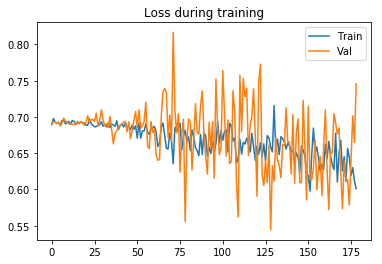

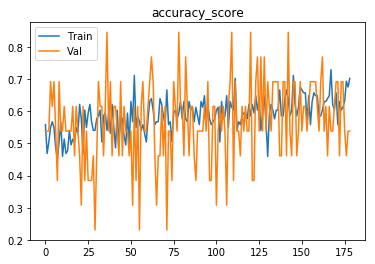

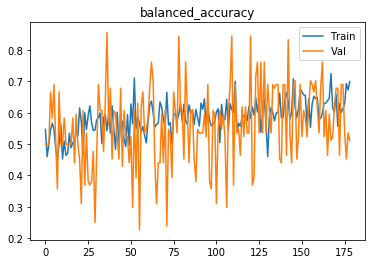

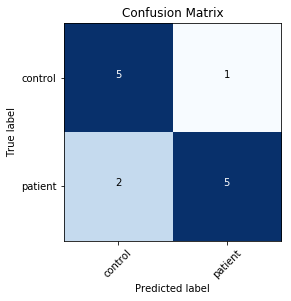

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.69156
[0,     4] loss: 0.69625
[0,     6] loss: 0.69362
[0,     8] loss: 0.69918
Time elapsed: 0h:0m:1s
train accuracy_score: 47.75 %
train balanced_accuracy: 48.05 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.692686
[1,     2] loss: 0.69341
[1,     4] loss: 0.69498
[1,     6] loss: 0.68744
[1,     8] loss: 0.69713
Time elapsed: 0h:0m:3s
train accuracy_score: 52.25 %
train balanced_accuracy: 52.14 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.692728
[2,     2] loss: 0.69649
[2,     4] loss: 0.69663
[2,     6] loss: 0.69222
[2,     8] loss: 0.68871
Time elapsed: 0h:0m:5s
train accuracy_score: 54.05 %
train balanced_accuracy: 53.85 %
val accuracy_score: 61.54 %
val balanced_accuracy: 58.33 %
Val loss: 0.691671
[3,     2] loss: 0.69239
[3,     4] loss: 0.69450
[3,     6] loss: 0.68993


Time elapsed: 0h:1m:11s
train accuracy_score: 62.16 %
train balanced_accuracy: 62.18 %
val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.689478
[31,     2] loss: 0.67774
[31,     4] loss: 0.68811
[31,     6] loss: 0.67428
[31,     8] loss: 0.70434
Time elapsed: 0h:1m:14s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.87 %
val accuracy_score: 15.38 %
val balanced_accuracy: 16.67 %
Val loss: 0.724962
[32,     2] loss: 0.67697
[32,     4] loss: 0.67091
[32,     6] loss: 0.67192
[32,     8] loss: 0.67137
Time elapsed: 0h:1m:16s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.55 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.686977
[33,     2] loss: 0.67560
[33,     4] loss: 0.69102
[33,     6] loss: 0.70794
[33,     8] loss: 0.66208
Time elapsed: 0h:1m:18s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.11 %
val accuracy_score: 53.85 %
val balanced_accuracy: 51.19 %
Val loss: 0.687940
[34,     2] loss: 0.67475
[3

[61,     2] loss: 0.67338
[61,     4] loss: 0.66601
[61,     6] loss: 0.65694
[61,     8] loss: 0.65538
Time elapsed: 0h:2m:22s
train accuracy_score: 62.16 %
train balanced_accuracy: 61.94 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.633586
[62,     2] loss: 0.67471
[62,     4] loss: 0.67197
[62,     6] loss: 0.66946
[62,     8] loss: 0.68154
Time elapsed: 0h:2m:24s
train accuracy_score: 54.05 %
train balanced_accuracy: 53.95 %
val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.684657
[63,     2] loss: 0.68240
[63,     4] loss: 0.60761
[63,     6] loss: 0.67577
[63,     8] loss: 0.64647
Time elapsed: 0h:2m:26s
train accuracy_score: 62.16 %
train balanced_accuracy: 62.13 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.762445
[64,     2] loss: 0.72076
[64,     4] loss: 0.77387
[64,     6] loss: 0.62488
[64,     8] loss: 0.72420
Time elapsed: 0h:2m:29s
train accuracy_score: 51.35 %
train balanced_accuracy: 51.75 %
va

val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.662766
[92,     2] loss: 0.67386
[92,     4] loss: 0.65662
[92,     6] loss: 0.57672
[92,     8] loss: 0.60114
Time elapsed: 0h:3m:32s
train accuracy_score: 67.57 %
train balanced_accuracy: 67.59 %
val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.719190
[93,     2] loss: 0.64943
[93,     4] loss: 0.63675
[93,     6] loss: 0.63806
[93,     8] loss: 0.70321
Time elapsed: 0h:3m:34s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.33 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.658095
[94,     2] loss: 0.68873
[94,     4] loss: 0.69821
[94,     6] loss: 0.66848
[94,     8] loss: 0.65658
Time elapsed: 0h:3m:36s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.53 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.723696
[95,     2] loss: 0.74190
[95,     4] loss: 0.66127
[95,     6] loss: 0.61920
[95,     8] loss: 0.64711
Time elapse

[122,     2] loss: 0.62445
[122,     4] loss: 0.73025
[122,     6] loss: 0.57254
[122,     8] loss: 0.57098
Time elapsed: 0h:4m:36s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.33 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.638857
[123,     2] loss: 0.64538
[123,     4] loss: 0.56584
[123,     6] loss: 0.66513
[123,     8] loss: 0.59559
Time elapsed: 0h:4m:38s
train accuracy_score: 61.26 %
train balanced_accuracy: 61.06 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.38 %
Val loss: 0.596935
[124,     2] loss: 0.63734
[124,     4] loss: 0.65080
[124,     6] loss: 0.68037
[124,     8] loss: 0.67471
Time elapsed: 0h:4m:40s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.09 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.685083
[125,     2] loss: 0.66334
[125,     4] loss: 0.60030
[125,     6] loss: 0.65057
[125,     8] loss: 0.59809
Time elapsed: 0h:4m:42s
train accuracy_score: 63.96 %
train balanced_accu

Time elapsed: 0h:5m:41s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.42 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.562376
[153,     2] loss: 0.67669
[153,     4] loss: 0.61049
[153,     6] loss: 0.42034
[153,     8] loss: 0.62025
Time elapsed: 0h:5m:43s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.57 %
val accuracy_score: 38.46 %
val balanced_accuracy: 38.10 %
Val loss: 0.652382
[154,     2] loss: 0.57834
[154,     4] loss: 0.64612
[154,     6] loss: 0.66779
[154,     8] loss: 0.66807
Time elapsed: 0h:5m:46s
train accuracy_score: 61.26 %
train balanced_accuracy: 61.01 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.559945
[155,     2] loss: 0.65036
[155,     4] loss: 0.53918
[155,     6] loss: 0.75446
[155,     8] loss: 0.64489
Time elapsed: 0h:5m:48s
train accuracy_score: 63.06 %
train balanced_accuracy: 62.62 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.590886
[156,     2] los

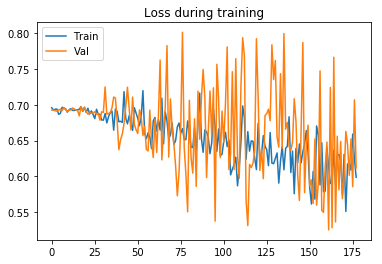

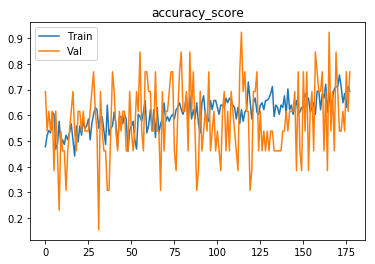

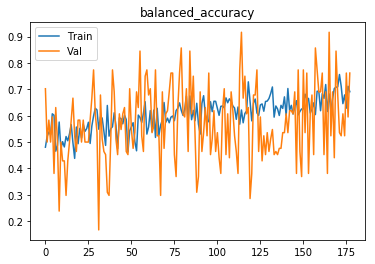

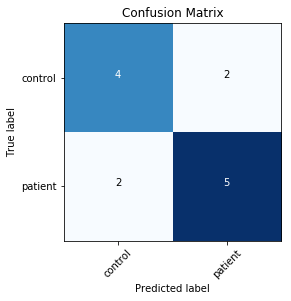

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.69962
[0,     4] loss: 0.70890
[0,     6] loss: 0.69841
[0,     8] loss: 0.68566
Time elapsed: 0h:0m:1s
train accuracy_score: 48.65 %
train balanced_accuracy: 49.95 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.693233
[1,     2] loss: 0.70408
[1,     4] loss: 0.69580
[1,     6] loss: 0.68749
[1,     8] loss: 0.69368
Time elapsed: 0h:0m:3s
train accuracy_score: 46.85 %
train balanced_accuracy: 47.95 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.697247
[2,     2] loss: 0.69167
[2,     4] loss: 0.69016
[2,     6] loss: 0.68687
[2,     8] loss: 0.70050
Time elapsed: 0h:0m:5s
train accuracy_score: 46.85 %
train balanced_accuracy: 47.32 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.691703
[3,     2] loss: 0.70277
[3,     4] loss: 0.69090
[3,     6] loss: 0.68818

Time elapsed: 0h:1m:6s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.50 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.703155
[31,     2] loss: 0.67681
[31,     4] loss: 0.66654
[31,     6] loss: 0.63127
[31,     8] loss: 0.71312
Time elapsed: 0h:1m:9s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.50 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.663182
[32,     2] loss: 0.65855
[32,     4] loss: 0.64575
[32,     6] loss: 0.66867
[32,     8] loss: 0.65917
Time elapsed: 0h:1m:11s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.42 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.661068
[33,     2] loss: 0.66347
[33,     4] loss: 0.65189
[33,     6] loss: 0.68130
[33,     8] loss: 0.60962
Time elapsed: 0h:1m:13s
train accuracy_score: 62.16 %
train balanced_accuracy: 61.70 %
val accuracy_score: 53.85 %
val balanced_accuracy: 51.19 %
Val loss: 0.694727
[34,     2] loss: 0.64262
[34,

[61,     2] loss: 0.59415
[61,     4] loss: 0.54647
[61,     6] loss: 0.71375
[61,     8] loss: 0.62122
Time elapsed: 0h:2m:19s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.69 %
val accuracy_score: 84.62 %
val balanced_accuracy: 83.33 %
Val loss: 0.545434
[62,     2] loss: 0.64428
[62,     4] loss: 0.66932
[62,     6] loss: 0.61986
[62,     8] loss: 0.63723
Time elapsed: 0h:2m:21s
train accuracy_score: 63.06 %
train balanced_accuracy: 62.62 %
val accuracy_score: 84.62 %
val balanced_accuracy: 83.33 %
Val loss: 0.513187
[63,     2] loss: 0.53694
[63,     4] loss: 0.75917
[63,     6] loss: 0.65594
[63,     8] loss: 0.61728
Time elapsed: 0h:2m:23s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.13 %
val accuracy_score: 53.85 %
val balanced_accuracy: 51.19 %
Val loss: 0.688747
[64,     2] loss: 0.60773
[64,     4] loss: 0.59188
[64,     6] loss: 0.67218
[64,     8] loss: 0.56705
Time elapsed: 0h:2m:26s
train accuracy_score: 67.57 %
train balanced_accuracy: 67.20 %
va

val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.667457
[92,     2] loss: 0.60392
[92,     4] loss: 0.51883
[92,     6] loss: 0.75891
[92,     8] loss: 0.71143
Time elapsed: 0h:3m:29s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.08 %
val accuracy_score: 84.62 %
val balanced_accuracy: 84.52 %
Val loss: 0.477384
[93,     2] loss: 0.64901
[93,     4] loss: 0.49191
[93,     6] loss: 0.62671
[93,     8] loss: 0.51104
Time elapsed: 0h:3m:31s
train accuracy_score: 71.17 %
train balanced_accuracy: 70.86 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.628271
[94,     2] loss: 0.69093
[94,     4] loss: 0.59993
[94,     6] loss: 0.49551
[94,     8] loss: 0.67205
Time elapsed: 0h:3m:34s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.53 %
val accuracy_score: 84.62 %
val balanced_accuracy: 85.71 %
Val loss: 0.566947
[95,     2] loss: 0.65806
[95,     4] loss: 0.58110
[95,     6] loss: 0.79296
[95,     8] loss: 0.58941
Time elapse

[122,     2] loss: 0.59156
[122,     4] loss: 0.62341
[122,     6] loss: 0.71735
[122,     8] loss: 0.60980
Time elapsed: 0h:4m:39s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.37 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.693712
[123,     2] loss: 0.61285
[123,     4] loss: 0.55810
[123,     6] loss: 0.48808
[123,     8] loss: 0.57493
Time elapsed: 0h:4m:42s
train accuracy_score: 72.07 %
train balanced_accuracy: 71.93 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.609116
[124,     2] loss: 0.52423
[124,     4] loss: 0.59551
[124,     6] loss: 0.58890
[124,     8] loss: 0.63133
Time elapsed: 0h:4m:44s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.59 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.473527
[125,     2] loss: 0.53905
[125,     4] loss: 0.60385
[125,     6] loss: 0.66861
[125,     8] loss: 0.54411
Time elapsed: 0h:4m:46s
train accuracy_score: 65.77 %
train balanced_accu

Time elapsed: 0h:5m:49s
train accuracy_score: 71.17 %
train balanced_accuracy: 71.20 %
val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.613500
[153,     2] loss: 0.54733
[153,     4] loss: 0.69945
[153,     6] loss: 0.57785
[153,     8] loss: 0.58421
Time elapsed: 0h:5m:51s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.40 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.534133
[154,     2] loss: 0.66224
[154,     4] loss: 0.55996
[154,     6] loss: 0.52111
[154,     8] loss: 0.69746
Time elapsed: 0h:5m:53s
train accuracy_score: 68.47 %
train balanced_accuracy: 68.27 %
val accuracy_score: 76.92 %
val balanced_accuracy: 75.00 %
Val loss: 0.553456
[155,     2] loss: 0.55975
[155,     4] loss: 0.55264
[155,     6] loss: 0.46226
[155,     8] loss: 0.54404
Time elapsed: 0h:5m:56s
train accuracy_score: 71.17 %
train balanced_accuracy: 70.81 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.575225
[156,     2] los

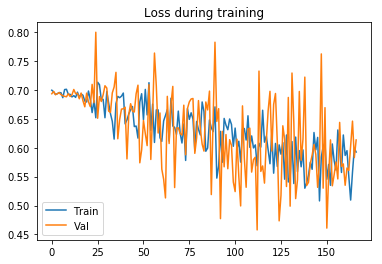

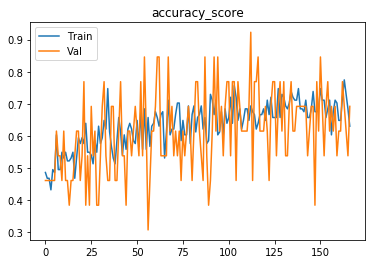

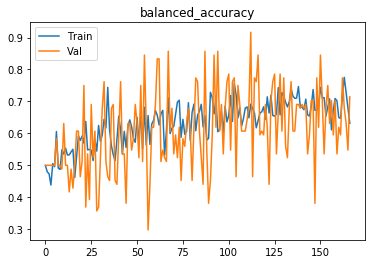

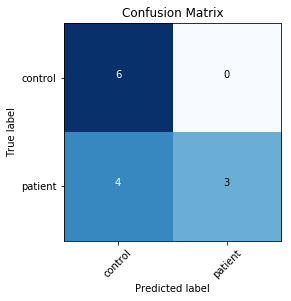

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.69881
[0,     4] loss: 0.70750
[0,     6] loss: 0.70125
[0,     8] loss: 0.68130
Time elapsed: 0h:0m:1s
train accuracy_score: 48.65 %
train balanced_accuracy: 50.00 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.694361
[1,     2] loss: 0.69087
[1,     4] loss: 0.70090
[1,     6] loss: 0.70148
[1,     8] loss: 0.69413
Time elapsed: 0h:0m:3s
train accuracy_score: 46.85 %
train balanced_accuracy: 47.90 %
val accuracy_score: 30.77 %
val balanced_accuracy: 33.33 %
Val loss: 0.697284
[2,     2] loss: 0.69202
[2,     4] loss: 0.69621
[2,     6] loss: 0.68543
[2,     8] loss: 0.69864
Time elapsed: 0h:0m:5s
train accuracy_score: 51.35 %
train balanced_accuracy: 51.95 %
val accuracy_score: 53.85 %
val balanced_accuracy: 57.14 %
Val loss: 0.692140
[3,     2] loss: 0.69412
[3,     4] loss: 0.68788
[3,     6] loss: 0.68595

Time elapsed: 0h:1m:11s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.58 %
val accuracy_score: 30.77 %
val balanced_accuracy: 28.57 %
Val loss: 0.796024
[31,     2] loss: 0.65288
[31,     4] loss: 0.68419
[31,     6] loss: 0.64157
[31,     8] loss: 0.70500
Time elapsed: 0h:1m:14s
train accuracy_score: 54.05 %
train balanced_accuracy: 53.85 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.718272
[32,     2] loss: 0.64958
[32,     4] loss: 0.67139
[32,     6] loss: 0.61674
[32,     8] loss: 0.70018
Time elapsed: 0h:1m:16s
train accuracy_score: 58.56 %
train balanced_accuracy: 59.16 %
val accuracy_score: 30.77 %
val balanced_accuracy: 30.95 %
Val loss: 0.790315
[33,     2] loss: 0.75854
[33,     4] loss: 0.63861
[33,     6] loss: 0.68410
[33,     8] loss: 0.67356
Time elapsed: 0h:1m:19s
train accuracy_score: 50.45 %
train balanced_accuracy: 50.78 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.735019
[34,     2] loss: 0.67033
[3

[61,     2] loss: 0.62558
[61,     4] loss: 0.65880
[61,     6] loss: 0.70088
[61,     8] loss: 0.62690
Time elapsed: 0h:2m:22s
train accuracy_score: 63.06 %
train balanced_accuracy: 62.48 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.710602
[62,     2] loss: 0.65211
[62,     4] loss: 0.65828
[62,     6] loss: 0.64820
[62,     8] loss: 0.70366
Time elapsed: 0h:2m:25s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.06 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.709085
[63,     2] loss: 0.62722
[63,     4] loss: 0.64881
[63,     6] loss: 0.68296
[63,     8] loss: 0.62846
Time elapsed: 0h:2m:27s
train accuracy_score: 67.57 %
train balanced_accuracy: 67.01 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.653101
[64,     2] loss: 0.71597
[64,     4] loss: 0.64506
[64,     6] loss: 0.62314
[64,     8] loss: 0.65391
Time elapsed: 0h:2m:29s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.79 %
va

val accuracy_score: 53.85 %
val balanced_accuracy: 54.76 %
Val loss: 0.748882
[92,     2] loss: 0.54198
[92,     4] loss: 0.56787
[92,     6] loss: 0.67289
[92,     8] loss: 0.59569
Time elapsed: 0h:3m:33s
train accuracy_score: 72.07 %
train balanced_accuracy: 72.42 %
val accuracy_score: 84.62 %
val balanced_accuracy: 83.33 %
Val loss: 0.582369
[93,     2] loss: 0.60193
[93,     4] loss: 0.60317
[93,     6] loss: 0.58963
[93,     8] loss: 0.63234
Time elapsed: 0h:3m:35s
train accuracy_score: 69.37 %
train balanced_accuracy: 69.25 %
val accuracy_score: 69.23 %
val balanced_accuracy: 66.67 %
Val loss: 0.721237
[94,     2] loss: 0.75230
[94,     4] loss: 0.57143
[94,     6] loss: 0.49014
[94,     8] loss: 0.61102
Time elapsed: 0h:3m:37s
train accuracy_score: 69.37 %
train balanced_accuracy: 68.96 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.656120
[95,     2] loss: 0.65266
[95,     4] loss: 0.63886
[95,     6] loss: 0.55063
[95,     8] loss: 0.63584
Time elapse

[122,     2] loss: 0.56071
[122,     4] loss: 0.57138
[122,     6] loss: 0.55131
[122,     8] loss: 0.53499
Time elapsed: 0h:4m:42s
train accuracy_score: 72.07 %
train balanced_accuracy: 72.32 %
val accuracy_score: 69.23 %
val balanced_accuracy: 66.67 %
Val loss: 0.633979
[123,     2] loss: 0.62996
[123,     4] loss: 0.62798
[123,     6] loss: 0.70025
[123,     8] loss: 0.61055
Time elapsed: 0h:4m:44s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.23 %
val accuracy_score: 69.23 %
val balanced_accuracy: 66.67 %
Val loss: 0.643366
[124,     2] loss: 0.60750
[124,     4] loss: 0.59148
[124,     6] loss: 0.49595
[124,     8] loss: 0.49657
Time elapsed: 0h:4m:46s
train accuracy_score: 72.97 %
train balanced_accuracy: 72.90 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.554851
[125,     2] loss: 0.47749
[125,     4] loss: 0.62980
[125,     6] loss: 0.50251
[125,     8] loss: 0.59758
Time elapsed: 0h:4m:48s
train accuracy_score: 68.47 %
train balanced_accu

Time elapsed: 0h:5m:49s
train accuracy_score: 67.57 %
train balanced_accuracy: 67.30 %
val accuracy_score: 76.92 %
val balanced_accuracy: 75.00 %
Val loss: 0.580465
[153,     2] loss: 0.56413
[153,     4] loss: 0.59897
[153,     6] loss: 0.63494
[153,     8] loss: 0.61381
Time elapsed: 0h:5m:51s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.64 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.496530
[154,     2] loss: 0.62916
[154,     4] loss: 0.45898
[154,     6] loss: 0.63906
[154,     8] loss: 0.49265
Time elapsed: 0h:5m:53s
train accuracy_score: 70.27 %
train balanced_accuracy: 70.03 %
val accuracy_score: 53.85 %
val balanced_accuracy: 54.76 %
Val loss: 0.713405
[155,     2] loss: 0.57347
[155,     4] loss: 0.70656
[155,     6] loss: 0.64588
[155,     8] loss: 0.49146
Time elapsed: 0h:5m:55s
train accuracy_score: 68.47 %
train balanced_accuracy: 68.52 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.613155
[156,     2] los

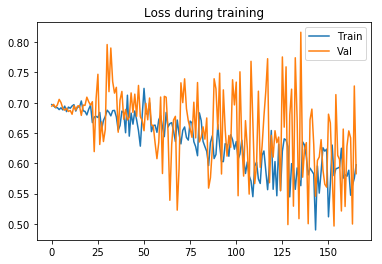

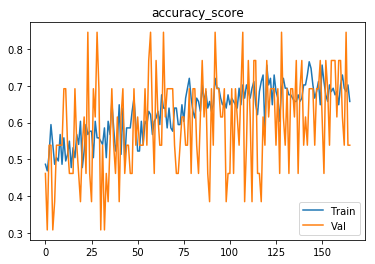

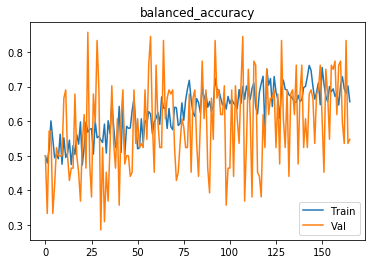

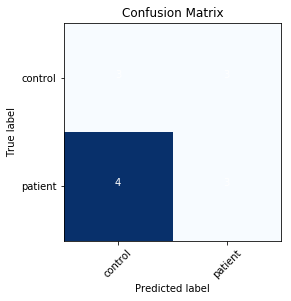

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.69329
[0,     4] loss: 0.70302
[0,     6] loss: 0.69742
Time elapsed: 0h:0m:1s
train accuracy_score: 48.65 %
train balanced_accuracy: 50.00 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.701084
[1,     2] loss: 0.68561
[1,     4] loss: 0.72336
[1,     6] loss: 0.70088
Time elapsed: 0h:0m:3s
train accuracy_score: 48.65 %
train balanced_accuracy: 50.00 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.700182
[2,     2] loss: 0.69979
[2,     4] loss: 0.68638
[2,     6] loss: 0.70484
Time elapsed: 0h:0m:5s
train accuracy_score: 48.65 %
train balanced_accuracy: 50.00 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.698086
[3,     2] loss: 0.69985
[3,     4] loss: 0.68843
[3,     6] loss: 0.70142
Time elapsed: 0h:0m:8s
train accuracy_score: 47.75 %
train balanced_accura

val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.687313
[34,     2] loss: 0.71470
[34,     4] loss: 0.73405
[34,     6] loss: 0.68442
Time elapsed: 0h:1m:16s
train accuracy_score: 48.65 %
train balanced_accuracy: 48.29 %
val accuracy_score: 61.54 %
val balanced_accuracy: 58.33 %
Val loss: 0.660041
[35,     2] loss: 0.67525
[35,     4] loss: 0.72682
[35,     6] loss: 0.69495
Time elapsed: 0h:1m:18s
train accuracy_score: 51.35 %
train balanced_accuracy: 50.88 %
val accuracy_score: 61.54 %
val balanced_accuracy: 58.33 %
Val loss: 0.702326
[36,     2] loss: 0.70421
[36,     4] loss: 0.67178
[36,     6] loss: 0.71782
Time elapsed: 0h:1m:20s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.14 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.662188
[37,     2] loss: 0.67339
[37,     4] loss: 0.69984
[37,     6] loss: 0.67508
Time elapsed: 0h:1m:22s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.58 %
val accuracy_score: 46.15 %


val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.674709
[68,     2] loss: 0.66196
[68,     4] loss: 0.69745
[68,     6] loss: 0.67124
Time elapsed: 0h:2m:29s
train accuracy_score: 52.25 %
train balanced_accuracy: 52.24 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.62 %
Val loss: 0.683786
[69,     2] loss: 0.63771
[69,     4] loss: 0.68842
[69,     6] loss: 0.70271
Time elapsed: 0h:2m:31s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.58 %
val accuracy_score: 23.08 %
val balanced_accuracy: 23.81 %
Val loss: 0.747471
[70,     2] loss: 0.70139
[70,     4] loss: 0.62464
[70,     6] loss: 0.68574
Time elapsed: 0h:2m:33s
train accuracy_score: 54.05 %
train balanced_accuracy: 54.24 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.659336
[71,     2] loss: 0.67285
[71,     4] loss: 0.67994
[71,     6] loss: 0.66904
Time elapsed: 0h:2m:35s
train accuracy_score: 62.16 %
train balanced_accuracy: 61.99 %
val accuracy_score: 61.54 %


val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.650971
[102,     2] loss: 0.66961
[102,     4] loss: 0.67367
[102,     6] loss: 0.63962
Time elapsed: 0h:3m:45s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.30 %
val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.673187
[103,     2] loss: 0.67613
[103,     4] loss: 0.67156
[103,     6] loss: 0.69469
Time elapsed: 0h:3m:48s
train accuracy_score: 54.05 %
train balanced_accuracy: 53.90 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.674128
[104,     2] loss: 0.67696
[104,     4] loss: 0.63678
[104,     6] loss: 0.72456
Time elapsed: 0h:3m:50s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.55 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.641141
[105,     2] loss: 0.65171
[105,     4] loss: 0.67486
[105,     6] loss: 0.72787
Time elapsed: 0h:3m:52s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.68 %
val accuracy_sco

Time elapsed: 0h:4m:57s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.60 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.662352
[136,     2] loss: 0.65568
[136,     4] loss: 0.69339
[136,     6] loss: 0.68146
Time elapsed: 0h:4m:59s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.04 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.619201
[137,     2] loss: 0.62045
[137,     4] loss: 0.69545
[137,     6] loss: 0.63462
Time elapsed: 0h:5m:1s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.55 %
val accuracy_score: 61.54 %
val balanced_accuracy: 58.33 %
Val loss: 0.691208
[138,     2] loss: 0.67844
[138,     4] loss: 0.64635
[138,     6] loss: 0.66520
Time elapsed: 0h:5m:3s
train accuracy_score: 62.16 %
train balanced_accuracy: 62.09 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.660382
[139,     2] loss: 0.67485
[139,     4] loss: 0.67747
[139,     6] loss: 0.66244
Time elapsed: 0h:5

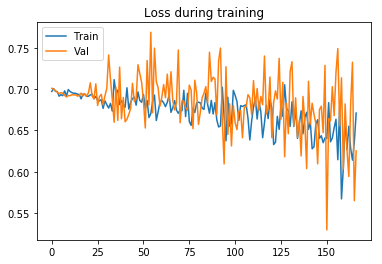

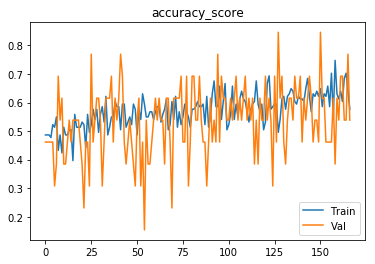

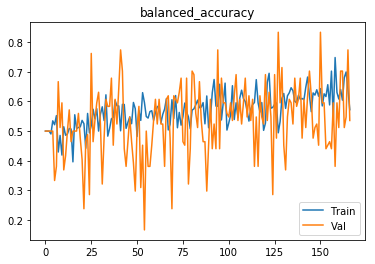

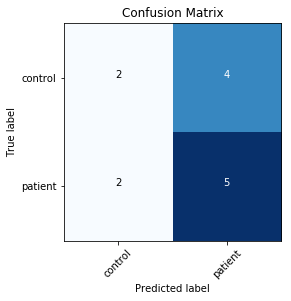

Finished outer fold.
{'final_acc': 0.761904761904762, 'best_acc': 0.9166666666666667, 'final_iter': 178, 'best_iter': 166, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 5e-05}, 'inner_fold_idx': 1}
###### Starting outer fold 1
111
13
Shuffled the data..
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.69650
[0,     4] loss: 0.68599
[0,     6] loss: 0.69290
Time elapsed: 0h:0m:1s
train accuracy_score: 52.25 %
train balanced_accuracy: 51.66 %
val accuracy_score: 61.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.687439
[1,     2] loss: 0.69250
[1,     4] loss: 0.68145
[1,     6] loss: 0.69605
Time elapsed: 0h:0m:3s
train accuracy_score: 54.05 %
train balanced_accuracy: 52.10 %
val accuracy_score: 61.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.686493
[2,     2] loss: 0.69198
[2,     4] loss: 0.68744
[2,     6] loss: 0.68452
Time elapsed: 0h:0m:5s
train accu

Time elapsed: 0h:1m:9s
train accuracy_score: 48.65 %
train balanced_accuracy: 47.70 %
val accuracy_score: 69.23 %
val balanced_accuracy: 60.00 %
Val loss: 0.684464
[33,     2] loss: 0.69355
[33,     4] loss: 0.71622
[33,     6] loss: 0.69101
Time elapsed: 0h:1m:11s
train accuracy_score: 50.45 %
train balanced_accuracy: 48.71 %
val accuracy_score: 69.23 %
val balanced_accuracy: 60.00 %
Val loss: 0.644754
[34,     2] loss: 0.66941
[34,     4] loss: 0.66311
[34,     6] loss: 0.69556
Time elapsed: 0h:1m:13s
train accuracy_score: 56.76 %
train balanced_accuracy: 54.64 %
val accuracy_score: 61.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.678526
[35,     2] loss: 0.69968
[35,     4] loss: 0.70352
[35,     6] loss: 0.65719
Time elapsed: 0h:1m:15s
train accuracy_score: 54.95 %
train balanced_accuracy: 53.06 %
val accuracy_score: 76.92 %
val balanced_accuracy: 73.75 %
Val loss: 0.648892
[36,     2] loss: 0.68253
[36,     4] loss: 0.69219
[36,     6] loss: 0.67959
Time elapsed: 0h:1m:17s
train

Time elapsed: 0h:2m:22s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.09 %
val accuracy_score: 76.92 %
val balanced_accuracy: 73.75 %
Val loss: 0.620703
[67,     2] loss: 0.71755
[67,     4] loss: 0.67381
[67,     6] loss: 0.68403
Time elapsed: 0h:2m:24s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.89 %
val accuracy_score: 61.54 %
val balanced_accuracy: 65.00 %
Val loss: 0.653002
[68,     2] loss: 0.70310
[68,     4] loss: 0.65471
[68,     6] loss: 0.61971
Time elapsed: 0h:2m:26s
train accuracy_score: 59.46 %
train balanced_accuracy: 58.44 %
val accuracy_score: 84.62 %
val balanced_accuracy: 80.00 %
Val loss: 0.577544
[69,     2] loss: 0.64197
[69,     4] loss: 0.64978
[69,     6] loss: 0.64974
Time elapsed: 0h:2m:28s
train accuracy_score: 64.86 %
train balanced_accuracy: 63.75 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.50 %
Val loss: 0.611415
[70,     2] loss: 0.64114
[70,     4] loss: 0.66437
[70,     6] loss: 0.72489
Time elapsed: 0h:2m:30s
trai

Time elapsed: 0h:3m:37s
train accuracy_score: 63.06 %
train balanced_accuracy: 62.29 %
val accuracy_score: 69.23 %
val balanced_accuracy: 60.00 %
Val loss: 0.579894
[101,     2] loss: 0.64906
[101,     4] loss: 0.62153
[101,     6] loss: 0.62340
Time elapsed: 0h:3m:39s
train accuracy_score: 65.77 %
train balanced_accuracy: 64.60 %
val accuracy_score: 84.62 %
val balanced_accuracy: 83.75 %
Val loss: 0.542735
[102,     2] loss: 0.58915
[102,     4] loss: 0.59721
[102,     6] loss: 0.74565
Time elapsed: 0h:3m:42s
train accuracy_score: 65.77 %
train balanced_accuracy: 64.60 %
val accuracy_score: 46.15 %
val balanced_accuracy: 37.50 %
Val loss: 0.627549
[103,     2] loss: 0.65415
[103,     4] loss: 0.64626
[103,     6] loss: 0.72799
Time elapsed: 0h:3m:44s
train accuracy_score: 57.66 %
train balanced_accuracy: 56.75 %
val accuracy_score: 76.92 %
val balanced_accuracy: 73.75 %
Val loss: 0.599162
[104,     2] loss: 0.67257
[104,     4] loss: 0.53348
[104,     6] loss: 0.67178
Time elapsed: 0h

val accuracy_score: 53.85 %
val balanced_accuracy: 43.75 %
Val loss: 0.607815
[134,     2] loss: 0.66667
[134,     4] loss: 0.63221
[134,     6] loss: 0.56883
Time elapsed: 0h:4m:54s
train accuracy_score: 69.37 %
train balanced_accuracy: 68.45 %
val accuracy_score: 92.31 %
val balanced_accuracy: 90.00 %
Val loss: 0.470525
[135,     2] loss: 0.64037
[135,     4] loss: 0.68646
[135,     6] loss: 0.65556
Time elapsed: 0h:4m:57s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.32 %
val accuracy_score: 53.85 %
val balanced_accuracy: 43.75 %
Val loss: 0.621706
[136,     2] loss: 0.65085
[136,     4] loss: 0.62723
[136,     6] loss: 0.56657
Time elapsed: 0h:4m:59s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.02 %
val accuracy_score: 76.92 %
val balanced_accuracy: 70.00 %
Val loss: 0.515457
[137,     2] loss: 0.63699
[137,     4] loss: 0.70486
[137,     6] loss: 0.56349
Time elapsed: 0h:5m:1s
train accuracy_score: 66.67 %
train balanced_accuracy: 65.68 %
val accuracy_scor

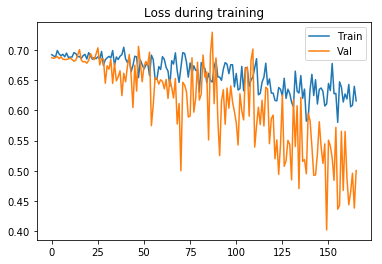

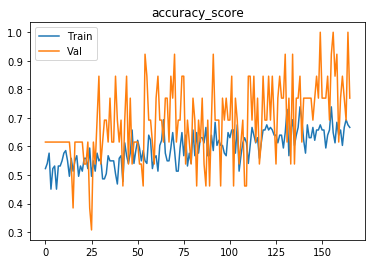

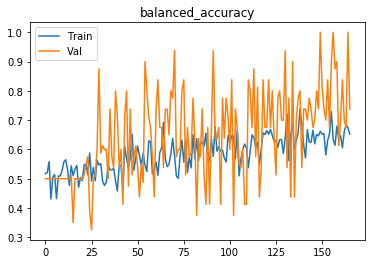

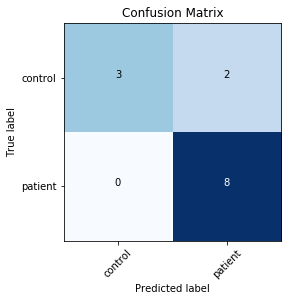

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.69696
[0,     4] loss: 0.68888
[0,     6] loss: 0.69430
Time elapsed: 0h:0m:1s
train accuracy_score: 48.65 %
train balanced_accuracy: 49.98 %
val accuracy_score: 46.15 %
val balanced_accuracy: 37.50 %
Val loss: 0.693416
[1,     2] loss: 0.70021
[1,     4] loss: 0.69459
[1,     6] loss: 0.68926
Time elapsed: 0h:0m:3s
train accuracy_score: 47.75 %
train balanced_accuracy: 46.97 %
val accuracy_score: 61.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.690191
[2,     2] loss: 0.68704
[2,     4] loss: 0.70576
[2,     6] loss: 0.69221
Time elapsed: 0h:0m:6s
train accuracy_score: 50.45 %
train balanced_accuracy: 49.40 %
val accuracy_score: 61.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.687784
[3,     2] loss: 0.68901
[3,     4] loss: 0.69566
[3,     6] loss: 0.69477
Time elapsed: 0h:0m:8s
train accuracy_score: 54.05 %
train balanced_accura

Time elapsed: 0h:1m:14s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.48 %
val accuracy_score: 69.23 %
val balanced_accuracy: 60.00 %
Val loss: 0.681132
[34,     2] loss: 0.69310
[34,     4] loss: 0.68607
[34,     6] loss: 0.61256
Time elapsed: 0h:1m:16s
train accuracy_score: 58.56 %
train balanced_accuracy: 57.14 %
val accuracy_score: 53.85 %
val balanced_accuracy: 51.25 %
Val loss: 0.697397
[35,     2] loss: 0.67991
[35,     4] loss: 0.57498
[35,     6] loss: 0.68719
Time elapsed: 0h:1m:19s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.01 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.00 %
Val loss: 0.689688
[36,     2] loss: 0.66378
[36,     4] loss: 0.58971
[36,     6] loss: 0.70353
Time elapsed: 0h:1m:21s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.05 %
val accuracy_score: 69.23 %
val balanced_accuracy: 63.75 %
Val loss: 0.642196
[37,     2] loss: 0.74190
[37,     4] loss: 0.60499
[37,     6] loss: 0.68257
Time elapsed: 0h:1m:23s
trai

Time elapsed: 0h:2m:31s
train accuracy_score: 61.26 %
train balanced_accuracy: 60.02 %
val accuracy_score: 76.92 %
val balanced_accuracy: 73.75 %
Val loss: 0.613748
[68,     2] loss: 0.58845
[68,     4] loss: 0.60420
[68,     6] loss: 0.65780
Time elapsed: 0h:2m:34s
train accuracy_score: 68.47 %
train balanced_accuracy: 68.29 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.50 %
Val loss: 0.538470
[69,     2] loss: 0.61501
[69,     4] loss: 0.66380
[69,     6] loss: 0.67479
Time elapsed: 0h:2m:36s
train accuracy_score: 67.57 %
train balanced_accuracy: 67.67 %
val accuracy_score: 76.92 %
val balanced_accuracy: 70.00 %
Val loss: 0.516073
[70,     2] loss: 0.67136
[70,     4] loss: 0.65158
[70,     6] loss: 0.69136
Time elapsed: 0h:2m:38s
train accuracy_score: 63.06 %
train balanced_accuracy: 62.06 %
val accuracy_score: 69.23 %
val balanced_accuracy: 60.00 %
Val loss: 0.667187
[71,     2] loss: 0.65904
[71,     4] loss: 0.56200
[71,     6] loss: 0.66631
Time elapsed: 0h:2m:40s
trai

Time elapsed: 0h:3m:49s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.02 %
val accuracy_score: 84.62 %
val balanced_accuracy: 83.75 %
Val loss: 0.426213
[102,     2] loss: 0.62101
[102,     4] loss: 0.61432
[102,     6] loss: 0.59649
Time elapsed: 0h:3m:51s
train accuracy_score: 67.57 %
train balanced_accuracy: 66.30 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.50 %
Val loss: 0.530328
[103,     2] loss: 0.60413
[103,     4] loss: 0.60163
[103,     6] loss: 0.66734
Time elapsed: 0h:3m:54s
train accuracy_score: 63.96 %
train balanced_accuracy: 64.16 %
val accuracy_score: 69.23 %
val balanced_accuracy: 71.25 %
Val loss: 0.667584
[104,     2] loss: 0.62235
[104,     4] loss: 0.52259
[104,     6] loss: 0.54048
Time elapsed: 0h:3m:56s
train accuracy_score: 73.87 %
train balanced_accuracy: 73.48 %
val accuracy_score: 69.23 %
val balanced_accuracy: 63.75 %
Val loss: 0.591294
[105,     2] loss: 0.57349
[105,     4] loss: 0.57943
[105,     6] loss: 0.62319
Time elapsed: 0h

val accuracy_score: 76.92 %
val balanced_accuracy: 73.75 %
Val loss: 0.507407
[135,     2] loss: 0.70027
[135,     4] loss: 0.66789
[135,     6] loss: 0.44585
Time elapsed: 0h:5m:7s
train accuracy_score: 64.86 %
train balanced_accuracy: 63.30 %
val accuracy_score: 92.31 %
val balanced_accuracy: 93.75 %
Val loss: 0.382076
[136,     2] loss: 0.58288
[136,     4] loss: 0.42327
[136,     6] loss: 0.62708
Time elapsed: 0h:5m:9s
train accuracy_score: 75.68 %
train balanced_accuracy: 75.86 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.50 %
Val loss: 0.532629
[137,     2] loss: 0.56228
[137,     4] loss: 0.64228
[137,     6] loss: 0.48177
Time elapsed: 0h:5m:11s
train accuracy_score: 72.97 %
train balanced_accuracy: 72.75 %
val accuracy_score: 61.54 %
val balanced_accuracy: 53.75 %
Val loss: 0.638465
[138,     2] loss: 0.50902
[138,     4] loss: 0.60586
[138,     6] loss: 0.60019
Time elapsed: 0h:5m:13s
train accuracy_score: 72.07 %
train balanced_accuracy: 71.10 %
val accuracy_score

[168,     2] loss: 0.55926
[168,     4] loss: 0.52394
[168,     6] loss: 0.54641
Time elapsed: 0h:6m:21s
train accuracy_score: 71.17 %
train balanced_accuracy: 71.06 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.50 %
Val loss: 0.508139
[169,     2] loss: 0.59497
[169,     4] loss: 0.55301
[169,     6] loss: 0.60922
Time elapsed: 0h:6m:23s
train accuracy_score: 69.37 %
train balanced_accuracy: 69.48 %
val accuracy_score: 84.62 %
val balanced_accuracy: 87.50 %
Val loss: 0.469256
[170,     2] loss: 0.58236
[170,     4] loss: 0.51226
[170,     6] loss: 0.53667
Time elapsed: 0h:6m:25s
train accuracy_score: 70.27 %
train balanced_accuracy: 69.64 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.50 %
Val loss: 0.437974
[171,     2] loss: 0.53194
[171,     4] loss: 0.62012
[171,     6] loss: 0.65882
Time elapsed: 0h:6m:27s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.25 %
val accuracy_score: 69.23 %
val balanced_accuracy: 63.75 %
Val loss: 0.503578
[172,     2] los

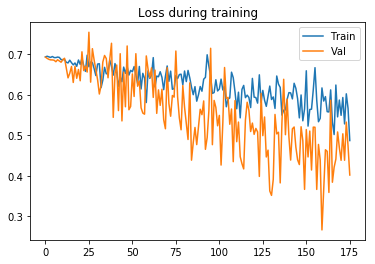

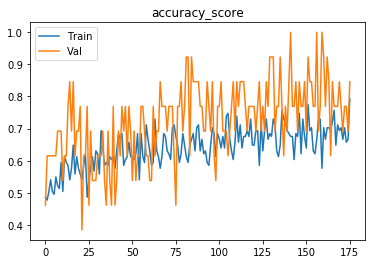

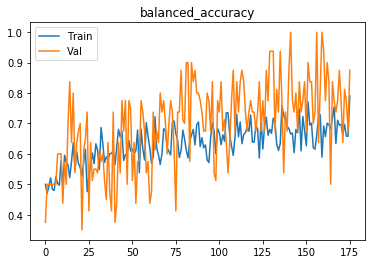

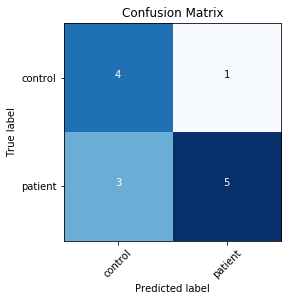

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.69726
[0,     4] loss: 0.68497
[0,     6] loss: 0.69361
Time elapsed: 0h:0m:1s
train accuracy_score: 52.25 %
train balanced_accuracy: 49.15 %
val accuracy_score: 61.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.684791
[1,     2] loss: 0.69370
[1,     4] loss: 0.68264
[1,     6] loss: 0.69672
Time elapsed: 0h:0m:3s
train accuracy_score: 54.95 %
train balanced_accuracy: 51.92 %
val accuracy_score: 61.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.686382
[2,     2] loss: 0.69296
[2,     4] loss: 0.69009
[2,     6] loss: 0.68567
Time elapsed: 0h:0m:6s
train accuracy_score: 53.15 %
train balanced_accuracy: 50.23 %
val accuracy_score: 61.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.687096
[3,     2] loss: 0.68736
[3,     4] loss: 0.69725
[3,     6] loss: 0.69324
Time elapsed: 0h:0m:8s
train accuracy_score: 54.05 %
train balanced_accurac

val accuracy_score: 76.92 %
val balanced_accuracy: 70.00 %
Val loss: 0.667086
[34,     2] loss: 0.68195
[34,     4] loss: 0.67877
[34,     6] loss: 0.67877
Time elapsed: 0h:1m:18s
train accuracy_score: 56.76 %
train balanced_accuracy: 54.76 %
val accuracy_score: 76.92 %
val balanced_accuracy: 70.00 %
Val loss: 0.663474
[35,     2] loss: 0.69004
[35,     4] loss: 0.66146
[35,     6] loss: 0.68740
Time elapsed: 0h:1m:20s
train accuracy_score: 54.05 %
train balanced_accuracy: 52.10 %
val accuracy_score: 61.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.684421
[36,     2] loss: 0.66264
[36,     4] loss: 0.66983
[36,     6] loss: 0.71411
Time elapsed: 0h:1m:22s
train accuracy_score: 60.36 %
train balanced_accuracy: 58.03 %
val accuracy_score: 76.92 %
val balanced_accuracy: 70.00 %
Val loss: 0.654223
[37,     2] loss: 0.70698
[37,     4] loss: 0.67921
[37,     6] loss: 0.68282
Time elapsed: 0h:1m:24s
train accuracy_score: 57.66 %
train balanced_accuracy: 56.40 %
val accuracy_score: 61.54 %


val accuracy_score: 61.54 %
val balanced_accuracy: 53.75 %
Val loss: 0.679197
[68,     2] loss: 0.69076
[68,     4] loss: 0.69011
[68,     6] loss: 0.61862
Time elapsed: 0h:2m:32s
train accuracy_score: 54.05 %
train balanced_accuracy: 52.90 %
val accuracy_score: 69.23 %
val balanced_accuracy: 63.75 %
Val loss: 0.645895
[69,     2] loss: 0.66936
[69,     4] loss: 0.62787
[69,     6] loss: 0.71636
Time elapsed: 0h:2m:34s
train accuracy_score: 57.66 %
train balanced_accuracy: 56.06 %
val accuracy_score: 46.15 %
val balanced_accuracy: 41.25 %
Val loss: 0.709342
[70,     2] loss: 0.66849
[70,     4] loss: 0.68190
[70,     6] loss: 0.69914
Time elapsed: 0h:2m:36s
train accuracy_score: 58.56 %
train balanced_accuracy: 57.25 %
val accuracy_score: 69.23 %
val balanced_accuracy: 63.75 %
Val loss: 0.638469
[71,     2] loss: 0.64630
[71,     4] loss: 0.66247
[71,     6] loss: 0.64939
Time elapsed: 0h:2m:39s
train accuracy_score: 62.16 %
train balanced_accuracy: 61.44 %
val accuracy_score: 61.54 %


val accuracy_score: 76.92 %
val balanced_accuracy: 70.00 %
Val loss: 0.613689
[102,     2] loss: 0.65843
[102,     4] loss: 0.66715
[102,     6] loss: 0.65160
Time elapsed: 0h:3m:49s
train accuracy_score: 54.95 %
train balanced_accuracy: 53.63 %
val accuracy_score: 69.23 %
val balanced_accuracy: 63.75 %
Val loss: 0.636517
[103,     2] loss: 0.72615
[103,     4] loss: 0.57609
[103,     6] loss: 0.63356
Time elapsed: 0h:3m:51s
train accuracy_score: 62.16 %
train balanced_accuracy: 60.98 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.50 %
Val loss: 0.593203
[104,     2] loss: 0.68193
[104,     4] loss: 0.65646
[104,     6] loss: 0.65865
Time elapsed: 0h:3m:54s
train accuracy_score: 63.96 %
train balanced_accuracy: 62.22 %
val accuracy_score: 76.92 %
val balanced_accuracy: 70.00 %
Val loss: 0.583682
[105,     2] loss: 0.60140
[105,     4] loss: 0.64748
[105,     6] loss: 0.66421
Time elapsed: 0h:3m:56s
train accuracy_score: 68.47 %
train balanced_accuracy: 67.60 %
val accuracy_sco

Time elapsed: 0h:5m:2s
train accuracy_score: 61.26 %
train balanced_accuracy: 61.16 %
val accuracy_score: 84.62 %
val balanced_accuracy: 80.00 %
Val loss: 0.576251
[136,     2] loss: 0.61586
[136,     4] loss: 0.60266
[136,     6] loss: 0.61190
Time elapsed: 0h:5m:4s
train accuracy_score: 68.47 %
train balanced_accuracy: 67.26 %
val accuracy_score: 61.54 %
val balanced_accuracy: 57.50 %
Val loss: 0.646557
[137,     2] loss: 0.69916
[137,     4] loss: 0.68693
[137,     6] loss: 0.66254
Time elapsed: 0h:5m:6s
train accuracy_score: 54.95 %
train balanced_accuracy: 53.75 %
val accuracy_score: 69.23 %
val balanced_accuracy: 63.75 %
Val loss: 0.630218
[138,     2] loss: 0.63648
[138,     4] loss: 0.65952
[138,     6] loss: 0.61364
Time elapsed: 0h:5m:9s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.06 %
val accuracy_score: 76.92 %
val balanced_accuracy: 73.75 %
Val loss: 0.564230
[139,     2] loss: 0.64301
[139,     4] loss: 0.69302
[139,     6] loss: 0.65978
Time elapsed: 0h:5m:

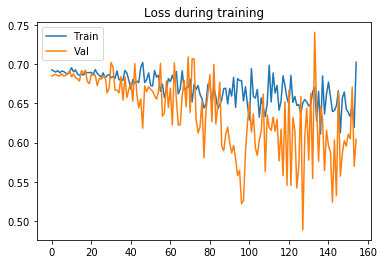

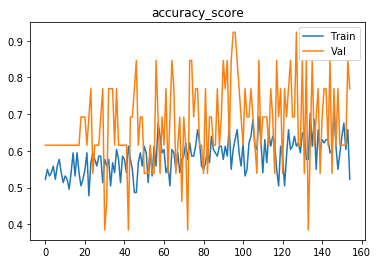

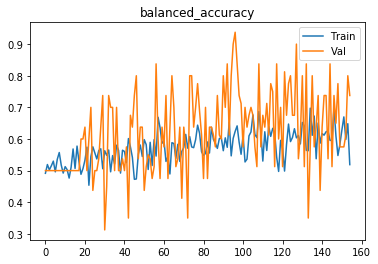

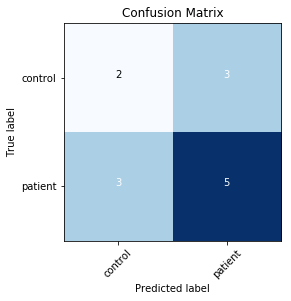

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.68920
Time elapsed: 0h:0m:1s
train accuracy_score: 53.15 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.680634
[1,     2] loss: 0.69218
Time elapsed: 0h:0m:3s
train accuracy_score: 53.15 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.681660
[2,     2] loss: 0.68859
Time elapsed: 0h:0m:5s
train accuracy_score: 53.15 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.682006
[3,     2] loss: 0.69031
Time elapsed: 0h:0m:8s
train accuracy_score: 53.15 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.683209
[4,     2] loss: 0.69440
Time elapsed: 0h:0m:10s
train accuracy_score: 53.15 %
train balanced_accuracy: 50.00 %

val accuracy_score: 61.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.680482
[43,     2] loss: 0.68813
Time elapsed: 0h:1m:37s
train accuracy_score: 53.15 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.678529
[44,     2] loss: 0.68792
Time elapsed: 0h:1m:40s
train accuracy_score: 53.15 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.678409
[45,     2] loss: 0.68524
Time elapsed: 0h:1m:42s
train accuracy_score: 53.15 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.677005
[46,     2] loss: 0.68891
Time elapsed: 0h:1m:44s
train accuracy_score: 52.25 %
train balanced_accuracy: 49.15 %
val accuracy_score: 61.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.675340
[47,     2] loss: 0.68933
Time elapsed: 0h:1m:46s
train accuracy_score: 53.15 %
train balanced_accuracy: 50.00 %
val accuracy_score: 61.54 %
val balanced_accu

val accuracy_score: 76.92 %
val balanced_accuracy: 77.50 %
Val loss: 0.600198
[86,     2] loss: 0.68963
Time elapsed: 0h:3m:16s
train accuracy_score: 53.15 %
train balanced_accuracy: 53.19 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.50 %
Val loss: 0.650404
[87,     2] loss: 0.65214
Time elapsed: 0h:3m:18s
train accuracy_score: 64.86 %
train balanced_accuracy: 65.01 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.00 %
Val loss: 0.660033
[88,     2] loss: 0.67430
Time elapsed: 0h:3m:21s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.09 %
val accuracy_score: 46.15 %
val balanced_accuracy: 48.75 %
Val loss: 0.692829
[89,     2] loss: 0.65538
Time elapsed: 0h:3m:23s
train accuracy_score: 63.06 %
train balanced_accuracy: 62.17 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.50 %
Val loss: 0.611498
[90,     2] loss: 0.65648
Time elapsed: 0h:3m:25s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.67 %
val accuracy_score: 69.23 %
val balanced_accu

val accuracy_score: 61.54 %
val balanced_accuracy: 57.50 %
Val loss: 0.618349
[129,     2] loss: 0.64352
Time elapsed: 0h:4m:53s
train accuracy_score: 62.16 %
train balanced_accuracy: 61.33 %
val accuracy_score: 76.92 %
val balanced_accuracy: 70.00 %
Val loss: 0.605003
[130,     2] loss: 0.67489
Time elapsed: 0h:4m:55s
train accuracy_score: 59.46 %
train balanced_accuracy: 58.44 %
val accuracy_score: 61.54 %
val balanced_accuracy: 53.75 %
Val loss: 0.685953
[131,     2] loss: 0.67576
Time elapsed: 0h:4m:57s
train accuracy_score: 63.06 %
train balanced_accuracy: 61.49 %
val accuracy_score: 61.54 %
val balanced_accuracy: 53.75 %
Val loss: 0.629934
[132,     2] loss: 0.64948
Time elapsed: 0h:4m:59s
train accuracy_score: 64.86 %
train balanced_accuracy: 63.98 %
val accuracy_score: 61.54 %
val balanced_accuracy: 57.50 %
Val loss: 0.608291
[133,     2] loss: 0.67336
Time elapsed: 0h:5m:2s
train accuracy_score: 60.36 %
train balanced_accuracy: 59.52 %
val accuracy_score: 84.62 %
val balanced_

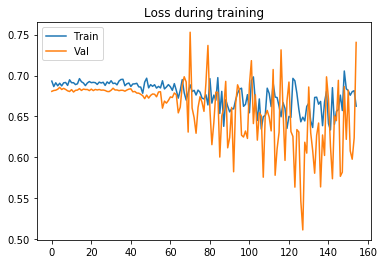

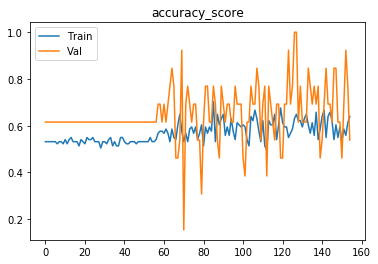

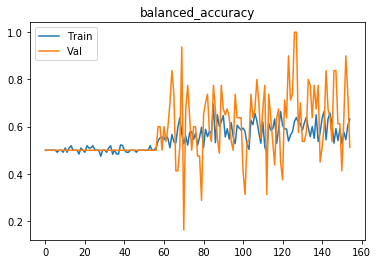

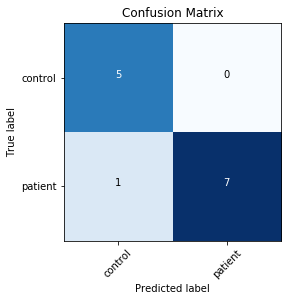

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.69515
Time elapsed: 0h:0m:1s
train accuracy_score: 48.65 %
train balanced_accuracy: 51.01 %
val accuracy_score: 38.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.697295
[1,     2] loss: 0.69556
Time elapsed: 0h:0m:3s
train accuracy_score: 49.55 %
train balanced_accuracy: 51.74 %
val accuracy_score: 38.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.694821
[2,     2] loss: 0.69503
Time elapsed: 0h:0m:5s
train accuracy_score: 49.55 %
train balanced_accuracy: 51.17 %
val accuracy_score: 38.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.696533
[3,     2] loss: 0.69462
Time elapsed: 0h:0m:8s
train accuracy_score: 50.45 %
train balanced_accuracy: 52.13 %
val accuracy_score: 38.46 %
val balanced_accuracy: 50.00 %
Val loss: 0.696039
[4,     2] loss: 0.69403
Time elapsed: 0h:0m:10s
train accuracy_score: 49.55 %
train balanced_accuracy: 51.17 %

val accuracy_score: 61.54 %
val balanced_accuracy: 53.75 %
Val loss: 0.676878
[43,     2] loss: 0.68057
Time elapsed: 0h:1m:38s
train accuracy_score: 60.36 %
train balanced_accuracy: 58.60 %
val accuracy_score: 69.23 %
val balanced_accuracy: 60.00 %
Val loss: 0.667391
[44,     2] loss: 0.68690
Time elapsed: 0h:1m:40s
train accuracy_score: 63.96 %
train balanced_accuracy: 62.79 %
val accuracy_score: 69.23 %
val balanced_accuracy: 63.75 %
Val loss: 0.680204
[45,     2] loss: 0.68994
Time elapsed: 0h:1m:42s
train accuracy_score: 59.46 %
train balanced_accuracy: 57.42 %
val accuracy_score: 61.54 %
val balanced_accuracy: 50.00 %
Val loss: 0.687414
[46,     2] loss: 0.67964
Time elapsed: 0h:1m:45s
train accuracy_score: 55.86 %
train balanced_accuracy: 53.80 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.50 %
Val loss: 0.673605
[47,     2] loss: 0.68209
Time elapsed: 0h:1m:47s
train accuracy_score: 61.26 %
train balanced_accuracy: 59.68 %
val accuracy_score: 84.62 %
val balanced_accu

val accuracy_score: 53.85 %
val balanced_accuracy: 51.25 %
Val loss: 0.700671
[86,     2] loss: 0.68254
Time elapsed: 0h:3m:16s
train accuracy_score: 54.95 %
train balanced_accuracy: 53.52 %
val accuracy_score: 61.54 %
val balanced_accuracy: 57.50 %
Val loss: 0.642985
[87,     2] loss: 0.68870
Time elapsed: 0h:3m:18s
train accuracy_score: 57.66 %
train balanced_accuracy: 55.95 %
val accuracy_score: 69.23 %
val balanced_accuracy: 63.75 %
Val loss: 0.665558
[88,     2] loss: 0.66886
Time elapsed: 0h:3m:20s
train accuracy_score: 54.05 %
train balanced_accuracy: 52.56 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.00 %
Val loss: 0.684433
[89,     2] loss: 0.63773
Time elapsed: 0h:3m:22s
train accuracy_score: 70.27 %
train balanced_accuracy: 69.52 %
val accuracy_score: 69.23 %
val balanced_accuracy: 71.25 %
Val loss: 0.622439
[90,     2] loss: 0.68734
Time elapsed: 0h:3m:25s
train accuracy_score: 52.25 %
train balanced_accuracy: 52.23 %
val accuracy_score: 84.62 %
val balanced_accu

val accuracy_score: 46.15 %
val balanced_accuracy: 41.25 %
Val loss: 0.654602
[129,     2] loss: 0.67230
Time elapsed: 0h:4m:54s
train accuracy_score: 60.36 %
train balanced_accuracy: 59.52 %
val accuracy_score: 38.46 %
val balanced_accuracy: 38.75 %
Val loss: 0.692038
[130,     2] loss: 0.66169
Time elapsed: 0h:4m:56s
train accuracy_score: 62.16 %
train balanced_accuracy: 61.33 %
val accuracy_score: 53.85 %
val balanced_accuracy: 47.50 %
Val loss: 0.693101
[131,     2] loss: 0.67762
Time elapsed: 0h:4m:59s
train accuracy_score: 51.35 %
train balanced_accuracy: 50.93 %
val accuracy_score: 53.85 %
val balanced_accuracy: 51.25 %
Val loss: 0.680885
[132,     2] loss: 0.67539
Time elapsed: 0h:5m:1s
train accuracy_score: 52.25 %
train balanced_accuracy: 51.89 %
val accuracy_score: 76.92 %
val balanced_accuracy: 73.75 %
Val loss: 0.609605
[133,     2] loss: 0.64568
Time elapsed: 0h:5m:3s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.17 %
val accuracy_score: 61.54 %
val balanced_a

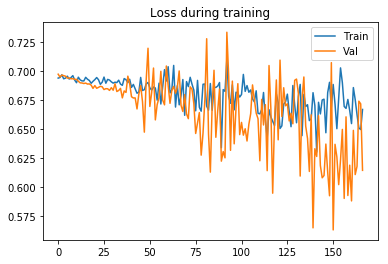

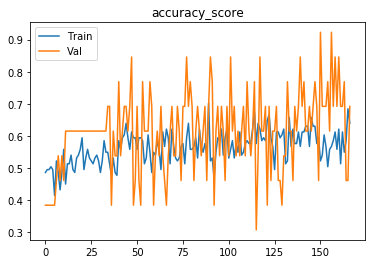

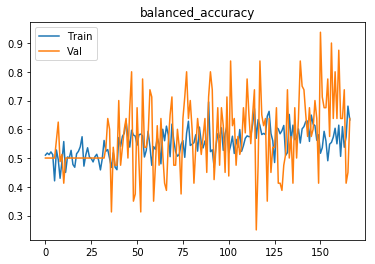

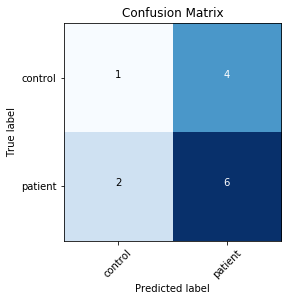

Finished outer fold.
{'final_acc': 0.875, 'best_acc': 1.0, 'final_iter': 176, 'best_iter': 160, 'params': {'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}, 'inner_fold_idx': 1}
###### Starting outer fold 2
111
13
Shuffled the data..
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.68333
[0,     4] loss: 0.70556
[0,     6] loss: 0.68700
[0,     8] loss: 0.69896
Time elapsed: 0h:0m:1s
train accuracy_score: 49.55 %
train balanced_accuracy: 49.98 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.696374
[1,     2] loss: 0.69003
[1,     4] loss: 0.70779
[1,     6] loss: 0.69894
[1,     8] loss: 0.69788
Time elapsed: 0h:0m:3s
train accuracy_score: 45.05 %
train balanced_accuracy: 45.29 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.694104
[2,     2] loss: 0.68544
[2,     4] loss: 0.69280
[2,     6] loss: 0.69412
[2,     8

Time elapsed: 0h:1m:3s
train accuracy_score: 63.06 %
train balanced_accuracy: 63.17 %
val accuracy_score: 38.46 %
val balanced_accuracy: 40.48 %
Val loss: 0.755479
[30,     2] loss: 0.71586
[30,     4] loss: 0.71027
[30,     6] loss: 0.71700
[30,     8] loss: 0.70341
Time elapsed: 0h:1m:6s
train accuracy_score: 49.55 %
train balanced_accuracy: 49.84 %
val accuracy_score: 46.15 %
val balanced_accuracy: 48.81 %
Val loss: 0.667528
[31,     2] loss: 0.71142
[31,     4] loss: 0.66735
[31,     6] loss: 0.68744
[31,     8] loss: 0.70428
Time elapsed: 0h:1m:9s
train accuracy_score: 48.65 %
train balanced_accuracy: 48.88 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.659533
[32,     2] loss: 0.70159
[32,     4] loss: 0.66349
[32,     6] loss: 0.68097
[32,     8] loss: 0.69632
Time elapsed: 0h:1m:11s
train accuracy_score: 52.25 %
train balanced_accuracy: 52.29 %
val accuracy_score: 84.62 %
val balanced_accuracy: 85.71 %
Val loss: 0.637626
[33,     2] loss: 0.66714
[33, 

[60,     2] loss: 0.68899
[60,     4] loss: 0.70540
[60,     6] loss: 0.70083
[60,     8] loss: 0.66565
Time elapsed: 0h:2m:12s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.57 %
val accuracy_score: 84.62 %
val balanced_accuracy: 85.71 %
Val loss: 0.571896
[61,     2] loss: 0.68912
[61,     4] loss: 0.64860
[61,     6] loss: 0.64843
[61,     8] loss: 0.74685
Time elapsed: 0h:2m:15s
train accuracy_score: 56.76 %
train balanced_accuracy: 56.70 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.656424
[62,     2] loss: 0.69924
[62,     4] loss: 0.65361
[62,     6] loss: 0.62845
[62,     8] loss: 0.70150
Time elapsed: 0h:2m:17s
train accuracy_score: 54.05 %
train balanced_accuracy: 54.09 %
val accuracy_score: 69.23 %
val balanced_accuracy: 71.43 %
Val loss: 0.602382
[63,     2] loss: 0.68062
[63,     4] loss: 0.65535
[63,     6] loss: 0.70840
[63,     8] loss: 0.69592
Time elapsed: 0h:2m:19s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.89 %
va

val accuracy_score: 69.23 %
val balanced_accuracy: 66.67 %
Val loss: 0.624241
[91,     2] loss: 0.61382
[91,     4] loss: 0.59199
[91,     6] loss: 0.65616
[91,     8] loss: 0.74558
Time elapsed: 0h:3m:22s
train accuracy_score: 63.06 %
train balanced_accuracy: 62.95 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.62 %
Val loss: 0.683424
[92,     2] loss: 0.67927
[92,     4] loss: 0.64176
[92,     6] loss: 0.67383
[92,     8] loss: 0.71172
Time elapsed: 0h:3m:24s
train accuracy_score: 56.76 %
train balanced_accuracy: 56.93 %
val accuracy_score: 46.15 %
val balanced_accuracy: 48.81 %
Val loss: 0.671509
[93,     2] loss: 0.66130
[93,     4] loss: 0.59109
[93,     6] loss: 0.56746
[93,     8] loss: 0.65637
Time elapsed: 0h:3m:26s
train accuracy_score: 67.57 %
train balanced_accuracy: 67.69 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.38 %
Val loss: 0.664750
[94,     2] loss: 0.64300
[94,     4] loss: 0.65968
[94,     6] loss: 0.57511
[94,     8] loss: 0.70705
Time elapse

[121,     2] loss: 0.73283
[121,     4] loss: 0.64781
[121,     6] loss: 0.64025
[121,     8] loss: 0.67393
Time elapsed: 0h:4m:27s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.59 %
val accuracy_score: 92.31 %
val balanced_accuracy: 92.86 %
Val loss: 0.533192
[122,     2] loss: 0.64549
[122,     4] loss: 0.59010
[122,     6] loss: 0.70385
[122,     8] loss: 0.64025
Time elapsed: 0h:4m:30s
train accuracy_score: 62.16 %
train balanced_accuracy: 62.05 %
val accuracy_score: 84.62 %
val balanced_accuracy: 84.52 %
Val loss: 0.556789
[123,     2] loss: 0.60670
[123,     4] loss: 0.70120
[123,     6] loss: 0.71117
[123,     8] loss: 0.71153
Time elapsed: 0h:4m:32s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.63 %
val accuracy_score: 76.92 %
val balanced_accuracy: 78.57 %
Val loss: 0.604782
[124,     2] loss: 0.66572
[124,     4] loss: 0.58705
[124,     6] loss: 0.61346
[124,     8] loss: 0.68654
Time elapsed: 0h:4m:34s
train accuracy_score: 64.86 %
train balanced_accu

Time elapsed: 0h:5m:33s
train accuracy_score: 61.26 %
train balanced_accuracy: 61.40 %
val accuracy_score: 84.62 %
val balanced_accuracy: 85.71 %
Val loss: 0.560839
[152,     2] loss: 0.65394
[152,     4] loss: 0.58600
[152,     6] loss: 0.67387
[152,     8] loss: 0.58989
Time elapsed: 0h:5m:35s
train accuracy_score: 62.16 %
train balanced_accuracy: 62.03 %
val accuracy_score: 84.62 %
val balanced_accuracy: 83.33 %
Val loss: 0.528742
[153,     2] loss: 0.70020
[153,     4] loss: 0.66454
[153,     6] loss: 0.56310
[153,     8] loss: 0.68570
Time elapsed: 0h:5m:37s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.90 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.597459
[154,     2] loss: 0.73608
[154,     4] loss: 0.58676
[154,     6] loss: 0.66905
[154,     8] loss: 0.56359
Time elapsed: 0h:5m:39s
train accuracy_score: 62.16 %
train balanced_accuracy: 62.11 %
val accuracy_score: 84.62 %
val balanced_accuracy: 84.52 %
Val loss: 0.529107
[155,     2] los

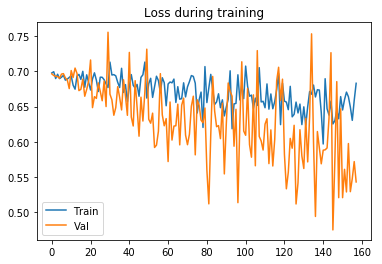

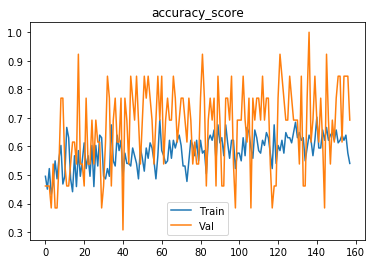

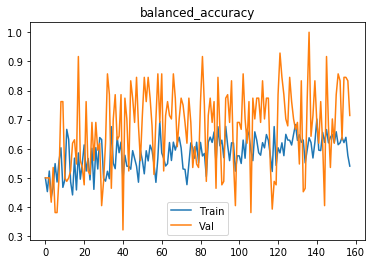

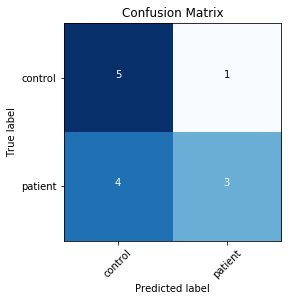

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.70580
[0,     4] loss: 0.68666
[0,     6] loss: 0.69849
Time elapsed: 0h:0m:1s
train accuracy_score: 48.65 %
train balanced_accuracy: 49.09 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.698186
[1,     2] loss: 0.70681
[1,     4] loss: 0.68742
[1,     6] loss: 0.67984
Time elapsed: 0h:0m:3s
train accuracy_score: 49.55 %
train balanced_accuracy: 49.98 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.698912
[2,     2] loss: 0.69275
[2,     4] loss: 0.69203
[2,     6] loss: 0.70114
Time elapsed: 0h:0m:5s
train accuracy_score: 48.65 %
train balanced_accuracy: 49.06 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.697219
[3,     2] loss: 0.69217
[3,     4] loss: 0.70433
[3,     6] loss: 0.69570
Time elapsed: 0h:0m:7s
train accuracy_score: 48.65 %
train balanced_accurac

val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.691568
[34,     2] loss: 0.69621
[34,     4] loss: 0.69431
[34,     6] loss: 0.70121
Time elapsed: 0h:1m:16s
train accuracy_score: 47.75 %
train balanced_accuracy: 47.95 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.694266
[35,     2] loss: 0.68563
[35,     4] loss: 0.69639
[35,     6] loss: 0.69533
Time elapsed: 0h:1m:18s
train accuracy_score: 54.95 %
train balanced_accuracy: 55.02 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.691481
[36,     2] loss: 0.68898
[36,     4] loss: 0.68971
[36,     6] loss: 0.68259
Time elapsed: 0h:1m:20s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.73 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.690453
[37,     2] loss: 0.69132
[37,     4] loss: 0.69625
[37,     6] loss: 0.69603
Time elapsed: 0h:1m:22s
train accuracy_score: 52.25 %
train balanced_accuracy: 52.47 %
val accuracy_score: 46.15 %


val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.692330
[68,     2] loss: 0.70006
[68,     4] loss: 0.68543
[68,     6] loss: 0.70253
Time elapsed: 0h:2m:30s
train accuracy_score: 53.15 %
train balanced_accuracy: 53.04 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.669657
[69,     2] loss: 0.70734
[69,     4] loss: 0.68088
[69,     6] loss: 0.68133
Time elapsed: 0h:2m:32s
train accuracy_score: 49.55 %
train balanced_accuracy: 49.35 %
val accuracy_score: 84.62 %
val balanced_accuracy: 83.33 %
Val loss: 0.654408
[70,     2] loss: 0.68150
[70,     4] loss: 0.68969
[70,     6] loss: 0.69198
Time elapsed: 0h:2m:34s
train accuracy_score: 56.76 %
train balanced_accuracy: 56.59 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.669002
[71,     2] loss: 0.68593
[71,     4] loss: 0.66897
[71,     6] loss: 0.69192
Time elapsed: 0h:2m:37s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.69 %
val accuracy_score: 46.15 %


val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.693673
[102,     2] loss: 0.65326
[102,     4] loss: 0.65301
[102,     6] loss: 0.67920
Time elapsed: 0h:3m:45s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.51 %
val accuracy_score: 76.92 %
val balanced_accuracy: 78.57 %
Val loss: 0.588516
[103,     2] loss: 0.70199
[103,     4] loss: 0.70131
[103,     6] loss: 0.68334
Time elapsed: 0h:3m:47s
train accuracy_score: 49.55 %
train balanced_accuracy: 49.63 %
val accuracy_score: 69.23 %
val balanced_accuracy: 71.43 %
Val loss: 0.570360
[104,     2] loss: 0.65372
[104,     4] loss: 0.65805
[104,     6] loss: 0.68908
Time elapsed: 0h:3m:49s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.31 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.631325
[105,     2] loss: 0.66745
[105,     4] loss: 0.68101
[105,     6] loss: 0.62293
Time elapsed: 0h:3m:51s
train accuracy_score: 63.06 %
train balanced_accuracy: 62.92 %
val accuracy_sco

[135,     2] loss: 0.66943
[135,     4] loss: 0.65583
[135,     6] loss: 0.60118
Time elapsed: 0h:4m:58s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.76 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.631317
[136,     2] loss: 0.67426
[136,     4] loss: 0.67123
[136,     6] loss: 0.64664
Time elapsed: 0h:5m:1s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.84 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.596963
[137,     2] loss: 0.70389
[137,     4] loss: 0.68367
[137,     6] loss: 0.62958
Time elapsed: 0h:5m:3s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.88 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.683603
[138,     2] loss: 0.69886
[138,     4] loss: 0.69417
[138,     6] loss: 0.58374
Time elapsed: 0h:5m:5s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.94 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.616068
[139,     2] loss: 

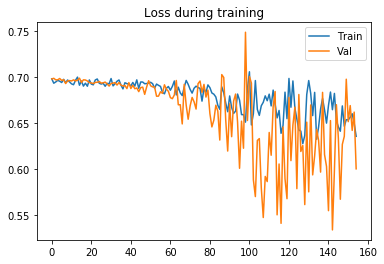

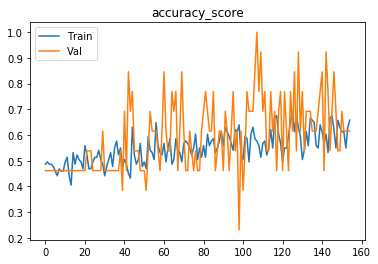

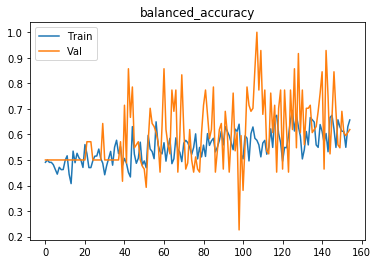

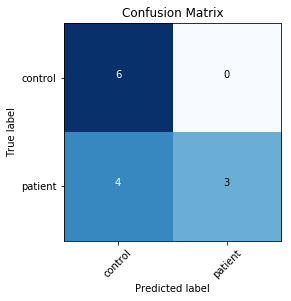

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.69814
[0,     4] loss: 0.69219
[0,     6] loss: 0.69541
Time elapsed: 0h:0m:1s
train accuracy_score: 46.85 %
train balanced_accuracy: 46.69 %
val accuracy_score: 30.77 %
val balanced_accuracy: 32.14 %
Val loss: 0.694697
[1,     2] loss: 0.69409
[1,     4] loss: 0.69121
[1,     6] loss: 0.69415
Time elapsed: 0h:0m:3s
train accuracy_score: 48.65 %
train balanced_accuracy: 48.62 %
val accuracy_score: 61.54 %
val balanced_accuracy: 58.33 %
Val loss: 0.692726
[2,     2] loss: 0.69082
[2,     4] loss: 0.68870
[2,     6] loss: 0.69923
Time elapsed: 0h:0m:5s
train accuracy_score: 52.25 %
train balanced_accuracy: 52.11 %
val accuracy_score: 61.54 %
val balanced_accuracy: 58.33 %
Val loss: 0.692415
[3,     2] loss: 0.69367
[3,     4] loss: 0.69944
[3,     6] loss: 0.69675
Time elapsed: 0h:0m:8s
train accuracy_score: 44.14 %
train balanced_accura

Time elapsed: 0h:1m:14s
train accuracy_score: 56.76 %
train balanced_accuracy: 56.57 %
val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.708594
[34,     2] loss: 0.66403
[34,     4] loss: 0.68465
[34,     6] loss: 0.68736
Time elapsed: 0h:1m:16s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.48 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.675840
[35,     2] loss: 0.67146
[35,     4] loss: 0.67199
[35,     6] loss: 0.65612
Time elapsed: 0h:1m:19s
train accuracy_score: 63.06 %
train balanced_accuracy: 63.12 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.666345
[36,     2] loss: 0.70942
[36,     4] loss: 0.72697
[36,     6] loss: 0.68272
Time elapsed: 0h:1m:21s
train accuracy_score: 45.95 %
train balanced_accuracy: 46.01 %
val accuracy_score: 53.85 %
val balanced_accuracy: 54.76 %
Val loss: 0.660681
[37,     2] loss: 0.67636
[37,     4] loss: 0.65318
[37,     6] loss: 0.71300
Time elapsed: 0h:1m:23s
trai

Time elapsed: 0h:2m:29s
train accuracy_score: 63.06 %
train balanced_accuracy: 63.08 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.551075
[68,     2] loss: 0.73851
[68,     4] loss: 0.65462
[68,     6] loss: 0.63885
Time elapsed: 0h:2m:31s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.32 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.639322
[69,     2] loss: 0.66971
[69,     4] loss: 0.61662
[69,     6] loss: 0.62644
Time elapsed: 0h:2m:34s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.66 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.38 %
Val loss: 0.517378
[70,     2] loss: 0.69570
[70,     4] loss: 0.68085
[70,     6] loss: 0.58917
Time elapsed: 0h:2m:36s
train accuracy_score: 56.76 %
train balanced_accuracy: 56.66 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.664386
[71,     2] loss: 0.63629
[71,     4] loss: 0.58418
[71,     6] loss: 0.67329
Time elapsed: 0h:2m:38s
trai

Time elapsed: 0h:3m:46s
train accuracy_score: 69.37 %
train balanced_accuracy: 69.43 %
val accuracy_score: 76.92 %
val balanced_accuracy: 78.57 %
Val loss: 0.511788
[102,     2] loss: 0.59363
[102,     4] loss: 0.69401
[102,     6] loss: 0.64402
Time elapsed: 0h:3m:48s
train accuracy_score: 63.06 %
train balanced_accuracy: 63.00 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.558195
[103,     2] loss: 0.60832
[103,     4] loss: 0.64074
[103,     6] loss: 0.65372
Time elapsed: 0h:3m:50s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.43 %
val accuracy_score: 84.62 %
val balanced_accuracy: 84.52 %
Val loss: 0.475754
[104,     2] loss: 0.65265
[104,     4] loss: 0.65239
[104,     6] loss: 0.60243
Time elapsed: 0h:3m:52s
train accuracy_score: 61.26 %
train balanced_accuracy: 61.20 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.544992
[105,     2] loss: 0.66612
[105,     4] loss: 0.62506
[105,     6] loss: 0.58085
Time elapsed: 0h

val accuracy_score: 92.31 %
val balanced_accuracy: 92.86 %
Val loss: 0.507689
[135,     2] loss: 0.57965
[135,     4] loss: 0.65405
[135,     6] loss: 0.62563
Time elapsed: 0h:4m:59s
train accuracy_score: 67.57 %
train balanced_accuracy: 67.61 %
val accuracy_score: 69.23 %
val balanced_accuracy: 71.43 %
Val loss: 0.566949
[136,     2] loss: 0.61637
[136,     4] loss: 0.62579
[136,     6] loss: 0.62385
Time elapsed: 0h:5m:2s
train accuracy_score: 63.96 %
train balanced_accuracy: 64.03 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.559183
[137,     2] loss: 0.65530
[137,     4] loss: 0.60496
[137,     6] loss: 0.53669
Time elapsed: 0h:5m:4s
train accuracy_score: 69.37 %
train balanced_accuracy: 69.25 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.38 %
Val loss: 0.519831
[138,     2] loss: 0.61610
[138,     4] loss: 0.52340
[138,     6] loss: 0.64957
Time elapsed: 0h:5m:6s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.94 %
val accuracy_score:

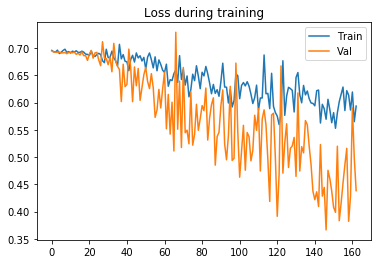

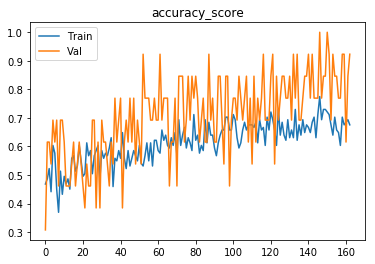

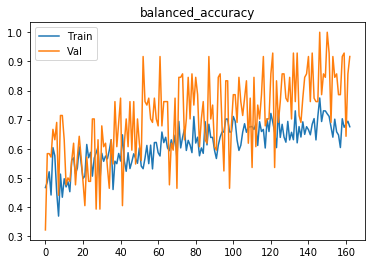

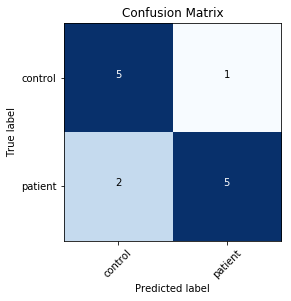

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.69860
[0,     4] loss: 0.69615
[0,     6] loss: 0.69512
Time elapsed: 0h:0m:1s
train accuracy_score: 43.24 %
train balanced_accuracy: 43.05 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.695684
[1,     2] loss: 0.69170
[1,     4] loss: 0.69199
[1,     6] loss: 0.69209
Time elapsed: 0h:0m:3s
train accuracy_score: 49.55 %
train balanced_accuracy: 49.37 %
val accuracy_score: 61.54 %
val balanced_accuracy: 64.29 %
Val loss: 0.692209
[2,     2] loss: 0.69409
[2,     4] loss: 0.69677
[2,     6] loss: 0.68818
Time elapsed: 0h:0m:5s
train accuracy_score: 52.25 %
train balanced_accuracy: 52.34 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.692444
[3,     2] loss: 0.69046
[3,     4] loss: 0.68933
[3,     6] loss: 0.69997
Time elapsed: 0h:0m:8s
train accuracy_score: 51.35 %
train balanced_accura

Time elapsed: 0h:1m:14s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.84 %
val accuracy_score: 69.23 %
val balanced_accuracy: 66.67 %
Val loss: 0.670800
[34,     2] loss: 0.70362
[34,     4] loss: 0.71787
[34,     6] loss: 0.65595
Time elapsed: 0h:1m:16s
train accuracy_score: 56.76 %
train balanced_accuracy: 56.54 %
val accuracy_score: 61.54 %
val balanced_accuracy: 58.33 %
Val loss: 0.652835
[35,     2] loss: 0.66369
[35,     4] loss: 0.69709
[35,     6] loss: 0.70272
Time elapsed: 0h:1m:18s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.81 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.658504
[36,     2] loss: 0.65534
[36,     4] loss: 0.71108
[36,     6] loss: 0.68528
Time elapsed: 0h:1m:21s
train accuracy_score: 54.05 %
train balanced_accuracy: 54.03 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.665428
[37,     2] loss: 0.69426
[37,     4] loss: 0.65630
[37,     6] loss: 0.72350
Time elapsed: 0h:1m:23s
trai

Time elapsed: 0h:2m:29s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.74 %
val accuracy_score: 76.92 %
val balanced_accuracy: 75.00 %
Val loss: 0.609785
[68,     2] loss: 0.66682
[68,     4] loss: 0.61137
[68,     6] loss: 0.68718
Time elapsed: 0h:2m:31s
train accuracy_score: 61.26 %
train balanced_accuracy: 61.22 %
val accuracy_score: 76.92 %
val balanced_accuracy: 78.57 %
Val loss: 0.625642
[69,     2] loss: 0.65210
[69,     4] loss: 0.61599
[69,     6] loss: 0.71853
Time elapsed: 0h:2m:33s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.59 %
val accuracy_score: 46.15 %
val balanced_accuracy: 48.81 %
Val loss: 0.683727
[70,     2] loss: 0.67566
[70,     4] loss: 0.66819
[70,     6] loss: 0.68999
Time elapsed: 0h:2m:36s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.40 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.607622
[71,     2] loss: 0.60089
[71,     4] loss: 0.69824
[71,     6] loss: 0.64269
Time elapsed: 0h:2m:39s
trai

Time elapsed: 0h:3m:45s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.34 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.590945
[102,     2] loss: 0.66626
[102,     4] loss: 0.69012
[102,     6] loss: 0.67356
Time elapsed: 0h:3m:47s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.83 %
val accuracy_score: 76.92 %
val balanced_accuracy: 78.57 %
Val loss: 0.584009
[103,     2] loss: 0.61680
[103,     4] loss: 0.62334
[103,     6] loss: 0.63452
Time elapsed: 0h:3m:49s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.99 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.38 %
Val loss: 0.599177
[104,     2] loss: 0.67210
[104,     4] loss: 0.62693
[104,     6] loss: 0.60238
Time elapsed: 0h:3m:51s
train accuracy_score: 63.06 %
train balanced_accuracy: 63.02 %
val accuracy_score: 92.31 %
val balanced_accuracy: 91.67 %
Val loss: 0.542312
[105,     2] loss: 0.70596
[105,     4] loss: 0.65199
[105,     6] loss: 0.61597
Time elapsed: 0h

val accuracy_score: 76.92 %
val balanced_accuracy: 77.38 %
Val loss: 0.501297
[135,     2] loss: 0.62438
[135,     4] loss: 0.61373
[135,     6] loss: 0.57533
Time elapsed: 0h:5m:0s
train accuracy_score: 69.37 %
train balanced_accuracy: 69.22 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.38 %
Val loss: 0.465759
[136,     2] loss: 0.59005
[136,     4] loss: 0.60484
[136,     6] loss: 0.62153
Time elapsed: 0h:5m:2s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.98 %
val accuracy_score: 92.31 %
val balanced_accuracy: 92.86 %
Val loss: 0.446755
[137,     2] loss: 0.54219
[137,     4] loss: 0.61032
[137,     6] loss: 0.52464
Time elapsed: 0h:5m:4s
train accuracy_score: 72.07 %
train balanced_accuracy: 72.13 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.585744
[138,     2] loss: 0.60898
[138,     4] loss: 0.56599
[138,     6] loss: 0.65721
Time elapsed: 0h:5m:7s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.80 %
val accuracy_score: 

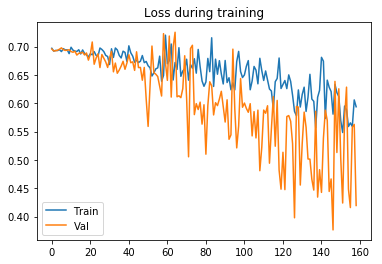

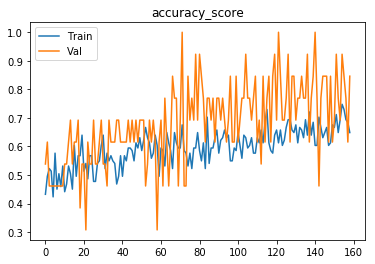

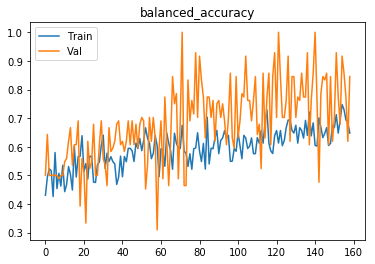

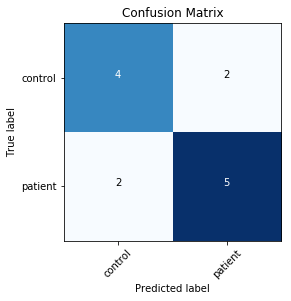

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.69860
Time elapsed: 0h:0m:1s
train accuracy_score: 44.14 %
train balanced_accuracy: 44.43 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.697020
[1,     2] loss: 0.69344
Time elapsed: 0h:0m:3s
train accuracy_score: 54.95 %
train balanced_accuracy: 55.28 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.696352
[2,     2] loss: 0.69348
Time elapsed: 0h:0m:6s
train accuracy_score: 49.55 %
train balanced_accuracy: 49.92 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.697765
[3,     2] loss: 0.69336
Time elapsed: 0h:0m:8s
train accuracy_score: 47.75 %
train balanced_accuracy: 48.10 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.697314
[4,     2] loss: 0.69641
Time elapsed: 0h:0m:10s
train accuracy_score: 50.45 %
train balanced_accuracy: 50.81 %

val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.691212
[43,     2] loss: 0.69132
Time elapsed: 0h:1m:36s
train accuracy_score: 49.55 %
train balanced_accuracy: 49.74 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.690223
[44,     2] loss: 0.69632
Time elapsed: 0h:1m:38s
train accuracy_score: 46.85 %
train balanced_accuracy: 46.96 %
val accuracy_score: 53.85 %
val balanced_accuracy: 57.14 %
Val loss: 0.688323
[45,     2] loss: 0.68949
Time elapsed: 0h:1m:40s
train accuracy_score: 47.75 %
train balanced_accuracy: 47.84 %
val accuracy_score: 53.85 %
val balanced_accuracy: 57.14 %
Val loss: 0.689519
[46,     2] loss: 0.68875
Time elapsed: 0h:1m:42s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.96 %
val accuracy_score: 38.46 %
val balanced_accuracy: 41.67 %
Val loss: 0.695334
[47,     2] loss: 0.69516
Time elapsed: 0h:1m:45s
train accuracy_score: 51.35 %
train balanced_accuracy: 51.46 %
val accuracy_score: 53.85 %
val balanced_accu

val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.675822
[86,     2] loss: 0.69005
Time elapsed: 0h:3m:13s
train accuracy_score: 52.25 %
train balanced_accuracy: 52.24 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.678538
[87,     2] loss: 0.68840
Time elapsed: 0h:3m:15s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.76 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.700485
[88,     2] loss: 0.67951
Time elapsed: 0h:3m:17s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.53 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.38 %
Val loss: 0.652554
[89,     2] loss: 0.67907
Time elapsed: 0h:3m:20s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.28 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.703862
[90,     2] loss: 0.67668
Time elapsed: 0h:3m:22s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.41 %
val accuracy_score: 76.92 %
val balanced_accu

val accuracy_score: 38.46 %
val balanced_accuracy: 39.29 %
Val loss: 0.672542
[129,     2] loss: 0.65934
Time elapsed: 0h:4m:48s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.58 %
val accuracy_score: 69.23 %
val balanced_accuracy: 71.43 %
Val loss: 0.631945
[130,     2] loss: 0.66151
Time elapsed: 0h:4m:51s
train accuracy_score: 62.16 %
train balanced_accuracy: 62.11 %
val accuracy_score: 69.23 %
val balanced_accuracy: 71.43 %
Val loss: 0.634645
[131,     2] loss: 0.66246
Time elapsed: 0h:4m:54s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.86 %
val accuracy_score: 84.62 %
val balanced_accuracy: 85.71 %
Val loss: 0.601165
[132,     2] loss: 0.66405
Time elapsed: 0h:4m:56s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.37 %
val accuracy_score: 92.31 %
val balanced_accuracy: 92.86 %
Val loss: 0.568818
[133,     2] loss: 0.68420
Time elapsed: 0h:4m:58s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.80 %
val accuracy_score: 76.92 %
val balanced

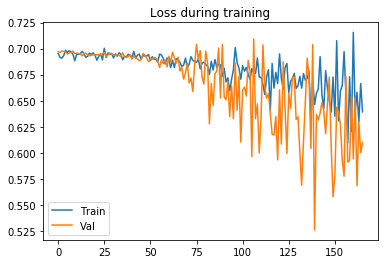

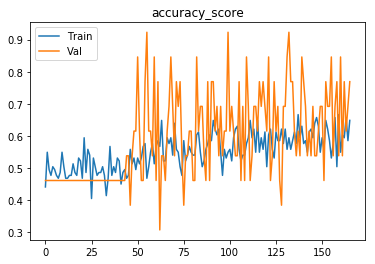

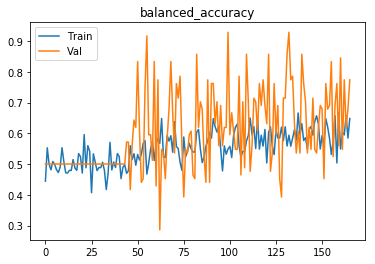

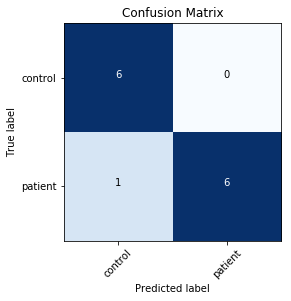

Finished outer fold.
{'final_acc': 0.9166666666666667, 'best_acc': 1.0, 'final_iter': 163, 'best_iter': 151, 'params': {'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}, 'inner_fold_idx': 2}
###### Starting outer fold 3
111
13
Shuffled the data..
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.69614
[0,     4] loss: 0.68997
[0,     6] loss: 0.69394
[0,     8] loss: 0.68894
Time elapsed: 0h:0m:1s
train accuracy_score: 50.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.699002
[1,     2] loss: 0.70236
[1,     4] loss: 0.69168
[1,     6] loss: 0.69795
[1,     8] loss: 0.67460
Time elapsed: 0h:0m:3s
train accuracy_score: 50.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.697644
[2,     2] loss: 0.70021
[2,     4] loss: 0.68438
[2,     6] loss: 0.678

Time elapsed: 0h:1m:3s
train accuracy_score: 52.25 %
train balanced_accuracy: 52.21 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.682816
[30,     2] loss: 0.68893
[30,     4] loss: 0.68770
[30,     6] loss: 0.68423
[30,     8] loss: 0.67851
Time elapsed: 0h:1m:5s
train accuracy_score: 61.26 %
train balanced_accuracy: 61.43 %
val accuracy_score: 30.77 %
val balanced_accuracy: 30.95 %
Val loss: 0.699883
[31,     2] loss: 0.69204
[31,     4] loss: 0.68084
[31,     6] loss: 0.69524
[31,     8] loss: 0.68553
Time elapsed: 0h:1m:8s
train accuracy_score: 53.15 %
train balanced_accuracy: 53.08 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.692981
[32,     2] loss: 0.68563
[32,     4] loss: 0.70248
[32,     6] loss: 0.68560
[32,     8] loss: 0.69508
Time elapsed: 0h:1m:10s
train accuracy_score: 53.15 %
train balanced_accuracy: 53.04 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.62 %
Val loss: 0.689932
[33,     2] loss: 0.69059
[33, 

[60,     2] loss: 0.67768
[60,     4] loss: 0.67293
[60,     6] loss: 0.65118
[60,     8] loss: 0.69804
Time elapsed: 0h:2m:11s
train accuracy_score: 54.95 %
train balanced_accuracy: 55.00 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.696777
[61,     2] loss: 0.70799
[61,     4] loss: 0.70750
[61,     6] loss: 0.66645
[61,     8] loss: 0.69568
Time elapsed: 0h:2m:14s
train accuracy_score: 47.75 %
train balanced_accuracy: 47.73 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.664458
[62,     2] loss: 0.69790
[62,     4] loss: 0.65117
[62,     6] loss: 0.72312
[62,     8] loss: 0.68781
Time elapsed: 0h:2m:16s
train accuracy_score: 52.25 %
train balanced_accuracy: 52.26 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.647668
[63,     2] loss: 0.72050
[63,     4] loss: 0.71745
[63,     6] loss: 0.69404
[63,     8] loss: 0.70917
Time elapsed: 0h:2m:18s
train accuracy_score: 47.75 %
train balanced_accuracy: 47.60 %
va

val accuracy_score: 53.85 %
val balanced_accuracy: 54.76 %
Val loss: 0.651738
[91,     2] loss: 0.67083
[91,     4] loss: 0.62454
[91,     6] loss: 0.72732
[91,     8] loss: 0.61152
Time elapsed: 0h:3m:18s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.52 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.639799
[92,     2] loss: 0.67179
[92,     4] loss: 0.66193
[92,     6] loss: 0.59691
[92,     8] loss: 0.68732
Time elapsed: 0h:3m:20s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.85 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.669329
[93,     2] loss: 0.72729
[93,     4] loss: 0.62386
[93,     6] loss: 0.67569
[93,     8] loss: 0.66634
Time elapsed: 0h:3m:22s
train accuracy_score: 50.45 %
train balanced_accuracy: 50.42 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.628165
[94,     2] loss: 0.65601
[94,     4] loss: 0.67326
[94,     6] loss: 0.68062
[94,     8] loss: 0.69559
Time elapse

[121,     2] loss: 0.68892
[121,     4] loss: 0.65931
[121,     6] loss: 0.70111
[121,     8] loss: 0.61722
Time elapsed: 0h:4m:23s
train accuracy_score: 62.16 %
train balanced_accuracy: 62.16 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.670525
[122,     2] loss: 0.61698
[122,     4] loss: 0.67203
[122,     6] loss: 0.70175
[122,     8] loss: 0.58926
Time elapsed: 0h:4m:26s
train accuracy_score: 62.16 %
train balanced_accuracy: 62.21 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.38 %
Val loss: 0.560735
[123,     2] loss: 0.66649
[123,     4] loss: 0.62011
[123,     6] loss: 0.67420
[123,     8] loss: 0.59831
Time elapsed: 0h:4m:28s
train accuracy_score: 61.26 %
train balanced_accuracy: 61.22 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.583265
[124,     2] loss: 0.68787
[124,     4] loss: 0.64006
[124,     6] loss: 0.62879
[124,     8] loss: 0.62642
Time elapsed: 0h:4m:30s
train accuracy_score: 58.56 %
train balanced_accu

Time elapsed: 0h:5m:28s
train accuracy_score: 69.37 %
train balanced_accuracy: 69.24 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.601855
[152,     2] loss: 0.63004
[152,     4] loss: 0.56752
[152,     6] loss: 0.72516
[152,     8] loss: 0.65772
Time elapsed: 0h:5m:30s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.32 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.544856
[153,     2] loss: 0.63194
[153,     4] loss: 0.66131
[153,     6] loss: 0.56615
[153,     8] loss: 0.59103
Time elapsed: 0h:5m:32s
train accuracy_score: 67.57 %
train balanced_accuracy: 67.50 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.583446
[154,     2] loss: 0.62846
[154,     4] loss: 0.58343
[154,     6] loss: 0.67608
[154,     8] loss: 0.67215
Time elapsed: 0h:5m:34s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.59 %
val accuracy_score: 53.85 %
val balanced_accuracy: 54.76 %
Val loss: 0.586236
[155,     2] los

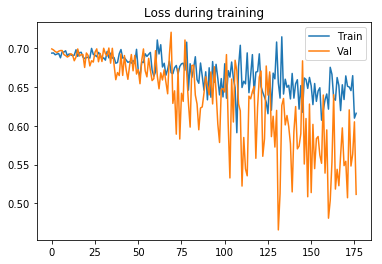

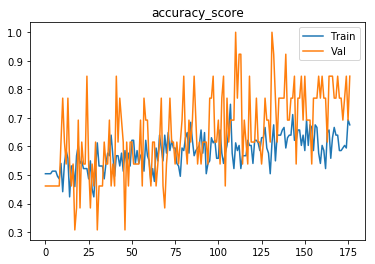

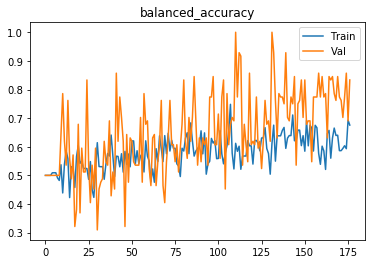

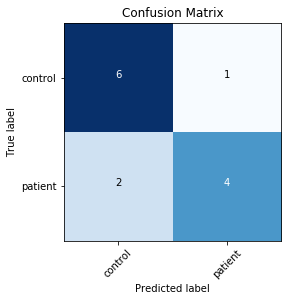

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.70029
[0,     4] loss: 0.69318
[0,     6] loss: 0.69332
[0,     8] loss: 0.69373
Time elapsed: 0h:0m:1s
train accuracy_score: 48.65 %
train balanced_accuracy: 48.49 %
val accuracy_score: 53.85 %
val balanced_accuracy: 57.14 %
Val loss: 0.694379
[1,     2] loss: 0.69529
[1,     4] loss: 0.68965
[1,     6] loss: 0.69889
[1,     8] loss: 0.69729
Time elapsed: 0h:0m:3s
train accuracy_score: 47.75 %
train balanced_accuracy: 47.48 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.695012
[2,     2] loss: 0.68274
[2,     4] loss: 0.70879
[2,     6] loss: 0.69425
[2,     8] loss: 0.70459
Time elapsed: 0h:0m:5s
train accuracy_score: 50.45 %
train balanced_accuracy: 50.03 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.693614
[3,     2] loss: 0.70442
[3,     4] loss: 0.69706
[3,     6] loss: 0.69812

Time elapsed: 0h:1m:8s
train accuracy_score: 53.15 %
train balanced_accuracy: 52.94 %
val accuracy_score: 76.92 %
val balanced_accuracy: 78.57 %
Val loss: 0.664107
[31,     2] loss: 0.67319
[31,     4] loss: 0.73166
[31,     6] loss: 0.67376
[31,     8] loss: 0.66854
Time elapsed: 0h:1m:10s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.71 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.655052
[32,     2] loss: 0.68697
[32,     4] loss: 0.67529
[32,     6] loss: 0.65815
[32,     8] loss: 0.67598
Time elapsed: 0h:1m:12s
train accuracy_score: 53.15 %
train balanced_accuracy: 53.00 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.659490
[33,     2] loss: 0.69642
[33,     4] loss: 0.64462
[33,     6] loss: 0.65437
[33,     8] loss: 0.70961
Time elapsed: 0h:1m:14s
train accuracy_score: 52.25 %
train balanced_accuracy: 52.31 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.670659
[34,     2] loss: 0.72639
[34

[61,     2] loss: 0.69207
[61,     4] loss: 0.67508
[61,     6] loss: 0.72360
[61,     8] loss: 0.63401
Time elapsed: 0h:2m:16s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.29 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.62 %
Val loss: 0.746385
[62,     2] loss: 0.61665
[62,     4] loss: 0.64714
[62,     6] loss: 0.68687
[62,     8] loss: 0.71202
Time elapsed: 0h:2m:18s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.21 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.639861
[63,     2] loss: 0.62963
[63,     4] loss: 0.72368
[63,     6] loss: 0.60472
[63,     8] loss: 0.70533
Time elapsed: 0h:2m:20s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.92 %
val accuracy_score: 84.62 %
val balanced_accuracy: 85.71 %
Val loss: 0.568658
[64,     2] loss: 0.67573
[64,     4] loss: 0.71402
[64,     6] loss: 0.56155
[64,     8] loss: 0.68300
Time elapsed: 0h:2m:22s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.33 %
va

val accuracy_score: 53.85 %
val balanced_accuracy: 54.76 %
Val loss: 0.681156
[92,     2] loss: 0.64585
[92,     4] loss: 0.61707
[92,     6] loss: 0.63632
[92,     8] loss: 0.69350
Time elapsed: 0h:3m:26s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.77 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.38 %
Val loss: 0.584003
[93,     2] loss: 0.65443
[93,     4] loss: 0.71879
[93,     6] loss: 0.61251
[93,     8] loss: 0.64815
Time elapsed: 0h:3m:28s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.29 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.664023
[94,     2] loss: 0.65921
[94,     4] loss: 0.61681
[94,     6] loss: 0.66866
[94,     8] loss: 0.68807
Time elapsed: 0h:3m:30s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.64 %
val accuracy_score: 76.92 %
val balanced_accuracy: 75.00 %
Val loss: 0.577570
[95,     2] loss: 0.64303
[95,     4] loss: 0.61958
[95,     6] loss: 0.59798
[95,     8] loss: 0.72474
Time elapse

[122,     2] loss: 0.55031
[122,     4] loss: 0.61923
[122,     6] loss: 0.68234
[122,     8] loss: 0.64664
Time elapsed: 0h:4m:33s
train accuracy_score: 69.37 %
train balanced_accuracy: 69.37 %
val accuracy_score: 92.31 %
val balanced_accuracy: 91.67 %
Val loss: 0.406103
[123,     2] loss: 0.66951
[123,     4] loss: 0.65820
[123,     6] loss: 0.48164
[123,     8] loss: 0.61266
Time elapsed: 0h:4m:36s
train accuracy_score: 68.47 %
train balanced_accuracy: 68.46 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.527437
[124,     2] loss: 0.52356
[124,     4] loss: 0.63944
[124,     6] loss: 0.60637
[124,     8] loss: 0.60812
Time elapsed: 0h:4m:38s
train accuracy_score: 71.17 %
train balanced_accuracy: 71.17 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.611965
[125,     2] loss: 0.62350
[125,     4] loss: 0.67736
[125,     6] loss: 0.72234
[125,     8] loss: 0.64301
Time elapsed: 0h:4m:40s
train accuracy_score: 61.26 %
train balanced_accu

Time elapsed: 0h:5m:37s
train accuracy_score: 72.07 %
train balanced_accuracy: 71.88 %
val accuracy_score: 92.31 %
val balanced_accuracy: 91.67 %
Val loss: 0.448645
[153,     2] loss: 0.57999
[153,     4] loss: 0.58520
[153,     6] loss: 0.64736
[153,     8] loss: 0.51846
Time elapsed: 0h:5m:39s
train accuracy_score: 71.17 %
train balanced_accuracy: 71.19 %
val accuracy_score: 92.31 %
val balanced_accuracy: 91.67 %
Val loss: 0.452753
[154,     2] loss: 0.62335
[154,     4] loss: 0.71677
[154,     6] loss: 0.67911
[154,     8] loss: 0.53188
Time elapsed: 0h:5m:41s
train accuracy_score: 62.16 %
train balanced_accuracy: 62.13 %
val accuracy_score: 92.31 %
val balanced_accuracy: 92.86 %
Val loss: 0.478284
[155,     2] loss: 0.68150
[155,     4] loss: 0.54448
[155,     6] loss: 0.52159
[155,     8] loss: 0.56956
Time elapsed: 0h:5m:43s
train accuracy_score: 69.37 %
train balanced_accuracy: 69.33 %
val accuracy_score: 84.62 %
val balanced_accuracy: 85.71 %
Val loss: 0.494689
[156,     2] los

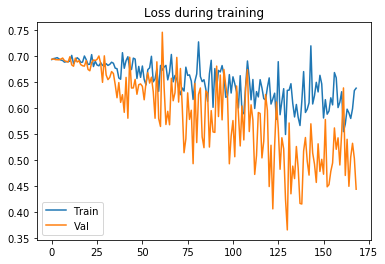

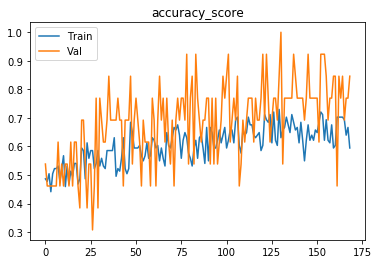

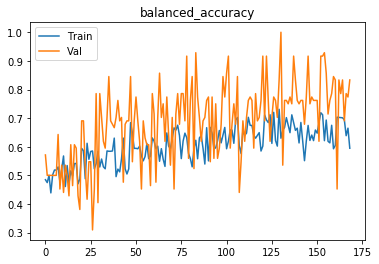

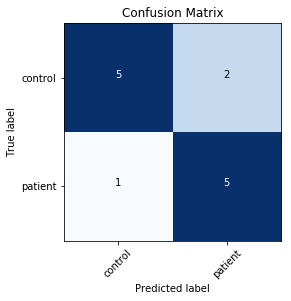

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.70074
Time elapsed: 0h:0m:1s
train accuracy_score: 49.55 %
train balanced_accuracy: 50.00 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.693146
[1,     2] loss: 0.69379
Time elapsed: 0h:0m:3s
train accuracy_score: 48.65 %
train balanced_accuracy: 49.09 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.688145
[2,     2] loss: 0.69648
Time elapsed: 0h:0m:5s
train accuracy_score: 49.55 %
train balanced_accuracy: 50.00 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.689624
[3,     2] loss: 0.70039
Time elapsed: 0h:0m:8s
train accuracy_score: 49.55 %
train balanced_accuracy: 50.00 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.690647
[4,     2] loss: 0.69534
Time elapsed: 0h:0m:10s
train accuracy_score: 49.55 %
train balanced_accuracy: 50.00 %

val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.689316
[43,     2] loss: 0.69507
Time elapsed: 0h:1m:32s
train accuracy_score: 52.25 %
train balanced_accuracy: 52.27 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.684667
[44,     2] loss: 0.69265
Time elapsed: 0h:1m:34s
train accuracy_score: 50.45 %
train balanced_accuracy: 50.45 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.688454
[45,     2] loss: 0.68802
Time elapsed: 0h:1m:36s
train accuracy_score: 51.35 %
train balanced_accuracy: 51.35 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.685026
[46,     2] loss: 0.69290
Time elapsed: 0h:1m:38s
train accuracy_score: 49.55 %
train balanced_accuracy: 49.63 %
val accuracy_score: 61.54 %
val balanced_accuracy: 58.33 %
Val loss: 0.683952
[47,     2] loss: 0.68624
Time elapsed: 0h:1m:41s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.56 %
val accuracy_score: 38.46 %
val balanced_accu

val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.673125
[86,     2] loss: 0.66356
Time elapsed: 0h:3m:2s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.79 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.684661
[87,     2] loss: 0.64933
Time elapsed: 0h:3m:4s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.69 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.656534
[88,     2] loss: 0.68635
Time elapsed: 0h:3m:6s
train accuracy_score: 46.85 %
train balanced_accuracy: 46.87 %
val accuracy_score: 76.92 %
val balanced_accuracy: 75.00 %
Val loss: 0.619286
[89,     2] loss: 0.69128
Time elapsed: 0h:3m:8s
train accuracy_score: 53.15 %
train balanced_accuracy: 53.18 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.652970
[90,     2] loss: 0.68190
Time elapsed: 0h:3m:10s
train accuracy_score: 52.25 %
train balanced_accuracy: 52.22 %
val accuracy_score: 76.92 %
val balanced_accuracy

val accuracy_score: 84.62 %
val balanced_accuracy: 84.52 %
Val loss: 0.583732
[129,     2] loss: 0.66280
Time elapsed: 0h:4m:31s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.60 %
val accuracy_score: 76.92 %
val balanced_accuracy: 75.00 %
Val loss: 0.624414
[130,     2] loss: 0.66609
Time elapsed: 0h:4m:33s
train accuracy_score: 56.76 %
train balanced_accuracy: 56.79 %
val accuracy_score: 38.46 %
val balanced_accuracy: 39.29 %
Val loss: 0.771250
[131,     2] loss: 0.66444
Time elapsed: 0h:4m:35s
train accuracy_score: 61.26 %
train balanced_accuracy: 61.25 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.678204
[132,     2] loss: 0.65843
Time elapsed: 0h:4m:37s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.86 %
val accuracy_score: 84.62 %
val balanced_accuracy: 83.33 %
Val loss: 0.577489
[133,     2] loss: 0.66317
Time elapsed: 0h:4m:39s
train accuracy_score: 51.35 %
train balanced_accuracy: 51.23 %
val accuracy_score: 61.54 %
val balanced

val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.600520
Early stopping in epoch 172
Total time elapsed: 0h:5m:59s
Writing model to disk...
Best result during training: 1.00. Saving model..
Finished inner fold.


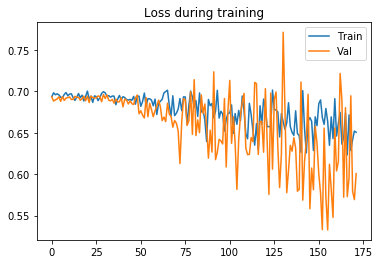

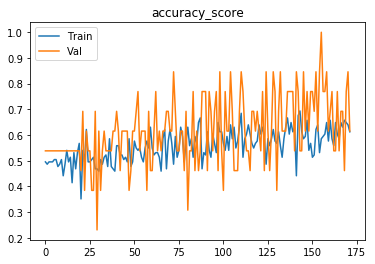

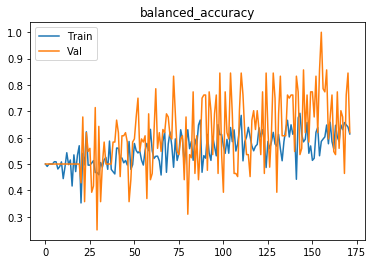

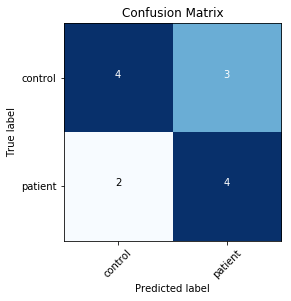

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.69640
[0,     4] loss: 0.70337
[0,     6] loss: 0.68176
Time elapsed: 0h:0m:1s
train accuracy_score: 49.55 %
train balanced_accuracy: 50.00 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.690989
[1,     2] loss: 0.69368
[1,     4] loss: 0.70500
[1,     6] loss: 0.68939
Time elapsed: 0h:0m:3s
train accuracy_score: 49.55 %
train balanced_accuracy: 50.00 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.691208
[2,     2] loss: 0.68816
[2,     4] loss: 0.69866
[2,     6] loss: 0.70011
Time elapsed: 0h:0m:5s
train accuracy_score: 48.65 %
train balanced_accuracy: 49.09 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.691141
[3,     2] loss: 0.69848
[3,     4] loss: 0.70026
[3,     6] loss: 0.68696
Time elapsed: 0h:0m:7s
train accuracy_score: 46.85 %
train balanced_accurac

val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.653239
[34,     2] loss: 0.68723
[34,     4] loss: 0.66756
[34,     6] loss: 0.67743
Time elapsed: 0h:1m:13s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.41 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.683836
[35,     2] loss: 0.67942
[35,     4] loss: 0.68940
[35,     6] loss: 0.67938
Time elapsed: 0h:1m:15s
train accuracy_score: 53.15 %
train balanced_accuracy: 53.20 %
val accuracy_score: 30.77 %
val balanced_accuracy: 28.57 %
Val loss: 0.727758
[36,     2] loss: 0.69649
[36,     4] loss: 0.67564
[36,     6] loss: 0.68123
Time elapsed: 0h:1m:17s
train accuracy_score: 54.95 %
train balanced_accuracy: 55.06 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.682023
[37,     2] loss: 0.69810
[37,     4] loss: 0.65025
[37,     6] loss: 0.68176
Time elapsed: 0h:1m:20s
train accuracy_score: 54.95 %
train balanced_accuracy: 55.06 %
val accuracy_score: 61.54 %


val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.609713
[68,     2] loss: 0.67523
[68,     4] loss: 0.70294
[68,     6] loss: 0.67412
Time elapsed: 0h:2m:23s
train accuracy_score: 52.25 %
train balanced_accuracy: 52.31 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.630247
[69,     2] loss: 0.68428
[69,     4] loss: 0.65835
[69,     6] loss: 0.64822
Time elapsed: 0h:2m:25s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.68 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.656827
[70,     2] loss: 0.63877
[70,     4] loss: 0.62633
[70,     6] loss: 0.71504
Time elapsed: 0h:2m:27s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.31 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.655234
[71,     2] loss: 0.62926
[71,     4] loss: 0.68480
[71,     6] loss: 0.71757
Time elapsed: 0h:2m:30s
train accuracy_score: 56.76 %
train balanced_accuracy: 56.79 %
val accuracy_score: 84.62 %


val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.645145
[102,     2] loss: 0.65546
[102,     4] loss: 0.63654
[102,     6] loss: 0.61976
Time elapsed: 0h:3m:34s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.42 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.616773
[103,     2] loss: 0.68345
[103,     4] loss: 0.65640
[103,     6] loss: 0.64832
Time elapsed: 0h:3m:36s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.54 %
val accuracy_score: 92.31 %
val balanced_accuracy: 91.67 %
Val loss: 0.510703
[104,     2] loss: 0.58895
[104,     4] loss: 0.62681
[104,     6] loss: 0.67870
Time elapsed: 0h:3m:38s
train accuracy_score: 63.06 %
train balanced_accuracy: 63.05 %
val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.610898
[105,     2] loss: 0.65572
[105,     4] loss: 0.64328
[105,     6] loss: 0.61149
Time elapsed: 0h:3m:40s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.75 %
val accuracy_sco

Time elapsed: 0h:4m:44s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.70 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.550645
[136,     2] loss: 0.64920
[136,     4] loss: 0.69920
[136,     6] loss: 0.53325
Time elapsed: 0h:4m:46s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.61 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.586405
[137,     2] loss: 0.64524
[137,     4] loss: 0.60427
[137,     6] loss: 0.69502
Time elapsed: 0h:4m:48s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.99 %
val accuracy_score: 84.62 %
val balanced_accuracy: 85.71 %
Val loss: 0.526505
[138,     2] loss: 0.65988
[138,     4] loss: 0.68716
[138,     6] loss: 0.69562
Time elapsed: 0h:4m:50s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.34 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.38 %
Val loss: 0.581437
[139,     2] loss: 0.64877
[139,     4] loss: 0.70891
[139,     6] loss: 0.65218
Time elapsed: 0h

val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.498225
[169,     2] loss: 0.57701
[169,     4] loss: 0.59947
[169,     6] loss: 0.71545
Time elapsed: 0h:5m:54s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.73 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.559956
[170,     2] loss: 0.73054
[170,     4] loss: 0.65796
[170,     6] loss: 0.62969
Time elapsed: 0h:5m:56s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.88 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.600128
[171,     2] loss: 0.60347
[171,     4] loss: 0.62477
[171,     6] loss: 0.68521
Time elapsed: 0h:5m:58s
train accuracy_score: 63.06 %
train balanced_accuracy: 63.04 %
val accuracy_score: 92.31 %
val balanced_accuracy: 91.67 %
Val loss: 0.468625
[172,     2] loss: 0.69361
[172,     4] loss: 0.66012
[172,     6] loss: 0.57862
Time elapsed: 0h:6m:0s
train accuracy_score: 69.37 %
train balanced_accuracy: 69.20 %
val accuracy_scor

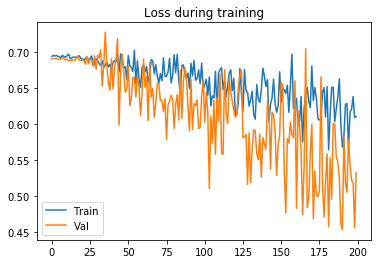

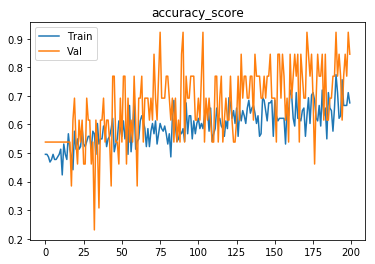

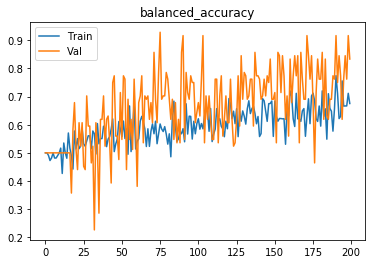

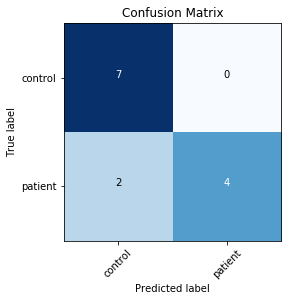

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.69189
[0,     4] loss: 0.70014
[0,     6] loss: 0.69980
[0,     8] loss: 0.69320
Time elapsed: 0h:0m:1s
train accuracy_score: 45.05 %
train balanced_accuracy: 45.05 %
val accuracy_score: 46.15 %
val balanced_accuracy: 48.81 %
Val loss: 0.693742
[1,     2] loss: 0.69286
[1,     4] loss: 0.68968
[1,     6] loss: 0.69081
[1,     8] loss: 0.68956
Time elapsed: 0h:0m:3s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.95 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.689641
[2,     2] loss: 0.69111
[2,     4] loss: 0.68973
[2,     6] loss: 0.68960
[2,     8] loss: 0.69497
Time elapsed: 0h:0m:5s
train accuracy_score: 52.25 %
train balanced_accuracy: 52.48 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.689687
[3,     2] loss: 0.69524
[3,     4] loss: 0.69586
[3,     6] loss: 0.69667


Time elapsed: 0h:1m:5s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.41 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.652079
[31,     2] loss: 0.64562
[31,     4] loss: 0.67260
[31,     6] loss: 0.72422
[31,     8] loss: 0.62276
Time elapsed: 0h:1m:7s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.91 %
val accuracy_score: 84.62 %
val balanced_accuracy: 84.52 %
Val loss: 0.634251
[32,     2] loss: 0.68022
[32,     4] loss: 0.72246
[32,     6] loss: 0.69528
[32,     8] loss: 0.70976
Time elapsed: 0h:1m:9s
train accuracy_score: 54.05 %
train balanced_accuracy: 54.14 %
val accuracy_score: 38.46 %
val balanced_accuracy: 39.29 %
Val loss: 0.679055
[33,     2] loss: 0.70114
[33,     4] loss: 0.65206
[33,     6] loss: 0.68506
[33,     8] loss: 0.69850
Time elapsed: 0h:1m:11s
train accuracy_score: 50.45 %
train balanced_accuracy: 50.45 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.692198
[34,     2] loss: 0.67845
[34, 

[61,     2] loss: 0.71184
[61,     4] loss: 0.68332
[61,     6] loss: 0.66020
[61,     8] loss: 0.62784
Time elapsed: 0h:2m:10s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.76 %
val accuracy_score: 76.92 %
val balanced_accuracy: 78.57 %
Val loss: 0.670470
[62,     2] loss: 0.67647
[62,     4] loss: 0.67918
[62,     6] loss: 0.65944
[62,     8] loss: 0.66142
Time elapsed: 0h:2m:12s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.38 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.660443
[63,     2] loss: 0.68540
[63,     4] loss: 0.67706
[63,     6] loss: 0.66891
[63,     8] loss: 0.68933
Time elapsed: 0h:2m:14s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.52 %
val accuracy_score: 38.46 %
val balanced_accuracy: 40.48 %
Val loss: 0.714382
[64,     2] loss: 0.70300
[64,     4] loss: 0.68762
[64,     6] loss: 0.67205
[64,     8] loss: 0.70893
Time elapsed: 0h:2m:16s
train accuracy_score: 47.75 %
train balanced_accuracy: 47.66 %
va

val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.614702
[92,     2] loss: 0.69762
[92,     4] loss: 0.71410
[92,     6] loss: 0.66943
[92,     8] loss: 0.65829
Time elapsed: 0h:3m:15s
train accuracy_score: 54.05 %
train balanced_accuracy: 54.14 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.650063
[93,     2] loss: 0.69347
[93,     4] loss: 0.67611
[93,     6] loss: 0.70917
[93,     8] loss: 0.68538
Time elapsed: 0h:3m:17s
train accuracy_score: 50.45 %
train balanced_accuracy: 50.42 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.684364
[94,     2] loss: 0.68908
[94,     4] loss: 0.71114
[94,     6] loss: 0.62901
[94,     8] loss: 0.68604
Time elapsed: 0h:3m:19s
train accuracy_score: 54.05 %
train balanced_accuracy: 53.96 %
val accuracy_score: 92.31 %
val balanced_accuracy: 92.86 %
Val loss: 0.639226
[95,     2] loss: 0.65845
[95,     4] loss: 0.66748
[95,     6] loss: 0.67159
[95,     8] loss: 0.63161
Time elapse

[122,     2] loss: 0.68835
[122,     4] loss: 0.62317
[122,     6] loss: 0.61646
[122,     8] loss: 0.69500
Time elapsed: 0h:4m:18s
train accuracy_score: 61.26 %
train balanced_accuracy: 61.27 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.683790
[123,     2] loss: 0.68705
[123,     4] loss: 0.68000
[123,     6] loss: 0.65097
[123,     8] loss: 0.66414
Time elapsed: 0h:4m:20s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.61 %
val accuracy_score: 84.62 %
val balanced_accuracy: 83.33 %
Val loss: 0.611051
[124,     2] loss: 0.67086
[124,     4] loss: 0.60336
[124,     6] loss: 0.66165
[124,     8] loss: 0.62037
Time elapsed: 0h:4m:22s
train accuracy_score: 63.06 %
train balanced_accuracy: 62.87 %
val accuracy_score: 76.92 %
val balanced_accuracy: 78.57 %
Val loss: 0.613229
[125,     2] loss: 0.66007
[125,     4] loss: 0.65395
[125,     6] loss: 0.64494
[125,     8] loss: 0.63788
Time elapsed: 0h:4m:24s
train accuracy_score: 66.67 %
train balanced_accu

Time elapsed: 0h:5m:24s
train accuracy_score: 54.95 %
train balanced_accuracy: 55.11 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.623088
[153,     2] loss: 0.69197
[153,     4] loss: 0.65092
[153,     6] loss: 0.60445
[153,     8] loss: 0.63279
Time elapsed: 0h:5m:26s
train accuracy_score: 61.26 %
train balanced_accuracy: 61.27 %
val accuracy_score: 84.62 %
val balanced_accuracy: 83.33 %
Val loss: 0.580815
[154,     2] loss: 0.63898
[154,     4] loss: 0.61954
[154,     6] loss: 0.65895
[154,     8] loss: 0.53663
Time elapsed: 0h:5m:29s
train accuracy_score: 68.47 %
train balanced_accuracy: 68.36 %
val accuracy_score: 76.92 %
val balanced_accuracy: 78.57 %
Val loss: 0.577503
[155,     2] loss: 0.66944
[155,     4] loss: 0.70216
[155,     6] loss: 0.67486
[155,     8] loss: 0.66569
Time elapsed: 0h:5m:31s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.39 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.625332
[156,     2] los

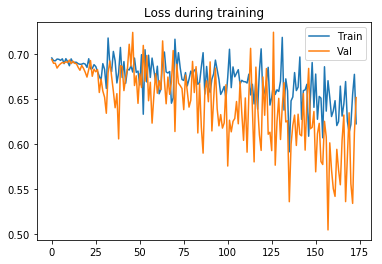

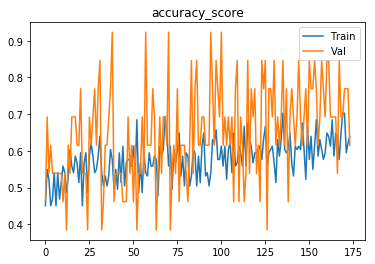

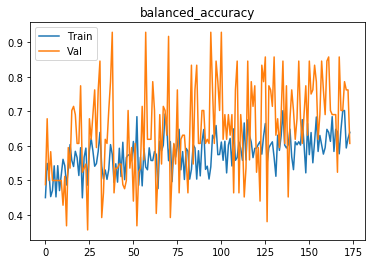

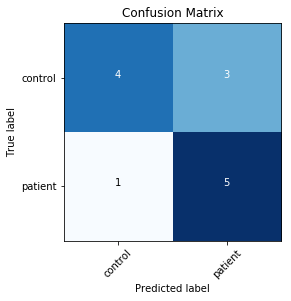

Finished outer fold.
{'final_acc': 0.8333333333333333, 'best_acc': 0.8571428571428572, 'final_iter': 177, 'best_iter': 132, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 5e-05}, 'inner_fold_idx': 0}
###### Starting outer fold 4
111
13
Shuffled the data..
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.70983
[0,     4] loss: 0.69855
[0,     6] loss: 0.70341
Time elapsed: 0h:0m:1s
train accuracy_score: 45.95 %
train balanced_accuracy: 50.00 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.700906
[1,     2] loss: 0.69484
[1,     4] loss: 0.70383
[1,     6] loss: 0.69822
Time elapsed: 0h:0m:3s
train accuracy_score: 46.85 %
train balanced_accuracy: 50.83 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.697462
[2,     2] loss: 0.70398
[2,     4] loss: 0.68510
[2,     6] loss: 0.69090
Time elapsed: 0h:0m:5s
train acc

Time elapsed: 0h:1m:11s
train accuracy_score: 63.06 %
train balanced_accuracy: 62.01 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.681514
[33,     2] loss: 0.67773
[33,     4] loss: 0.70401
[33,     6] loss: 0.69470
Time elapsed: 0h:1m:14s
train accuracy_score: 50.45 %
train balanced_accuracy: 48.58 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.714393
[34,     2] loss: 0.67608
[34,     4] loss: 0.67964
[34,     6] loss: 0.71602
Time elapsed: 0h:1m:16s
train accuracy_score: 55.86 %
train balanced_accuracy: 53.87 %
val accuracy_score: 53.85 %
val balanced_accuracy: 51.19 %
Val loss: 0.664192
[35,     2] loss: 0.68114
[35,     4] loss: 0.68344
[35,     6] loss: 0.69906
Time elapsed: 0h:1m:18s
train accuracy_score: 54.05 %
train balanced_accuracy: 52.06 %
val accuracy_score: 53.85 %
val balanced_accuracy: 51.19 %
Val loss: 0.682259
[36,     2] loss: 0.67505
[36,     4] loss: 0.66766
[36,     6] loss: 0.69283
Time elapsed: 0h:1m:20s
trai

Time elapsed: 0h:2m:26s
train accuracy_score: 54.05 %
train balanced_accuracy: 53.09 %
val accuracy_score: 69.23 %
val balanced_accuracy: 66.67 %
Val loss: 0.646538
[67,     2] loss: 0.68810
[67,     4] loss: 0.64121
[67,     6] loss: 0.69870
Time elapsed: 0h:2m:28s
train accuracy_score: 55.86 %
train balanced_accuracy: 52.84 %
val accuracy_score: 61.54 %
val balanced_accuracy: 58.33 %
Val loss: 0.672905
[68,     2] loss: 0.67303
[68,     4] loss: 0.62280
[68,     6] loss: 0.62139
Time elapsed: 0h:2m:30s
train accuracy_score: 64.86 %
train balanced_accuracy: 63.24 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.648938
[69,     2] loss: 0.66622
[69,     4] loss: 0.71459
[69,     6] loss: 0.62280
Time elapsed: 0h:2m:32s
train accuracy_score: 62.16 %
train balanced_accuracy: 61.91 %
val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.680007
[70,     2] loss: 0.65972
[70,     4] loss: 0.68029
[70,     6] loss: 0.61399
Time elapsed: 0h:2m:35s
trai

Time elapsed: 0h:3m:39s
train accuracy_score: 54.05 %
train balanced_accuracy: 53.68 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.682914
[101,     2] loss: 0.60255
[101,     4] loss: 0.70303
[101,     6] loss: 0.58085
Time elapsed: 0h:3m:42s
train accuracy_score: 68.47 %
train balanced_accuracy: 66.86 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.616488
[102,     2] loss: 0.63581
[102,     4] loss: 0.62100
[102,     6] loss: 0.71709
Time elapsed: 0h:3m:44s
train accuracy_score: 60.36 %
train balanced_accuracy: 59.22 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.663709
[103,     2] loss: 0.70061
[103,     4] loss: 0.62937
[103,     6] loss: 0.69090
Time elapsed: 0h:3m:46s
train accuracy_score: 59.46 %
train balanced_accuracy: 57.94 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.672092
[104,     2] loss: 0.66060
[104,     4] loss: 0.70085
[104,     6] loss: 0.68680
Time elapsed: 0h

val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.624780
[134,     2] loss: 0.62339
[134,     4] loss: 0.63236
[134,     6] loss: 0.76374
Time elapsed: 0h:4m:54s
train accuracy_score: 60.36 %
train balanced_accuracy: 59.36 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.732661
[135,     2] loss: 0.67897
[135,     4] loss: 0.67875
[135,     6] loss: 0.58443
Time elapsed: 0h:4m:56s
train accuracy_score: 62.16 %
train balanced_accuracy: 60.74 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.678744
[136,     2] loss: 0.65545
[136,     4] loss: 0.57383
[136,     6] loss: 0.57934
Time elapsed: 0h:4m:58s
train accuracy_score: 68.47 %
train balanced_accuracy: 69.07 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.682204
[137,     2] loss: 0.64829
[137,     4] loss: 0.55041
[137,     6] loss: 0.59754
Time elapsed: 0h:5m:0s
train accuracy_score: 66.67 %
train balanced_accuracy: 65.93 %
val accuracy_scor

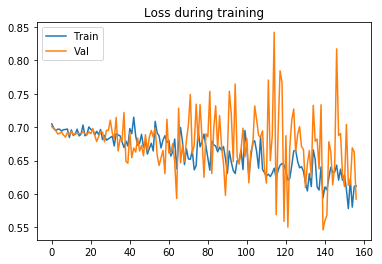

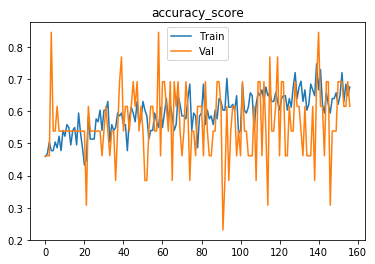

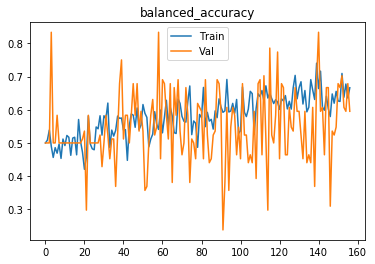

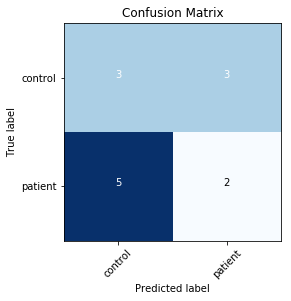

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.69738
[0,     4] loss: 0.69726
[0,     6] loss: 0.69018
Time elapsed: 0h:0m:1s
train accuracy_score: 47.75 %
train balanced_accuracy: 50.78 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.693391
[1,     2] loss: 0.69795
[1,     4] loss: 0.69643
[1,     6] loss: 0.69286
Time elapsed: 0h:0m:3s
train accuracy_score: 44.14 %
train balanced_accuracy: 45.83 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.692196
[2,     2] loss: 0.69474
[2,     4] loss: 0.69639
[2,     6] loss: 0.69614
Time elapsed: 0h:0m:6s
train accuracy_score: 46.85 %
train balanced_accuracy: 46.27 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.692820
[3,     2] loss: 0.68962
[3,     4] loss: 0.68354
[3,     6] loss: 0.70437
Time elapsed: 0h:0m:8s
train accuracy_score: 53.15 %
train balanced_accura

Time elapsed: 0h:1m:13s
train accuracy_score: 56.76 %
train balanced_accuracy: 55.44 %
val accuracy_score: 53.85 %
val balanced_accuracy: 51.19 %
Val loss: 0.633863
[34,     2] loss: 0.64095
[34,     4] loss: 0.66712
[34,     6] loss: 0.73222
Time elapsed: 0h:1m:15s
train accuracy_score: 57.66 %
train balanced_accuracy: 55.69 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.698893
[35,     2] loss: 0.65999
[35,     4] loss: 0.65923
[35,     6] loss: 0.64811
Time elapsed: 0h:1m:17s
train accuracy_score: 57.66 %
train balanced_accuracy: 56.27 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.743343
[36,     2] loss: 0.68923
[36,     4] loss: 0.67003
[36,     6] loss: 0.63875
Time elapsed: 0h:1m:19s
train accuracy_score: 58.56 %
train balanced_accuracy: 57.40 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.614031
[37,     2] loss: 0.67953
[37,     4] loss: 0.66255
[37,     6] loss: 0.64236
Time elapsed: 0h:1m:21s
trai

Time elapsed: 0h:2m:27s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.23 %
val accuracy_score: 53.85 %
val balanced_accuracy: 51.19 %
Val loss: 0.697410
[68,     2] loss: 0.68445
[68,     4] loss: 0.68584
[68,     6] loss: 0.66109
Time elapsed: 0h:2m:29s
train accuracy_score: 60.36 %
train balanced_accuracy: 58.19 %
val accuracy_score: 69.23 %
val balanced_accuracy: 66.67 %
Val loss: 0.647362
[69,     2] loss: 0.68922
[69,     4] loss: 0.66673
[69,     6] loss: 0.67771
Time elapsed: 0h:2m:31s
train accuracy_score: 57.66 %
train balanced_accuracy: 55.39 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.591651
[70,     2] loss: 0.69349
[70,     4] loss: 0.74078
[70,     6] loss: 0.60975
Time elapsed: 0h:2m:33s
train accuracy_score: 54.95 %
train balanced_accuracy: 53.48 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.721615
[71,     2] loss: 0.64626
[71,     4] loss: 0.67854
[71,     6] loss: 0.66766
Time elapsed: 0h:2m:35s
trai

Time elapsed: 0h:3m:41s
train accuracy_score: 60.36 %
train balanced_accuracy: 59.22 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.624350
[102,     2] loss: 0.62322
[102,     4] loss: 0.58938
[102,     6] loss: 0.63795
Time elapsed: 0h:3m:43s
train accuracy_score: 70.27 %
train balanced_accuracy: 69.26 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.688063
[103,     2] loss: 0.61650
[103,     4] loss: 0.60206
[103,     6] loss: 0.66104
Time elapsed: 0h:3m:45s
train accuracy_score: 66.67 %
train balanced_accuracy: 65.93 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.660853
[104,     2] loss: 0.62822
[104,     4] loss: 0.65946
[104,     6] loss: 0.62418
Time elapsed: 0h:3m:47s
train accuracy_score: 66.67 %
train balanced_accuracy: 65.20 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.612798
[105,     2] loss: 0.64699
[105,     4] loss: 0.65052
[105,     6] loss: 0.65219
Time elapsed: 0h

val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.671758
[135,     2] loss: 0.60057
[135,     4] loss: 0.61787
[135,     6] loss: 0.59022
Time elapsed: 0h:4m:55s
train accuracy_score: 67.57 %
train balanced_accuracy: 65.74 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.726586
[136,     2] loss: 0.55569
[136,     4] loss: 0.58122
[136,     6] loss: 0.60828
Time elapsed: 0h:4m:57s
train accuracy_score: 72.97 %
train balanced_accuracy: 72.21 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.683004
[137,     2] loss: 0.56836
[137,     4] loss: 0.62444
[137,     6] loss: 0.59253
Time elapsed: 0h:4m:59s
train accuracy_score: 69.37 %
train balanced_accuracy: 67.99 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.650006
[138,     2] loss: 0.66653
[138,     4] loss: 0.67348
[138,     6] loss: 0.57104
Time elapsed: 0h:5m:1s
train accuracy_score: 63.06 %
train balanced_accuracy: 61.72 %
val accuracy_scor

Time elapsed: 0h:6m:6s
train accuracy_score: 58.56 %
train balanced_accuracy: 56.96 %
val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.624898
[169,     2] loss: 0.65578
[169,     4] loss: 0.57998
[169,     6] loss: 0.55210
Time elapsed: 0h:6m:9s
train accuracy_score: 70.27 %
train balanced_accuracy: 69.85 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.672496
[170,     2] loss: 0.62430
[170,     4] loss: 0.56773
[170,     6] loss: 0.68017
Time elapsed: 0h:6m:11s
train accuracy_score: 71.17 %
train balanced_accuracy: 70.25 %
val accuracy_score: 76.92 %
val balanced_accuracy: 75.00 %
Val loss: 0.600653
[171,     2] loss: 0.59847
[171,     4] loss: 0.52441
[171,     6] loss: 0.70036
Time elapsed: 0h:6m:13s
train accuracy_score: 61.26 %
train balanced_accuracy: 60.20 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.695559
Early stopping in epoch 172
Total time elapsed: 0h:6m:14s
Writing model to disk...
Best result duri

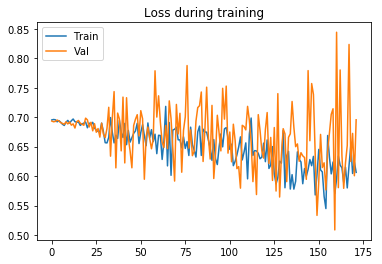

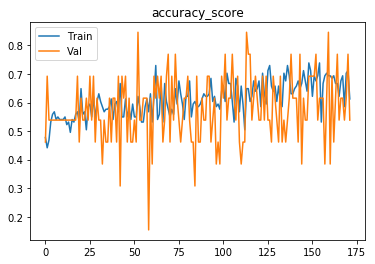

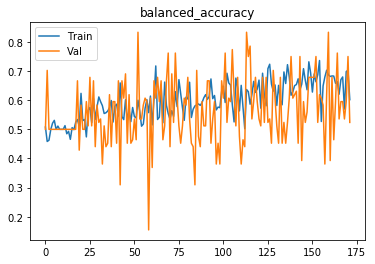

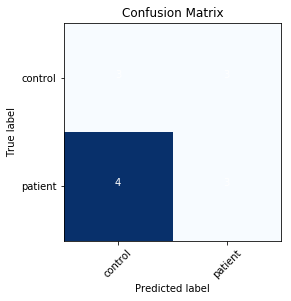

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.69042
[0,     4] loss: 0.69596
[0,     6] loss: 0.69925
Time elapsed: 0h:0m:1s
train accuracy_score: 45.05 %
train balanced_accuracy: 44.46 %
val accuracy_score: 38.46 %
val balanced_accuracy: 35.71 %
Val loss: 0.694577
[1,     2] loss: 0.69537
[1,     4] loss: 0.69018
[1,     6] loss: 0.68653
Time elapsed: 0h:0m:3s
train accuracy_score: 52.25 %
train balanced_accuracy: 50.54 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.692315
[2,     2] loss: 0.69260
[2,     4] loss: 0.68428
[2,     6] loss: 0.70150
Time elapsed: 0h:0m:5s
train accuracy_score: 47.75 %
train balanced_accuracy: 44.17 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.698240
[3,     2] loss: 0.69141
[3,     4] loss: 0.69582
[3,     6] loss: 0.69433
Time elapsed: 0h:0m:8s
train accuracy_score: 53.15 %
train balanced_accura

val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.688594
[34,     2] loss: 0.68612
[34,     4] loss: 0.68391
[34,     6] loss: 0.67830
Time elapsed: 0h:1m:16s
train accuracy_score: 56.76 %
train balanced_accuracy: 52.94 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.684020
[35,     2] loss: 0.68704
[35,     4] loss: 0.69125
[35,     6] loss: 0.67335
Time elapsed: 0h:1m:18s
train accuracy_score: 56.76 %
train balanced_accuracy: 53.53 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.687613
[36,     2] loss: 0.69825
[36,     4] loss: 0.67247
[36,     6] loss: 0.69052
Time elapsed: 0h:1m:20s
train accuracy_score: 55.86 %
train balanced_accuracy: 52.84 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.677210
[37,     2] loss: 0.66865
[37,     4] loss: 0.72251
[37,     6] loss: 0.67992
Time elapsed: 0h:1m:23s
train accuracy_score: 56.76 %
train balanced_accuracy: 53.53 %
val accuracy_score: 61.54 %


val accuracy_score: 69.23 %
val balanced_accuracy: 66.67 %
Val loss: 0.669123
[68,     2] loss: 0.67746
[68,     4] loss: 0.69528
[68,     6] loss: 0.68879
Time elapsed: 0h:2m:31s
train accuracy_score: 59.46 %
train balanced_accuracy: 57.21 %
val accuracy_score: 61.54 %
val balanced_accuracy: 58.33 %
Val loss: 0.652680
[69,     2] loss: 0.73032
[69,     4] loss: 0.69953
[69,     6] loss: 0.66389
Time elapsed: 0h:2m:33s
train accuracy_score: 54.05 %
train balanced_accuracy: 51.32 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.678741
[70,     2] loss: 0.65065
[70,     4] loss: 0.66664
[70,     6] loss: 0.66321
Time elapsed: 0h:2m:35s
train accuracy_score: 63.06 %
train balanced_accuracy: 61.42 %
val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.643132
[71,     2] loss: 0.67999
[71,     4] loss: 0.65484
[71,     6] loss: 0.63098
Time elapsed: 0h:2m:38s
train accuracy_score: 62.16 %
train balanced_accuracy: 61.18 %
val accuracy_score: 61.54 %


val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.602742
[102,     2] loss: 0.67175
[102,     4] loss: 0.65403
[102,     6] loss: 0.63158
Time elapsed: 0h:3m:46s
train accuracy_score: 63.96 %
train balanced_accuracy: 62.84 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.707162
[103,     2] loss: 0.67017
[103,     4] loss: 0.71937
[103,     6] loss: 0.64794
Time elapsed: 0h:3m:48s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.36 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.709965
[104,     2] loss: 0.64042
[104,     4] loss: 0.65619
[104,     6] loss: 0.63303
Time elapsed: 0h:3m:50s
train accuracy_score: 64.86 %
train balanced_accuracy: 65.00 %
val accuracy_score: 53.85 %
val balanced_accuracy: 51.19 %
Val loss: 0.676550
[105,     2] loss: 0.61597
[105,     4] loss: 0.64846
[105,     6] loss: 0.62089
Time elapsed: 0h:3m:52s
train accuracy_score: 69.37 %
train balanced_accuracy: 67.70 %
val accuracy_sco

Time elapsed: 0h:4m:57s
train accuracy_score: 57.66 %
train balanced_accuracy: 56.13 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.709359
[136,     2] loss: 0.66812
[136,     4] loss: 0.62484
[136,     6] loss: 0.61952
Time elapsed: 0h:4m:59s
train accuracy_score: 62.16 %
train balanced_accuracy: 60.59 %
val accuracy_score: 61.54 %
val balanced_accuracy: 58.33 %
Val loss: 0.681309
[137,     2] loss: 0.61894
[137,     4] loss: 0.58153
[137,     6] loss: 0.60403
Time elapsed: 0h:5m:1s
train accuracy_score: 66.67 %
train balanced_accuracy: 65.05 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.650222
[138,     2] loss: 0.58564
[138,     4] loss: 0.62903
[138,     6] loss: 0.65237
Time elapsed: 0h:5m:3s
train accuracy_score: 72.07 %
train balanced_accuracy: 71.81 %
val accuracy_score: 38.46 %
val balanced_accuracy: 39.29 %
Val loss: 0.758720
[139,     2] loss: 0.64640
[139,     4] loss: 0.70164
[139,     6] loss: 0.65957
Time elapsed: 0h:5

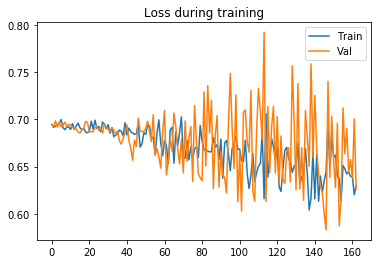

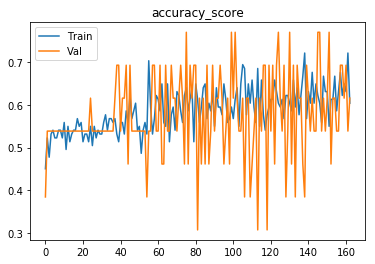

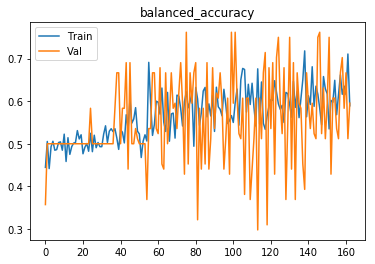

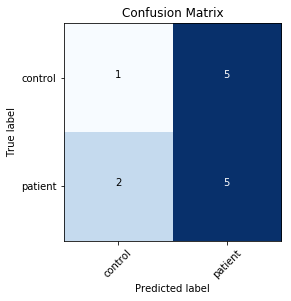

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 12, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.69953
Time elapsed: 0h:0m:1s
train accuracy_score: 45.95 %
train balanced_accuracy: 50.00 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.699786
[1,     2] loss: 0.69568
Time elapsed: 0h:0m:3s
train accuracy_score: 46.85 %
train balanced_accuracy: 50.83 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.698582
[2,     2] loss: 0.70183
Time elapsed: 0h:0m:5s
train accuracy_score: 43.24 %
train balanced_accuracy: 46.91 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.695374
[3,     2] loss: 0.69729
Time elapsed: 0h:0m:8s
train accuracy_score: 42.34 %
train balanced_accuracy: 44.61 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.693723
[4,     2] loss: 0.69264
Time elapsed: 0h:0m:10s
train accuracy_score: 46.85 %
train balanced_accuracy: 47.30 

val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.686886
[43,     2] loss: 0.68140
Time elapsed: 0h:1m:36s
train accuracy_score: 63.06 %
train balanced_accuracy: 60.10 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.687235
[44,     2] loss: 0.68281
Time elapsed: 0h:1m:38s
train accuracy_score: 57.66 %
train balanced_accuracy: 54.80 %
val accuracy_score: 61.54 %
val balanced_accuracy: 58.33 %
Val loss: 0.663490
[45,     2] loss: 0.68179
Time elapsed: 0h:1m:40s
train accuracy_score: 58.56 %
train balanced_accuracy: 56.81 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.688575
[46,     2] loss: 0.68885
Time elapsed: 0h:1m:42s
train accuracy_score: 55.86 %
train balanced_accuracy: 54.61 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.692989
[47,     2] loss: 0.66505
Time elapsed: 0h:1m:45s
train accuracy_score: 67.57 %
train balanced_accuracy: 66.18 %
val accuracy_score: 76.92 %
val balanced_accu

val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.583560
[86,     2] loss: 0.63713
Time elapsed: 0h:3m:10s
train accuracy_score: 66.67 %
train balanced_accuracy: 64.61 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.690177
[87,     2] loss: 0.60997
Time elapsed: 0h:3m:13s
train accuracy_score: 67.57 %
train balanced_accuracy: 66.18 %
val accuracy_score: 53.85 %
val balanced_accuracy: 54.76 %
Val loss: 0.639909
[88,     2] loss: 0.64245
Time elapsed: 0h:3m:15s
train accuracy_score: 61.26 %
train balanced_accuracy: 60.64 %
val accuracy_score: 23.08 %
val balanced_accuracy: 22.62 %
Val loss: 0.782884
[89,     2] loss: 0.65983
Time elapsed: 0h:3m:17s
train accuracy_score: 62.16 %
train balanced_accuracy: 60.29 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.675247
[90,     2] loss: 0.67083
Time elapsed: 0h:3m:19s
train accuracy_score: 58.56 %
train balanced_accuracy: 57.11 %
val accuracy_score: 69.23 %
val balanced_accu

val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.723526
[129,     2] loss: 0.66250
Time elapsed: 0h:4m:45s
train accuracy_score: 62.16 %
train balanced_accuracy: 59.26 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.663919
[130,     2] loss: 0.61882
Time elapsed: 0h:4m:47s
train accuracy_score: 62.16 %
train balanced_accuracy: 60.59 %
val accuracy_score: 38.46 %
val balanced_accuracy: 38.10 %
Val loss: 0.723744
[131,     2] loss: 0.62358
Time elapsed: 0h:4m:49s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.58 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.786190
[132,     2] loss: 0.61296
Time elapsed: 0h:4m:51s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.87 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.622428
[133,     2] loss: 0.63718
Time elapsed: 0h:4m:54s
train accuracy_score: 56.76 %
train balanced_accuracy: 55.74 %
val accuracy_score: 69.23 %
val balanced

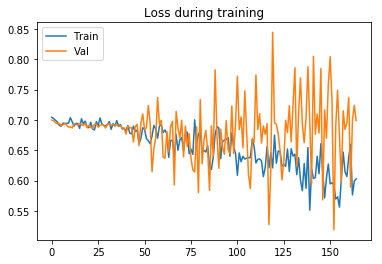

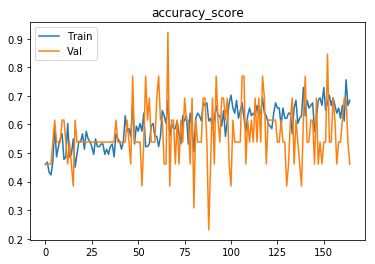

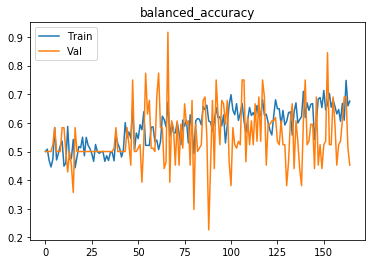

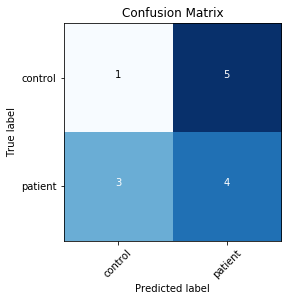

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.67795
[0,     4] loss: 0.69917
[0,     6] loss: 0.68930
Time elapsed: 0h:0m:1s
train accuracy_score: 54.05 %
train balanced_accuracy: 50.00 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.690240
[1,     2] loss: 0.69794
[1,     4] loss: 0.68237
[1,     6] loss: 0.68616
Time elapsed: 0h:0m:3s
train accuracy_score: 54.05 %
train balanced_accuracy: 50.00 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.688795
[2,     2] loss: 0.70806
[2,     4] loss: 0.68944
[2,     6] loss: 0.66552
Time elapsed: 0h:0m:5s
train accuracy_score: 54.05 %
train balanced_accuracy: 50.00 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.689790
[3,     2] loss: 0.68938
[3,     4] loss: 0.70444
[3,     6] loss: 0.68314
Time elapsed: 0h:0m:8s
train accuracy_score: 54.95 %
train balanced_accura

Time elapsed: 0h:1m:12s
train accuracy_score: 54.95 %
train balanced_accuracy: 52.16 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.701199
[34,     2] loss: 0.69960
[34,     4] loss: 0.67602
[34,     6] loss: 0.66003
Time elapsed: 0h:1m:15s
train accuracy_score: 52.25 %
train balanced_accuracy: 49.22 %
val accuracy_score: 69.23 %
val balanced_accuracy: 66.67 %
Val loss: 0.652931
[35,     2] loss: 0.68611
[35,     4] loss: 0.68498
[35,     6] loss: 0.69606
Time elapsed: 0h:1m:17s
train accuracy_score: 54.95 %
train balanced_accuracy: 53.19 %
val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.681792
[36,     2] loss: 0.68263
[36,     4] loss: 0.70343
[36,     6] loss: 0.66318
Time elapsed: 0h:1m:19s
train accuracy_score: 53.15 %
train balanced_accuracy: 50.64 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.687243
[37,     2] loss: 0.70275
[37,     4] loss: 0.68737
[37,     6] loss: 0.68523
Time elapsed: 0h:1m:21s
trai

Time elapsed: 0h:2m:26s
train accuracy_score: 64.86 %
train balanced_accuracy: 63.38 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.724881
[68,     2] loss: 0.67247
[68,     4] loss: 0.63940
[68,     6] loss: 0.64514
Time elapsed: 0h:2m:28s
train accuracy_score: 61.26 %
train balanced_accuracy: 60.64 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.714546
[69,     2] loss: 0.61595
[69,     4] loss: 0.65116
[69,     6] loss: 0.63221
Time elapsed: 0h:2m:30s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.26 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.651778
[70,     2] loss: 0.65241
[70,     4] loss: 0.58143
[70,     6] loss: 0.61958
Time elapsed: 0h:2m:32s
train accuracy_score: 69.37 %
train balanced_accuracy: 67.99 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.655303
[71,     2] loss: 0.61375
[71,     4] loss: 0.61127
[71,     6] loss: 0.64437
Time elapsed: 0h:2m:34s
trai

Time elapsed: 0h:3m:39s
train accuracy_score: 64.86 %
train balanced_accuracy: 63.82 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.678668
[102,     2] loss: 0.61995
[102,     4] loss: 0.64443
[102,     6] loss: 0.62297
Time elapsed: 0h:3m:41s
train accuracy_score: 61.26 %
train balanced_accuracy: 60.78 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.712653
[103,     2] loss: 0.60774
[103,     4] loss: 0.60489
[103,     6] loss: 0.72874
Time elapsed: 0h:3m:43s
train accuracy_score: 61.26 %
train balanced_accuracy: 59.75 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.615297
[104,     2] loss: 0.63157
[104,     4] loss: 0.62009
[104,     6] loss: 0.66666
Time elapsed: 0h:3m:45s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.08 %
val accuracy_score: 84.62 %
val balanced_accuracy: 83.33 %
Val loss: 0.507935
[105,     2] loss: 0.62714
[105,     4] loss: 0.59234
[105,     6] loss: 0.54748
Time elapsed: 0h

val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.735133
[135,     2] loss: 0.60033
[135,     4] loss: 0.60450
[135,     6] loss: 0.56600
Time elapsed: 0h:4m:53s
train accuracy_score: 65.77 %
train balanced_accuracy: 64.51 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.722150
[136,     2] loss: 0.67543
[136,     4] loss: 0.53247
[136,     6] loss: 0.70862
Time elapsed: 0h:4m:56s
train accuracy_score: 63.96 %
train balanced_accuracy: 62.55 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.565727
[137,     2] loss: 0.52785
[137,     4] loss: 0.61078
[137,     6] loss: 0.63333
Time elapsed: 0h:4m:58s
train accuracy_score: 69.37 %
train balanced_accuracy: 69.61 %
val accuracy_score: 69.23 %
val balanced_accuracy: 66.67 %
Val loss: 0.628432
[138,     2] loss: 0.69176
[138,     4] loss: 0.59892
[138,     6] loss: 0.69816
Time elapsed: 0h:5m:0s
train accuracy_score: 63.06 %
train balanced_accuracy: 61.42 %
val accuracy_scor

Time elapsed: 0h:6m:11s
train accuracy_score: 75.68 %
train balanced_accuracy: 75.44 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.621255
[169,     2] loss: 0.63475
[169,     4] loss: 0.64956
[169,     6] loss: 0.51776
Time elapsed: 0h:6m:14s
train accuracy_score: 72.07 %
train balanced_accuracy: 72.25 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.610076
[170,     2] loss: 0.49382
[170,     4] loss: 0.79321
[170,     6] loss: 0.50197
Time elapsed: 0h:6m:16s
train accuracy_score: 73.87 %
train balanced_accuracy: 72.89 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.551954
[171,     2] loss: 0.44455
[171,     4] loss: 0.56466
[171,     6] loss: 0.63519
Time elapsed: 0h:6m:19s
train accuracy_score: 78.38 %
train balanced_accuracy: 77.21 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.613920
[172,     2] loss: 0.48663
[172,     4] loss: 0.52625
[172,     6] loss: 0.57853
Time elapsed: 0h

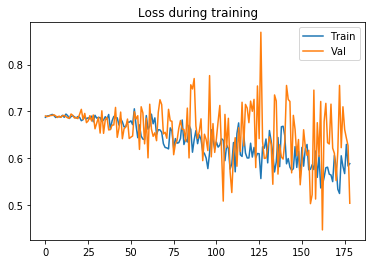

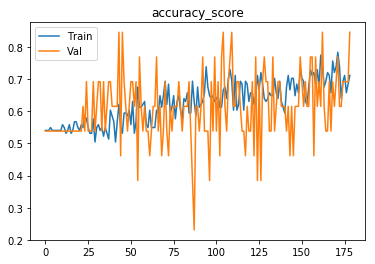

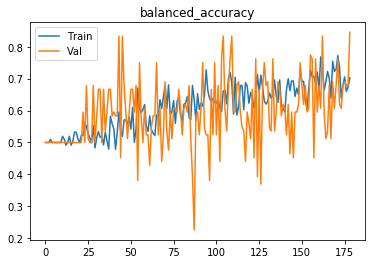

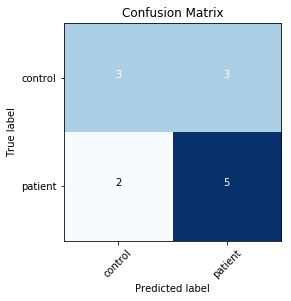

Finished outer fold.
{'final_acc': 0.8452380952380951, 'best_acc': 0.8452380952380951, 'final_iter': 179, 'best_iter': 179, 'params': {'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}, 'inner_fold_idx': 4}
###### Starting outer fold 5
111
13
Shuffled the data..
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.69811
Time elapsed: 0h:0m:1s
train accuracy_score: 45.95 %
train balanced_accuracy: 50.00 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.698872
[1,     2] loss: 0.70060
Time elapsed: 0h:0m:4s
train accuracy_score: 46.85 %
train balanced_accuracy: 50.83 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.697974
[2,     2] loss: 0.69765
Time elapsed: 0h:0m:6s
train accuracy_score: 45.05 %
train balanced_accuracy: 49.02 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.697037
[3,     2] loss: 0

[41,     2] loss: 0.69012
Time elapsed: 0h:1m:44s
train accuracy_score: 58.56 %
train balanced_accuracy: 55.64 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.680721
[42,     2] loss: 0.68954
Time elapsed: 0h:1m:47s
train accuracy_score: 58.56 %
train balanced_accuracy: 55.49 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.696571
[43,     2] loss: 0.69123
Time elapsed: 0h:1m:49s
train accuracy_score: 51.35 %
train balanced_accuracy: 48.38 %
val accuracy_score: 61.54 %
val balanced_accuracy: 58.33 %
Val loss: 0.681000
[44,     2] loss: 0.68874
Time elapsed: 0h:1m:51s
train accuracy_score: 54.95 %
train balanced_accuracy: 52.60 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.674670
[45,     2] loss: 0.69248
Time elapsed: 0h:1m:54s
train accuracy_score: 56.76 %
train balanced_accuracy: 54.71 %
val accuracy_score: 84.62 %
val balanced_accuracy: 83.33 %
Val loss: 0.673654
[46,     2] loss: 0.68589
Time elapsed: 0h:1m

[84,     2] loss: 0.71144
Time elapsed: 0h:3m:22s
train accuracy_score: 45.05 %
train balanced_accuracy: 43.87 %
val accuracy_score: 53.85 %
val balanced_accuracy: 51.19 %
Val loss: 0.658899
[85,     2] loss: 0.67554
Time elapsed: 0h:3m:24s
train accuracy_score: 54.95 %
train balanced_accuracy: 52.75 %
val accuracy_score: 53.85 %
val balanced_accuracy: 51.19 %
Val loss: 0.681589
[86,     2] loss: 0.69352
Time elapsed: 0h:3m:27s
train accuracy_score: 56.76 %
train balanced_accuracy: 54.12 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.673787
[87,     2] loss: 0.69712
Time elapsed: 0h:3m:29s
train accuracy_score: 52.25 %
train balanced_accuracy: 49.07 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.701292
[88,     2] loss: 0.68548
Time elapsed: 0h:3m:31s
train accuracy_score: 59.46 %
train balanced_accuracy: 56.18 %
val accuracy_score: 61.54 %
val balanced_accuracy: 58.33 %
Val loss: 0.660633
[89,     2] loss: 0.67994
Time elapsed: 0h:3m

[127,     2] loss: 0.67265
Time elapsed: 0h:5m:3s
train accuracy_score: 58.56 %
train balanced_accuracy: 57.40 %
val accuracy_score: 30.77 %
val balanced_accuracy: 29.76 %
Val loss: 0.699786
[128,     2] loss: 0.67523
Time elapsed: 0h:5m:5s
train accuracy_score: 59.46 %
train balanced_accuracy: 58.38 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.672375
[129,     2] loss: 0.65969
Time elapsed: 0h:5m:7s
train accuracy_score: 62.16 %
train balanced_accuracy: 61.03 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.626796
[130,     2] loss: 0.65414
Time elapsed: 0h:5m:9s
train accuracy_score: 63.96 %
train balanced_accuracy: 62.84 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.700762
[131,     2] loss: 0.66196
Time elapsed: 0h:5m:12s
train accuracy_score: 62.16 %
train balanced_accuracy: 60.59 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.643092
[132,     2] loss: 0.67847
Time elapsed: 0h:

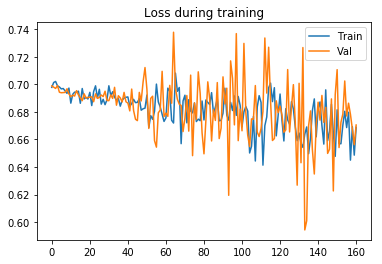

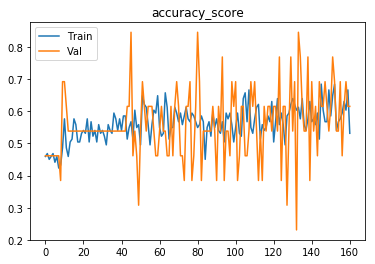

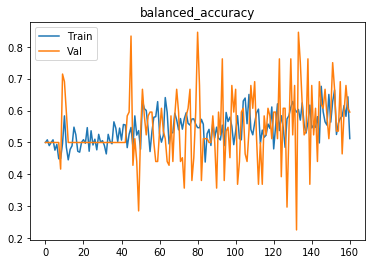

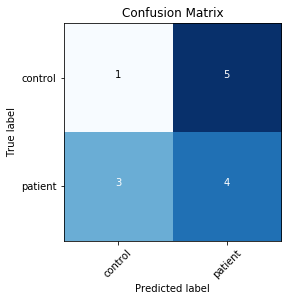

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.69182
Time elapsed: 0h:0m:1s
train accuracy_score: 52.25 %
train balanced_accuracy: 54.07 %
val accuracy_score: 46.15 %
val balanced_accuracy: 48.81 %
Val loss: 0.693185
[1,     2] loss: 0.69351
Time elapsed: 0h:0m:3s
train accuracy_score: 48.65 %
train balanced_accuracy: 48.68 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.692596
[2,     2] loss: 0.69079
Time elapsed: 0h:0m:6s
train accuracy_score: 54.05 %
train balanced_accuracy: 52.94 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.691518
[3,     2] loss: 0.69064
Time elapsed: 0h:0m:8s
train accuracy_score: 53.15 %
train balanced_accuracy: 50.64 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.690664
[4,     2] loss: 0.69167
Time elapsed: 0h:0m:10s
train accuracy_score: 55.86 %
train balanced_accuracy: 52.99 %

val accuracy_score: 30.77 %
val balanced_accuracy: 29.76 %
Val loss: 0.783414
[43,     2] loss: 0.64386
Time elapsed: 0h:1m:36s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.14 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.751413
[44,     2] loss: 0.64801
Time elapsed: 0h:1m:38s
train accuracy_score: 60.36 %
train balanced_accuracy: 59.51 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.672241
[45,     2] loss: 0.72904
Time elapsed: 0h:1m:40s
train accuracy_score: 55.86 %
train balanced_accuracy: 52.99 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.759084
[46,     2] loss: 0.65938
Time elapsed: 0h:1m:43s
train accuracy_score: 61.26 %
train balanced_accuracy: 59.75 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.728734
[47,     2] loss: 0.67559
Time elapsed: 0h:1m:45s
train accuracy_score: 60.36 %
train balanced_accuracy: 58.19 %
val accuracy_score: 30.77 %
val balanced_accu

val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.654527
[86,     2] loss: 0.64873
Time elapsed: 0h:3m:11s
train accuracy_score: 66.67 %
train balanced_accuracy: 65.34 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.662714
[87,     2] loss: 0.65411
Time elapsed: 0h:3m:13s
train accuracy_score: 64.86 %
train balanced_accuracy: 63.53 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.598865
[88,     2] loss: 0.66329
Time elapsed: 0h:3m:15s
train accuracy_score: 59.46 %
train balanced_accuracy: 58.38 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.658384
[89,     2] loss: 0.66490
Time elapsed: 0h:3m:17s
train accuracy_score: 54.95 %
train balanced_accuracy: 53.63 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.638660
[90,     2] loss: 0.67032
Time elapsed: 0h:3m:19s
train accuracy_score: 66.67 %
train balanced_accuracy: 65.20 %
val accuracy_score: 53.85 %
val balanced_accu

val accuracy_score: 69.23 %
val balanced_accuracy: 66.67 %
Val loss: 0.674316
[129,     2] loss: 0.64947
Time elapsed: 0h:4m:45s
train accuracy_score: 66.67 %
train balanced_accuracy: 65.20 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.654143
[130,     2] loss: 0.65975
Time elapsed: 0h:4m:47s
train accuracy_score: 63.06 %
train balanced_accuracy: 62.16 %
val accuracy_score: 84.62 %
val balanced_accuracy: 84.52 %
Val loss: 0.613402
[131,     2] loss: 0.63004
Time elapsed: 0h:4m:49s
train accuracy_score: 72.07 %
train balanced_accuracy: 70.78 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.637759
[132,     2] loss: 0.64755
Time elapsed: 0h:4m:52s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.14 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.608036
[133,     2] loss: 0.70732
Time elapsed: 0h:4m:54s
train accuracy_score: 51.35 %
train balanced_accuracy: 51.18 %
val accuracy_score: 69.23 %
val balanced

val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.670199
[172,     2] loss: 0.63047
Time elapsed: 0h:6m:20s
train accuracy_score: 65.77 %
train balanced_accuracy: 64.36 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.639238
[173,     2] loss: 0.61520
Time elapsed: 0h:6m:22s
train accuracy_score: 63.96 %
train balanced_accuracy: 62.70 %
val accuracy_score: 61.54 %
val balanced_accuracy: 58.33 %
Val loss: 0.618145
[174,     2] loss: 0.60913
Time elapsed: 0h:6m:24s
train accuracy_score: 66.67 %
train balanced_accuracy: 65.34 %
val accuracy_score: 53.85 %
val balanced_accuracy: 51.19 %
Val loss: 0.742280
[175,     2] loss: 0.63415
Time elapsed: 0h:6m:26s
train accuracy_score: 67.57 %
train balanced_accuracy: 66.18 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.637976
[176,     2] loss: 0.62385
Time elapsed: 0h:6m:28s
train accuracy_score: 65.77 %
train balanced_accuracy: 64.22 %
val accuracy_score: 61.54 %
val balanced

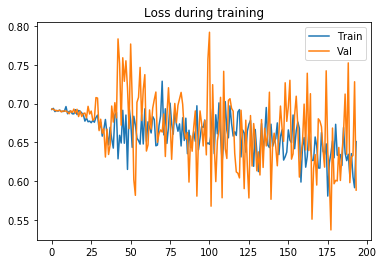

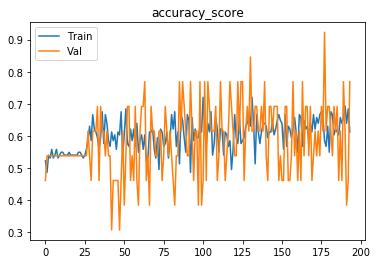

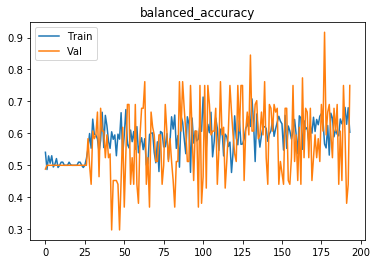

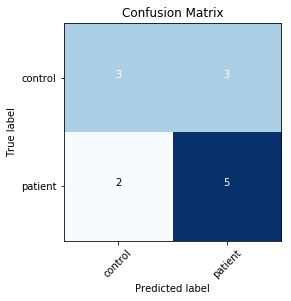

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.69316
Time elapsed: 0h:0m:1s
train accuracy_score: 47.75 %
train balanced_accuracy: 49.46 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.692056
[1,     2] loss: 0.69475
Time elapsed: 0h:0m:3s
train accuracy_score: 44.14 %
train balanced_accuracy: 45.83 %
val accuracy_score: 53.85 %
val balanced_accuracy: 57.14 %
Val loss: 0.691004
[2,     2] loss: 0.70012
Time elapsed: 0h:0m:5s
train accuracy_score: 38.74 %
train balanced_accuracy: 39.66 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.62 %
Val loss: 0.694602
[3,     2] loss: 0.69464
Time elapsed: 0h:0m:8s
train accuracy_score: 45.95 %
train balanced_accuracy: 46.62 %
val accuracy_score: 15.38 %
val balanced_accuracy: 16.67 %
Val loss: 0.694153
[4,     2] loss: 0.69995
Time elapsed: 0h:0m:10s
train accuracy_score: 45.05 %
train balanced_accuracy: 45.34 %

val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.688392
[43,     2] loss: 0.68815
Time elapsed: 0h:1m:35s
train accuracy_score: 54.05 %
train balanced_accuracy: 50.29 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.695210
[44,     2] loss: 0.69635
Time elapsed: 0h:1m:38s
train accuracy_score: 54.05 %
train balanced_accuracy: 50.29 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.689065
[45,     2] loss: 0.68807
Time elapsed: 0h:1m:40s
train accuracy_score: 52.25 %
train balanced_accuracy: 48.48 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.693861
[46,     2] loss: 0.69258
Time elapsed: 0h:1m:42s
train accuracy_score: 50.45 %
train balanced_accuracy: 47.11 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.688403
[47,     2] loss: 0.69466
Time elapsed: 0h:1m:44s
train accuracy_score: 53.15 %
train balanced_accuracy: 50.05 %
val accuracy_score: 53.85 %
val balanced_accu

val accuracy_score: 46.15 %
val balanced_accuracy: 42.86 %
Val loss: 0.694205
[86,     2] loss: 0.68484
Time elapsed: 0h:3m:10s
train accuracy_score: 57.66 %
train balanced_accuracy: 54.95 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.651327
[87,     2] loss: 0.69107
Time elapsed: 0h:3m:12s
train accuracy_score: 55.86 %
train balanced_accuracy: 52.99 %
val accuracy_score: 38.46 %
val balanced_accuracy: 36.90 %
Val loss: 0.705957
[88,     2] loss: 0.68751
Time elapsed: 0h:3m:14s
train accuracy_score: 54.05 %
train balanced_accuracy: 52.06 %
val accuracy_score: 61.54 %
val balanced_accuracy: 58.33 %
Val loss: 0.678447
[89,     2] loss: 0.67791
Time elapsed: 0h:3m:16s
train accuracy_score: 58.56 %
train balanced_accuracy: 56.08 %
val accuracy_score: 46.15 %
val balanced_accuracy: 42.86 %
Val loss: 0.686720
[90,     2] loss: 0.67933
Time elapsed: 0h:3m:18s
train accuracy_score: 58.56 %
train balanced_accuracy: 55.78 %
val accuracy_score: 61.54 %
val balanced_accu

val accuracy_score: 53.85 %
val balanced_accuracy: 51.19 %
Val loss: 0.657417
[129,     2] loss: 0.69521
Time elapsed: 0h:4m:44s
train accuracy_score: 54.05 %
train balanced_accuracy: 51.91 %
val accuracy_score: 69.23 %
val balanced_accuracy: 66.67 %
Val loss: 0.684430
[130,     2] loss: 0.67841
Time elapsed: 0h:4m:46s
train accuracy_score: 59.46 %
train balanced_accuracy: 56.91 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.674470
[131,     2] loss: 0.66543
Time elapsed: 0h:4m:48s
train accuracy_score: 58.56 %
train balanced_accuracy: 56.52 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.692576
[132,     2] loss: 0.69845
Time elapsed: 0h:4m:50s
train accuracy_score: 46.85 %
train balanced_accuracy: 44.22 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.679975
[133,     2] loss: 0.69437
Time elapsed: 0h:4m:52s
train accuracy_score: 47.75 %
train balanced_accuracy: 45.64 %
val accuracy_score: 69.23 %
val balanced

val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.667643
[172,     2] loss: 0.68205
Time elapsed: 0h:6m:18s
train accuracy_score: 57.66 %
train balanced_accuracy: 55.25 %
val accuracy_score: 61.54 %
val balanced_accuracy: 58.33 %
Val loss: 0.688872
[173,     2] loss: 0.69398
Time elapsed: 0h:6m:20s
train accuracy_score: 55.86 %
train balanced_accuracy: 54.02 %
val accuracy_score: 46.15 %
val balanced_accuracy: 42.86 %
Val loss: 0.701926
[174,     2] loss: 0.67578
Time elapsed: 0h:6m:22s
train accuracy_score: 57.66 %
train balanced_accuracy: 55.25 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.673999
[175,     2] loss: 0.66408
Time elapsed: 0h:6m:24s
train accuracy_score: 55.86 %
train balanced_accuracy: 53.58 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.682777
[176,     2] loss: 0.67571
Time elapsed: 0h:6m:26s
train accuracy_score: 58.56 %
train balanced_accuracy: 56.52 %
val accuracy_score: 53.85 %
val balanced

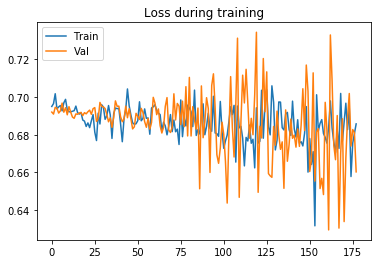

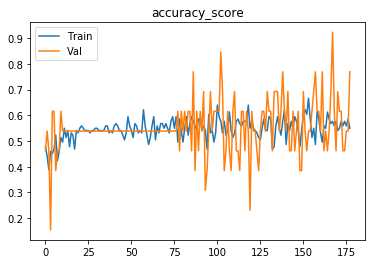

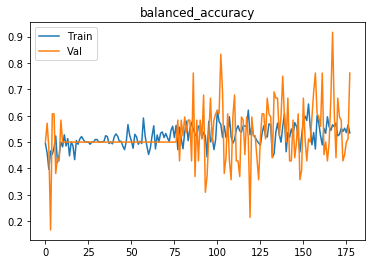

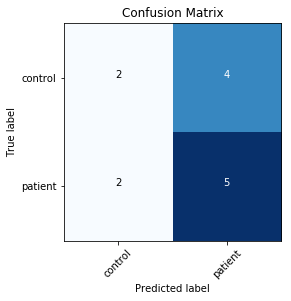

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.69610
[0,     4] loss: 0.69060
[0,     6] loss: 0.70015
[0,     8] loss: 0.69843
Time elapsed: 0h:0m:1s
train accuracy_score: 44.14 %
train balanced_accuracy: 44.80 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.691354
[1,     2] loss: 0.69790
[1,     4] loss: 0.70167
[1,     6] loss: 0.68489
[1,     8] loss: 0.69001
Time elapsed: 0h:0m:3s
train accuracy_score: 50.45 %
train balanced_accuracy: 47.55 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.691382
[2,     2] loss: 0.69584
[2,     4] loss: 0.69290
[2,     6] loss: 0.67664
[2,     8] loss: 0.70015
Time elapsed: 0h:0m:6s
train accuracy_score: 50.45 %
train balanced_accuracy: 46.96 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.691540
[3,     2] loss: 0.68548
[3,     4] loss: 0.69337
[3,     6] loss: 0.70066

Time elapsed: 0h:1m:6s
train accuracy_score: 60.36 %
train balanced_accuracy: 57.89 %
val accuracy_score: 76.92 %
val balanced_accuracy: 75.00 %
Val loss: 0.650195
[31,     2] loss: 0.67066
[31,     4] loss: 0.68916
[31,     6] loss: 0.72388
[31,     8] loss: 0.64803
Time elapsed: 0h:1m:8s
train accuracy_score: 55.86 %
train balanced_accuracy: 53.14 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.689451
[32,     2] loss: 0.68416
[32,     4] loss: 0.65109
[32,     6] loss: 0.71488
[32,     8] loss: 0.70023
Time elapsed: 0h:1m:10s
train accuracy_score: 54.05 %
train balanced_accuracy: 52.65 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.660194
[33,     2] loss: 0.68478
[33,     4] loss: 0.68183
[33,     6] loss: 0.64009
[33,     8] loss: 0.68567
Time elapsed: 0h:1m:12s
train accuracy_score: 62.16 %
train balanced_accuracy: 59.56 %
val accuracy_score: 61.54 %
val balanced_accuracy: 58.33 %
Val loss: 0.669289
[34,     2] loss: 0.68327
[34,

[61,     2] loss: 0.65129
[61,     4] loss: 0.70212
[61,     6] loss: 0.66183
[61,     8] loss: 0.65275
Time elapsed: 0h:2m:12s
train accuracy_score: 58.56 %
train balanced_accuracy: 57.25 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.700726
[62,     2] loss: 0.69198
[62,     4] loss: 0.63878
[62,     6] loss: 0.67999
[62,     8] loss: 0.70565
Time elapsed: 0h:2m:15s
train accuracy_score: 57.66 %
train balanced_accuracy: 56.27 %
val accuracy_score: 84.62 %
val balanced_accuracy: 83.33 %
Val loss: 0.581228
[63,     2] loss: 0.67592
[63,     4] loss: 0.63342
[63,     6] loss: 0.64450
[63,     8] loss: 0.67840
Time elapsed: 0h:2m:17s
train accuracy_score: 63.06 %
train balanced_accuracy: 61.27 %
val accuracy_score: 46.15 %
val balanced_accuracy: 42.86 %
Val loss: 0.689701
[64,     2] loss: 0.71400
[64,     4] loss: 0.68745
[64,     6] loss: 0.73859
[64,     8] loss: 0.66449
Time elapsed: 0h:2m:19s
train accuracy_score: 51.35 %
train balanced_accuracy: 49.12 %
va

val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.672292
[92,     2] loss: 0.62968
[92,     4] loss: 0.69707
[92,     6] loss: 0.68525
[92,     8] loss: 0.69800
Time elapsed: 0h:3m:17s
train accuracy_score: 57.66 %
train balanced_accuracy: 56.42 %
val accuracy_score: 69.23 %
val balanced_accuracy: 66.67 %
Val loss: 0.665625
[93,     2] loss: 0.63820
[93,     4] loss: 0.70128
[93,     6] loss: 0.72621
[93,     8] loss: 0.62632
Time elapsed: 0h:3m:18s
train accuracy_score: 61.26 %
train balanced_accuracy: 59.75 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.586422
[94,     2] loss: 0.66725
[94,     4] loss: 0.63381
[94,     6] loss: 0.65984
[94,     8] loss: 0.74312
Time elapsed: 0h:3m:21s
train accuracy_score: 54.95 %
train balanced_accuracy: 53.48 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.659663
[95,     2] loss: 0.61145
[95,     4] loss: 0.74377
[95,     6] loss: 0.63539
[95,     8] loss: 0.72229
Time elapse

[122,     2] loss: 0.64310
[122,     4] loss: 0.69184
[122,     6] loss: 0.65768
[122,     8] loss: 0.63355
Time elapsed: 0h:4m:18s
train accuracy_score: 56.76 %
train balanced_accuracy: 56.18 %
val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.683359
[123,     2] loss: 0.60680
[123,     4] loss: 0.74862
[123,     6] loss: 0.57095
[123,     8] loss: 0.64876
Time elapsed: 0h:4m:20s
train accuracy_score: 63.06 %
train balanced_accuracy: 61.57 %
val accuracy_score: 61.54 %
val balanced_accuracy: 58.33 %
Val loss: 0.611834
[124,     2] loss: 0.57248
[124,     4] loss: 0.63447
[124,     6] loss: 0.74224
[124,     8] loss: 0.65014
Time elapsed: 0h:4m:22s
train accuracy_score: 54.95 %
train balanced_accuracy: 52.89 %
val accuracy_score: 69.23 %
val balanced_accuracy: 66.67 %
Val loss: 0.663630
[125,     2] loss: 0.60643
[125,     4] loss: 0.58864
[125,     6] loss: 0.64525
[125,     8] loss: 0.58600
Time elapsed: 0h:4m:25s
train accuracy_score: 68.47 %
train balanced_accu

Time elapsed: 0h:5m:24s
train accuracy_score: 59.46 %
train balanced_accuracy: 57.35 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.590907
[153,     2] loss: 0.62982
[153,     4] loss: 0.63558
[153,     6] loss: 0.58002
[153,     8] loss: 0.65032
Time elapsed: 0h:5m:27s
train accuracy_score: 65.77 %
train balanced_accuracy: 63.77 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.672578
[154,     2] loss: 0.67072
[154,     4] loss: 0.57512
[154,     6] loss: 0.68214
[154,     8] loss: 0.63070
Time elapsed: 0h:5m:29s
train accuracy_score: 63.96 %
train balanced_accuracy: 62.70 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.611397
[155,     2] loss: 0.57864
[155,     4] loss: 0.68966
[155,     6] loss: 0.56166
[155,     8] loss: 0.65951
Time elapsed: 0h:5m:31s
train accuracy_score: 72.97 %
train balanced_accuracy: 72.94 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.665897
[156,     2] los

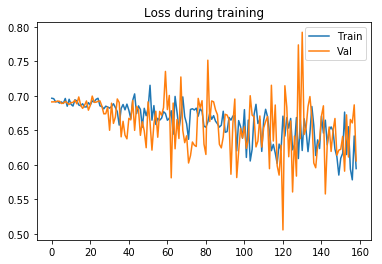

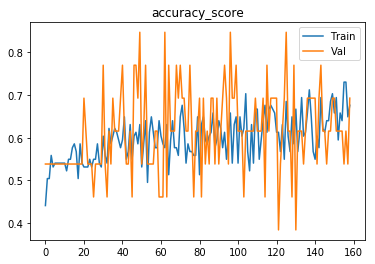

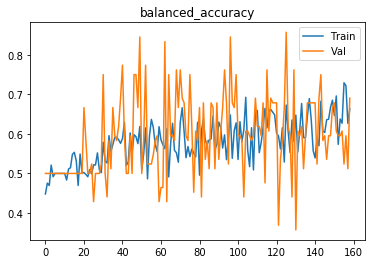

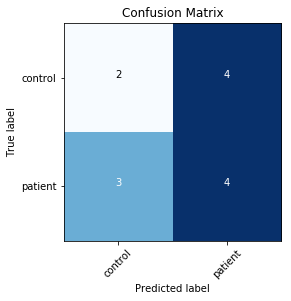

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.69557
[0,     4] loss: 0.69982
[0,     6] loss: 0.68959
[0,     8] loss: 0.69684
Time elapsed: 0h:0m:1s
train accuracy_score: 47.75 %
train balanced_accuracy: 50.05 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.692548
[1,     2] loss: 0.68496
[1,     4] loss: 0.68494
[1,     6] loss: 0.69988
[1,     8] loss: 0.69919
Time elapsed: 0h:0m:3s
train accuracy_score: 52.25 %
train balanced_accuracy: 49.80 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.693679
[2,     2] loss: 0.69586
[2,     4] loss: 0.67871
[2,     6] loss: 0.67097
[2,     8] loss: 0.70608
Time elapsed: 0h:0m:6s
train accuracy_score: 55.86 %
train balanced_accuracy: 52.70 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.694183
[3,     2] loss: 0.70805
[3,     4] loss: 0.69629
[3,     6] loss: 0.68062

Time elapsed: 0h:1m:6s
train accuracy_score: 49.55 %
train balanced_accuracy: 46.42 %
val accuracy_score: 69.23 %
val balanced_accuracy: 66.67 %
Val loss: 0.640219
[31,     2] loss: 0.68232
[31,     4] loss: 0.65792
[31,     6] loss: 0.64999
[31,     8] loss: 0.63300
Time elapsed: 0h:1m:9s
train accuracy_score: 67.57 %
train balanced_accuracy: 66.18 %
val accuracy_score: 46.15 %
val balanced_accuracy: 42.86 %
Val loss: 0.693574
[32,     2] loss: 0.68036
[32,     4] loss: 0.60050
[32,     6] loss: 0.66600
[32,     8] loss: 0.71224
Time elapsed: 0h:1m:11s
train accuracy_score: 54.95 %
train balanced_accuracy: 53.33 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.716077
[33,     2] loss: 0.65080
[33,     4] loss: 0.66555
[33,     6] loss: 0.65085
[33,     8] loss: 0.68344
Time elapsed: 0h:1m:13s
train accuracy_score: 57.66 %
train balanced_accuracy: 55.39 %
val accuracy_score: 53.85 %
val balanced_accuracy: 51.19 %
Val loss: 0.682331
[34,     2] loss: 0.68665
[34,

[61,     2] loss: 0.65245
[61,     4] loss: 0.66445
[61,     6] loss: 0.64466
[61,     8] loss: 0.73312
Time elapsed: 0h:2m:15s
train accuracy_score: 59.46 %
train balanced_accuracy: 58.38 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.695292
[62,     2] loss: 0.68194
[62,     4] loss: 0.65921
[62,     6] loss: 0.70099
[62,     8] loss: 0.69164
Time elapsed: 0h:2m:17s
train accuracy_score: 59.46 %
train balanced_accuracy: 58.97 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.642209
[63,     2] loss: 0.63146
[63,     4] loss: 0.67136
[63,     6] loss: 0.68826
[63,     8] loss: 0.66603
Time elapsed: 0h:2m:19s
train accuracy_score: 60.36 %
train balanced_accuracy: 58.33 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.664923
[64,     2] loss: 0.65557
[64,     4] loss: 0.65497
[64,     6] loss: 0.66103
[64,     8] loss: 0.62910
Time elapsed: 0h:2m:21s
train accuracy_score: 58.56 %
train balanced_accuracy: 56.67 %
va

val accuracy_score: 69.23 %
val balanced_accuracy: 66.67 %
Val loss: 0.624192
[92,     2] loss: 0.68810
[92,     4] loss: 0.55781
[92,     6] loss: 0.56042
[92,     8] loss: 0.63383
Time elapsed: 0h:3m:22s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.08 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.694958
[93,     2] loss: 0.58267
[93,     4] loss: 0.60872
[93,     6] loss: 0.75272
[93,     8] loss: 0.69124
Time elapsed: 0h:3m:24s
train accuracy_score: 64.86 %
train balanced_accuracy: 63.38 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.621600
[94,     2] loss: 0.58105
[94,     4] loss: 0.65569
[94,     6] loss: 0.74551
[94,     8] loss: 0.67332
Time elapsed: 0h:3m:26s
train accuracy_score: 63.06 %
train balanced_accuracy: 60.98 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.593037
[95,     2] loss: 0.72077
[95,     4] loss: 0.63396
[95,     6] loss: 0.55269
[95,     8] loss: 0.71595
Time elapse

[122,     2] loss: 0.70904
[122,     4] loss: 0.60130
[122,     6] loss: 0.62920
[122,     8] loss: 0.60365
Time elapsed: 0h:4m:27s
train accuracy_score: 63.96 %
train balanced_accuracy: 62.25 %
val accuracy_score: 69.23 %
val balanced_accuracy: 66.67 %
Val loss: 0.636630
[123,     2] loss: 0.58725
[123,     4] loss: 0.67658
[123,     6] loss: 0.60641
[123,     8] loss: 0.64261
Time elapsed: 0h:4m:29s
train accuracy_score: 65.77 %
train balanced_accuracy: 64.07 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.653935
[124,     2] loss: 0.63028
[124,     4] loss: 0.60522
[124,     6] loss: 0.74702
[124,     8] loss: 0.63487
Time elapsed: 0h:4m:31s
train accuracy_score: 63.06 %
train balanced_accuracy: 63.04 %
val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.692289
[125,     2] loss: 0.58375
[125,     4] loss: 0.58449
[125,     6] loss: 0.70145
[125,     8] loss: 0.67938
Time elapsed: 0h:4m:33s
train accuracy_score: 66.67 %
train balanced_accu

Time elapsed: 0h:5m:32s
train accuracy_score: 70.27 %
train balanced_accuracy: 69.71 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.572128
[153,     2] loss: 0.60782
[153,     4] loss: 0.63710
[153,     6] loss: 0.70747
[153,     8] loss: 0.53559
Time elapsed: 0h:5m:34s
train accuracy_score: 64.86 %
train balanced_accuracy: 63.68 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.667355
[154,     2] loss: 0.60769
[154,     4] loss: 0.57108
[154,     6] loss: 0.56089
[154,     8] loss: 0.66238
Time elapsed: 0h:5m:36s
train accuracy_score: 67.57 %
train balanced_accuracy: 67.06 %
val accuracy_score: 38.46 %
val balanced_accuracy: 38.10 %
Val loss: 0.712611
Early stopping in epoch 155
Total time elapsed: 0h:5m:37s
Writing model to disk...
Best result during training: 0.75. Saving model..
Finished inner fold.


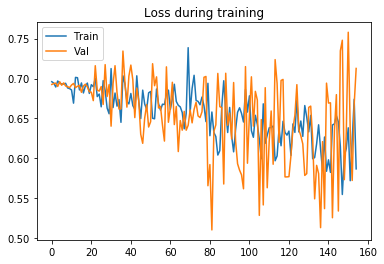

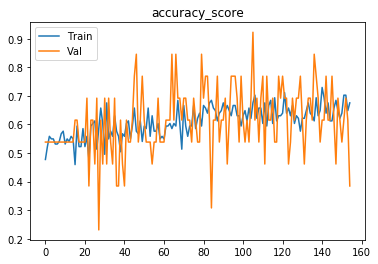

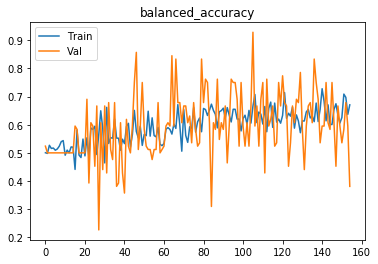

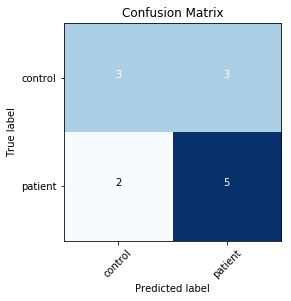

Finished outer fold.
{'final_acc': 0.6904761904761905, 'best_acc': 0.75, 'final_iter': 159, 'best_iter': 126, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.0001}, 'inner_fold_idx': 3}
###### Starting outer fold 6
111
13
Shuffled the data..
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.69586
[0,     4] loss: 0.68881
[0,     6] loss: 0.69460
[0,     8] loss: 0.69547
Time elapsed: 0h:0m:1s
train accuracy_score: 53.15 %
train balanced_accuracy: 50.94 %
val accuracy_score: 15.38 %
val balanced_accuracy: 50.00 %
Val loss: 0.735061
[1,     2] loss: 0.69467
[1,     4] loss: 0.69254
[1,     6] loss: 0.67990
[1,     8] loss: 0.69767
Time elapsed: 0h:0m:3s
train accuracy_score: 52.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 15.38 %
val balanced_accuracy: 50.00 %
Val loss: 0.732641
[2,     2] loss: 0.69189
[2,     4] loss: 0.69700
[2,     6] loss: 0.69

Time elapsed: 0h:0m:58s
train accuracy_score: 59.46 %
train balanced_accuracy: 58.36 %
val accuracy_score: 30.77 %
val balanced_accuracy: 59.09 %
Val loss: 0.716438
[30,     2] loss: 0.68981
[30,     4] loss: 0.71388
[30,     6] loss: 0.68625
[30,     8] loss: 0.66261
Time elapsed: 0h:1m:0s
train accuracy_score: 54.05 %
train balanced_accuracy: 53.51 %
val accuracy_score: 46.15 %
val balanced_accuracy: 68.18 %
Val loss: 0.692772
[31,     2] loss: 0.68446
[31,     4] loss: 0.66419
[31,     6] loss: 0.69824
[31,     8] loss: 0.69537
Time elapsed: 0h:1m:2s
train accuracy_score: 52.25 %
train balanced_accuracy: 51.79 %
val accuracy_score: 30.77 %
val balanced_accuracy: 18.18 %
Val loss: 0.725669
[32,     2] loss: 0.66048
[32,     4] loss: 0.67880
[32,     6] loss: 0.68474
[32,     8] loss: 0.65986
Time elapsed: 0h:1m:4s
train accuracy_score: 60.36 %
train balanced_accuracy: 59.95 %
val accuracy_score: 30.77 %
val balanced_accuracy: 38.64 %
Val loss: 0.731761
[33,     2] loss: 0.67993
[33, 

[60,     2] loss: 0.65517
[60,     4] loss: 0.68194
[60,     6] loss: 0.68317
[60,     8] loss: 0.67055
Time elapsed: 0h:2m:0s
train accuracy_score: 56.76 %
train balanced_accuracy: 55.94 %
val accuracy_score: 38.46 %
val balanced_accuracy: 63.64 %
Val loss: 0.717265
[61,     2] loss: 0.67559
[61,     4] loss: 0.65144
[61,     6] loss: 0.70663
[61,     8] loss: 0.66446
Time elapsed: 0h:2m:2s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.54 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.73 %
Val loss: 0.714448
[62,     2] loss: 0.65871
[62,     4] loss: 0.63968
[62,     6] loss: 0.68676
[62,     8] loss: 0.72193
Time elapsed: 0h:2m:4s
train accuracy_score: 53.15 %
train balanced_accuracy: 52.73 %
val accuracy_score: 38.46 %
val balanced_accuracy: 43.18 %
Val loss: 0.743683
[63,     2] loss: 0.68407
[63,     4] loss: 0.62744
[63,     6] loss: 0.72953
[63,     8] loss: 0.66689
Time elapsed: 0h:2m:6s
train accuracy_score: 56.76 %
train balanced_accuracy: 56.91 %
val ac

val accuracy_score: 61.54 %
val balanced_accuracy: 36.36 %
Val loss: 0.683068
[91,     2] loss: 0.65906
[91,     4] loss: 0.67844
[91,     6] loss: 0.65919
[91,     8] loss: 0.64994
Time elapsed: 0h:3m:3s
train accuracy_score: 63.06 %
train balanced_accuracy: 63.44 %
val accuracy_score: 76.92 %
val balanced_accuracy: 86.36 %
Val loss: 0.645433
[92,     2] loss: 0.65794
[92,     4] loss: 0.65025
[92,     6] loss: 0.64440
[92,     8] loss: 0.64209
Time elapsed: 0h:3m:5s
train accuracy_score: 61.26 %
train balanced_accuracy: 60.90 %
val accuracy_score: 53.85 %
val balanced_accuracy: 72.73 %
Val loss: 0.698258
[93,     2] loss: 0.65960
[93,     4] loss: 0.68428
[93,     6] loss: 0.66621
[93,     8] loss: 0.65255
Time elapsed: 0h:3m:7s
train accuracy_score: 62.16 %
train balanced_accuracy: 61.68 %
val accuracy_score: 30.77 %
val balanced_accuracy: 18.18 %
Val loss: 0.781934
[94,     2] loss: 0.69228
[94,     4] loss: 0.70833
[94,     6] loss: 0.72296
[94,     8] loss: 0.56088
Time elapsed: 

[121,     2] loss: 0.67556
[121,     4] loss: 0.70987
[121,     6] loss: 0.63736
[121,     8] loss: 0.67898
Time elapsed: 0h:4m:4s
train accuracy_score: 55.86 %
train balanced_accuracy: 56.05 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.27 %
Val loss: 0.676423
[122,     2] loss: 0.68862
[122,     4] loss: 0.63991
[122,     6] loss: 0.57906
[122,     8] loss: 0.72262
Time elapsed: 0h:4m:6s
train accuracy_score: 63.06 %
train balanced_accuracy: 63.68 %
val accuracy_score: 76.92 %
val balanced_accuracy: 65.91 %
Val loss: 0.622692
[123,     2] loss: 0.69474
[123,     4] loss: 0.61413
[123,     6] loss: 0.61684
[123,     8] loss: 0.60989
Time elapsed: 0h:4m:8s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.86 %
val accuracy_score: 46.15 %
val balanced_accuracy: 68.18 %
Val loss: 0.679775
[124,     2] loss: 0.63771
[124,     4] loss: 0.62815
[124,     6] loss: 0.63452
[124,     8] loss: 0.67631
Time elapsed: 0h:4m:10s
train accuracy_score: 62.16 %
train balanced_accurac

Time elapsed: 0h:5m:4s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.20 %
val accuracy_score: 38.46 %
val balanced_accuracy: 43.18 %
Val loss: 0.744616
[152,     2] loss: 0.61351
[152,     4] loss: 0.74387
[152,     6] loss: 0.57305
[152,     8] loss: 0.74785
Time elapsed: 0h:5m:6s
train accuracy_score: 58.56 %
train balanced_accuracy: 59.12 %
val accuracy_score: 61.54 %
val balanced_accuracy: 36.36 %
Val loss: 0.654214
[153,     2] loss: 0.60182
[153,     4] loss: 0.66845
[153,     6] loss: 0.66254
[153,     8] loss: 0.64575
Time elapsed: 0h:5m:8s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.77 %
val accuracy_score: 69.23 %
val balanced_accuracy: 81.82 %
Val loss: 0.646619
[154,     2] loss: 0.67782
[154,     4] loss: 0.55803
[154,     6] loss: 0.65570
[154,     8] loss: 0.58323
Time elapsed: 0h:5m:10s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.32 %
val accuracy_score: 53.85 %
val balanced_accuracy: 72.73 %
Val loss: 0.716993
[155,     2] loss: 

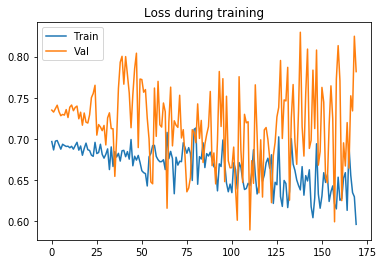

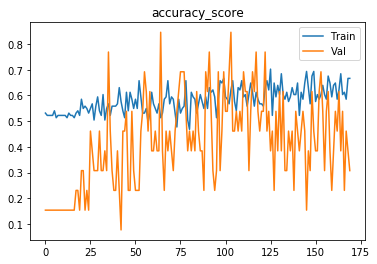

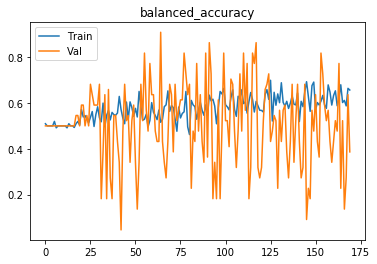

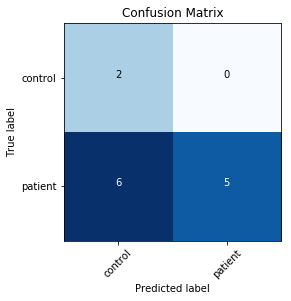

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.69669
[0,     4] loss: 0.68956
[0,     6] loss: 0.68874
[0,     8] loss: 0.69516
Time elapsed: 0h:0m:1s
train accuracy_score: 51.35 %
train balanced_accuracy: 51.82 %
val accuracy_score: 23.08 %
val balanced_accuracy: 54.55 %
Val loss: 0.696868
[1,     2] loss: 0.69201
[1,     4] loss: 0.69586
[1,     6] loss: 0.68879
[1,     8] loss: 0.68081
Time elapsed: 0h:0m:3s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.32 %
val accuracy_score: 23.08 %
val balanced_accuracy: 54.55 %
Val loss: 0.700015
[2,     2] loss: 0.69416
[2,     4] loss: 0.69108
[2,     6] loss: 0.68889
[2,     8] loss: 0.68980
Time elapsed: 0h:0m:5s
train accuracy_score: 51.35 %
train balanced_accuracy: 50.36 %
val accuracy_score: 15.38 %
val balanced_accuracy: 50.00 %
Val loss: 0.707234
[3,     2] loss: 0.68242
[3,     4] loss: 0.69348
[3,     6] loss: 0.68366


Time elapsed: 0h:1m:3s
train accuracy_score: 59.46 %
train balanced_accuracy: 58.77 %
val accuracy_score: 30.77 %
val balanced_accuracy: 38.64 %
Val loss: 0.758387
[31,     2] loss: 0.67268
[31,     4] loss: 0.70109
[31,     6] loss: 0.68703
[31,     8] loss: 0.69954
Time elapsed: 0h:1m:6s
train accuracy_score: 57.66 %
train balanced_accuracy: 56.47 %
val accuracy_score: 23.08 %
val balanced_accuracy: 54.55 %
Val loss: 0.779268
[32,     2] loss: 0.69659
[32,     4] loss: 0.73745
[32,     6] loss: 0.63855
[32,     8] loss: 0.69223
Time elapsed: 0h:1m:8s
train accuracy_score: 58.56 %
train balanced_accuracy: 57.82 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.27 %
Val loss: 0.678796
[33,     2] loss: 0.68002
[33,     4] loss: 0.68711
[33,     6] loss: 0.66362
[33,     8] loss: 0.68389
Time elapsed: 0h:1m:10s
train accuracy_score: 51.35 %
train balanced_accuracy: 50.68 %
val accuracy_score: 30.77 %
val balanced_accuracy: 18.18 %
Val loss: 0.772777
[34,     2] loss: 0.65053
[34, 

[61,     2] loss: 0.66069
[61,     4] loss: 0.65987
[61,     6] loss: 0.67139
[61,     8] loss: 0.65387
Time elapsed: 0h:2m:10s
train accuracy_score: 56.76 %
train balanced_accuracy: 56.34 %
val accuracy_score: 38.46 %
val balanced_accuracy: 63.64 %
Val loss: 0.743094
[62,     2] loss: 0.69432
[62,     4] loss: 0.69018
[62,     6] loss: 0.68550
[62,     8] loss: 0.66918
Time elapsed: 0h:2m:13s
train accuracy_score: 50.45 %
train balanced_accuracy: 49.74 %
val accuracy_score: 30.77 %
val balanced_accuracy: 38.64 %
Val loss: 0.771534
[63,     2] loss: 0.63171
[63,     4] loss: 0.67950
[63,     6] loss: 0.64582
[63,     8] loss: 0.71191
Time elapsed: 0h:2m:15s
train accuracy_score: 60.36 %
train balanced_accuracy: 59.87 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.73 %
Val loss: 0.731445
[64,     2] loss: 0.64985
[64,     4] loss: 0.67111
[64,     6] loss: 0.65442
[64,     8] loss: 0.68190
Time elapsed: 0h:2m:18s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.09 %
va

val accuracy_score: 38.46 %
val balanced_accuracy: 43.18 %
Val loss: 0.673888
[92,     2] loss: 0.74384
[92,     4] loss: 0.61730
[92,     6] loss: 0.66034
[92,     8] loss: 0.63007
Time elapsed: 0h:3m:29s
train accuracy_score: 55.86 %
train balanced_accuracy: 56.13 %
val accuracy_score: 76.92 %
val balanced_accuracy: 65.91 %
Val loss: 0.619468
[93,     2] loss: 0.65761
[93,     4] loss: 0.61938
[93,     6] loss: 0.71112
[93,     8] loss: 0.68301
Time elapsed: 0h:3m:32s
train accuracy_score: 61.26 %
train balanced_accuracy: 60.57 %
val accuracy_score: 30.77 %
val balanced_accuracy: 38.64 %
Val loss: 0.821255
[94,     2] loss: 0.62385
[94,     4] loss: 0.67481
[94,     6] loss: 0.66908
[94,     8] loss: 0.60576
Time elapsed: 0h:3m:36s
train accuracy_score: 60.36 %
train balanced_accuracy: 59.71 %
val accuracy_score: 23.08 %
val balanced_accuracy: 34.09 %
Val loss: 0.832473
[95,     2] loss: 0.57322
[95,     4] loss: 0.66681
[95,     6] loss: 0.71837
[95,     8] loss: 0.62889
Time elapse

[122,     2] loss: 0.59715
[122,     4] loss: 0.68762
[122,     6] loss: 0.66850
[122,     8] loss: 0.68968
Time elapsed: 0h:4m:38s
train accuracy_score: 64.86 %
train balanced_accuracy: 65.65 %
val accuracy_score: 92.31 %
val balanced_accuracy: 75.00 %
Val loss: 0.564725
[123,     2] loss: 0.64188
[123,     4] loss: 0.66608
[123,     6] loss: 0.64321
[123,     8] loss: 0.58825
Time elapsed: 0h:4m:40s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.85 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.27 %
Val loss: 0.721026
[124,     2] loss: 0.64633
[124,     4] loss: 0.63417
[124,     6] loss: 0.67136
[124,     8] loss: 0.67206
Time elapsed: 0h:4m:42s
train accuracy_score: 62.16 %
train balanced_accuracy: 62.09 %
val accuracy_score: 53.85 %
val balanced_accuracy: 72.73 %
Val loss: 0.703392
[125,     2] loss: 0.65781
[125,     4] loss: 0.66360
[125,     6] loss: 0.65156
[125,     8] loss: 0.75934
Time elapsed: 0h:4m:44s
train accuracy_score: 55.86 %
train balanced_accu

Time elapsed: 0h:5m:41s
train accuracy_score: 61.26 %
train balanced_accuracy: 61.22 %
val accuracy_score: 46.15 %
val balanced_accuracy: 27.27 %
Val loss: 0.732110
[153,     2] loss: 0.65876
[153,     4] loss: 0.54371
[153,     6] loss: 0.68819
[153,     8] loss: 0.79389
Time elapsed: 0h:5m:44s
train accuracy_score: 55.86 %
train balanced_accuracy: 56.29 %
val accuracy_score: 46.15 %
val balanced_accuracy: 27.27 %
Val loss: 0.634844
[154,     2] loss: 0.64942
[154,     4] loss: 0.57958
[154,     6] loss: 0.56161
[154,     8] loss: 0.72557
Time elapsed: 0h:5m:46s
train accuracy_score: 63.06 %
train balanced_accuracy: 63.68 %
val accuracy_score: 46.15 %
val balanced_accuracy: 27.27 %
Val loss: 0.680529
[155,     2] loss: 0.58915
[155,     4] loss: 0.64182
[155,     6] loss: 0.65349
[155,     8] loss: 0.58397
Time elapsed: 0h:5m:48s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.78 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.73 %
Val loss: 0.716188
[156,     2] los

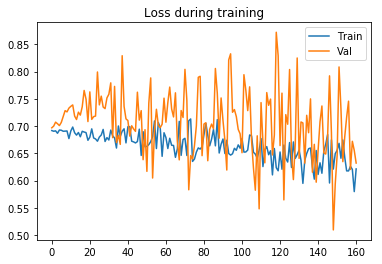

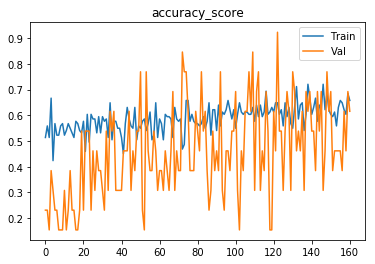

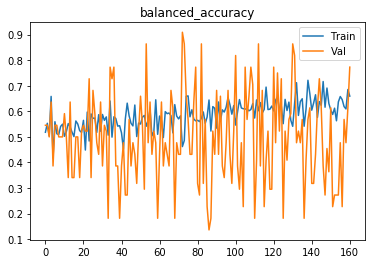

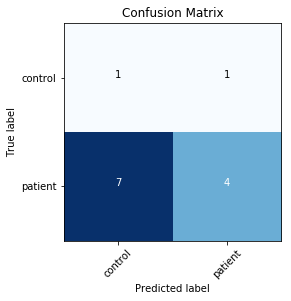

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.69501
Time elapsed: 0h:0m:1s
train accuracy_score: 52.25 %
train balanced_accuracy: 50.16 %
val accuracy_score: 15.38 %
val balanced_accuracy: 50.00 %
Val loss: 0.722436
[1,     2] loss: 0.69084
Time elapsed: 0h:0m:3s
train accuracy_score: 51.35 %
train balanced_accuracy: 49.14 %
val accuracy_score: 15.38 %
val balanced_accuracy: 50.00 %
Val loss: 0.727155
[2,     2] loss: 0.69566
Time elapsed: 0h:0m:5s
train accuracy_score: 53.15 %
train balanced_accuracy: 50.94 %
val accuracy_score: 15.38 %
val balanced_accuracy: 50.00 %
Val loss: 0.727974
[3,     2] loss: 0.69041
Time elapsed: 0h:0m:7s
train accuracy_score: 53.15 %
train balanced_accuracy: 50.94 %
val accuracy_score: 15.38 %
val balanced_accuracy: 50.00 %
Val loss: 0.731458
[4,     2] loss: 0.69290
Time elapsed: 0h:0m:9s
train accuracy_score: 52.25 %
train balanced_accuracy: 50.00 %

val accuracy_score: 15.38 %
val balanced_accuracy: 50.00 %
Val loss: 0.737761
[43,     2] loss: 0.69919
Time elapsed: 0h:1m:31s
train accuracy_score: 48.65 %
train balanced_accuracy: 46.88 %
val accuracy_score: 15.38 %
val balanced_accuracy: 50.00 %
Val loss: 0.734501
[44,     2] loss: 0.68261
Time elapsed: 0h:1m:33s
train accuracy_score: 56.76 %
train balanced_accuracy: 54.96 %
val accuracy_score: 15.38 %
val balanced_accuracy: 50.00 %
Val loss: 0.723466
[45,     2] loss: 0.67630
Time elapsed: 0h:1m:35s
train accuracy_score: 60.36 %
train balanced_accuracy: 58.82 %
val accuracy_score: 15.38 %
val balanced_accuracy: 50.00 %
Val loss: 0.752780
[46,     2] loss: 0.69063
Time elapsed: 0h:1m:37s
train accuracy_score: 53.15 %
train balanced_accuracy: 51.35 %
val accuracy_score: 30.77 %
val balanced_accuracy: 59.09 %
Val loss: 0.711755
[47,     2] loss: 0.67722
Time elapsed: 0h:1m:39s
train accuracy_score: 54.95 %
train balanced_accuracy: 52.99 %
val accuracy_score: 38.46 %
val balanced_accu

val accuracy_score: 53.85 %
val balanced_accuracy: 52.27 %
Val loss: 0.730595
[86,     2] loss: 0.65587
Time elapsed: 0h:3m:3s
train accuracy_score: 60.36 %
train balanced_accuracy: 59.71 %
val accuracy_score: 46.15 %
val balanced_accuracy: 27.27 %
Val loss: 0.676538
[87,     2] loss: 0.69819
Time elapsed: 0h:3m:5s
train accuracy_score: 53.15 %
train balanced_accuracy: 53.46 %
val accuracy_score: 84.62 %
val balanced_accuracy: 70.45 %
Val loss: 0.615528
[88,     2] loss: 0.66720
Time elapsed: 0h:3m:7s
train accuracy_score: 59.46 %
train balanced_accuracy: 60.47 %
val accuracy_score: 61.54 %
val balanced_accuracy: 56.82 %
Val loss: 0.684815
[89,     2] loss: 0.66377
Time elapsed: 0h:3m:10s
train accuracy_score: 62.16 %
train balanced_accuracy: 62.82 %
val accuracy_score: 61.54 %
val balanced_accuracy: 77.27 %
Val loss: 0.684514
[90,     2] loss: 0.69309
Time elapsed: 0h:3m:12s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.21 %
val accuracy_score: 30.77 %
val balanced_accurac

val accuracy_score: 69.23 %
val balanced_accuracy: 61.36 %
Val loss: 0.636042
[129,     2] loss: 0.62260
Time elapsed: 0h:4m:33s
train accuracy_score: 62.16 %
train balanced_accuracy: 62.49 %
val accuracy_score: 69.23 %
val balanced_accuracy: 81.82 %
Val loss: 0.631212
[130,     2] loss: 0.64721
Time elapsed: 0h:4m:35s
train accuracy_score: 51.35 %
train balanced_accuracy: 50.60 %
val accuracy_score: 38.46 %
val balanced_accuracy: 63.64 %
Val loss: 0.755712
[131,     2] loss: 0.65050
Time elapsed: 0h:4m:37s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.32 %
val accuracy_score: 46.15 %
val balanced_accuracy: 68.18 %
Val loss: 0.732800
[132,     2] loss: 0.62666
Time elapsed: 0h:4m:39s
train accuracy_score: 63.06 %
train balanced_accuracy: 63.11 %
val accuracy_score: 46.15 %
val balanced_accuracy: 27.27 %
Val loss: 0.665242
[133,     2] loss: 0.67295
Time elapsed: 0h:4m:41s
train accuracy_score: 56.76 %
train balanced_accuracy: 56.51 %
val accuracy_score: 61.54 %
val balanced

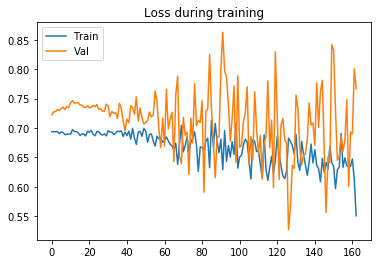

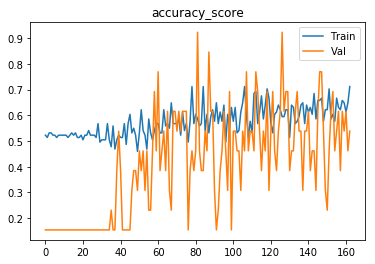

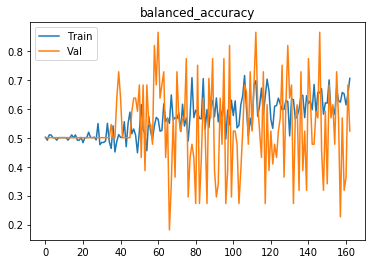

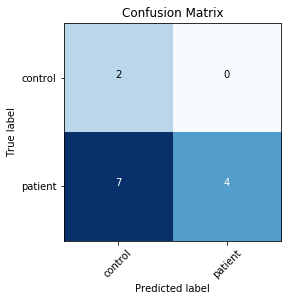

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 12, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.69193
Time elapsed: 0h:0m:1s
train accuracy_score: 50.45 %
train balanced_accuracy: 51.20 %
val accuracy_score: 84.62 %
val balanced_accuracy: 50.00 %
Val loss: 0.680017
[1,     2] loss: 0.69197
Time elapsed: 0h:0m:3s
train accuracy_score: 50.45 %
train balanced_accuracy: 51.37 %
val accuracy_score: 38.46 %
val balanced_accuracy: 22.73 %
Val loss: 0.692833
[2,     2] loss: 0.69194
Time elapsed: 0h:0m:5s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.32 %
val accuracy_score: 15.38 %
val balanced_accuracy: 50.00 %
Val loss: 0.706220
[3,     2] loss: 0.69034
Time elapsed: 0h:0m:7s
train accuracy_score: 50.45 %
train balanced_accuracy: 48.52 %
val accuracy_score: 15.38 %
val balanced_accuracy: 50.00 %
Val loss: 0.717951
[4,     2] loss: 0.69495
Time elapsed: 0h:0m:9s
train accuracy_score: 53.15 %
train balanced_accuracy: 51.11 %

val accuracy_score: 38.46 %
val balanced_accuracy: 43.18 %
Val loss: 0.726064
[43,     2] loss: 0.69802
Time elapsed: 0h:1m:30s
train accuracy_score: 52.25 %
train balanced_accuracy: 51.38 %
val accuracy_score: 23.08 %
val balanced_accuracy: 34.09 %
Val loss: 0.728729
[44,     2] loss: 0.68091
Time elapsed: 0h:1m:32s
train accuracy_score: 52.25 %
train balanced_accuracy: 51.55 %
val accuracy_score: 23.08 %
val balanced_accuracy: 34.09 %
Val loss: 0.768539
[45,     2] loss: 0.66020
Time elapsed: 0h:1m:34s
train accuracy_score: 62.16 %
train balanced_accuracy: 61.19 %
val accuracy_score: 46.15 %
val balanced_accuracy: 27.27 %
Val loss: 0.714886
[46,     2] loss: 0.66886
Time elapsed: 0h:1m:36s
train accuracy_score: 59.46 %
train balanced_accuracy: 58.85 %
val accuracy_score: 30.77 %
val balanced_accuracy: 59.09 %
Val loss: 0.723170
[47,     2] loss: 0.67681
Time elapsed: 0h:1m:38s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.46 %
val accuracy_score: 38.46 %
val balanced_accu

val accuracy_score: 76.92 %
val balanced_accuracy: 65.91 %
Val loss: 0.667417
[86,     2] loss: 0.66042
Time elapsed: 0h:3m:0s
train accuracy_score: 65.77 %
train balanced_accuracy: 66.02 %
val accuracy_score: 53.85 %
val balanced_accuracy: 31.82 %
Val loss: 0.746907
[87,     2] loss: 0.64582
Time elapsed: 0h:3m:2s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.12 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.27 %
Val loss: 0.789255
[88,     2] loss: 0.63111
Time elapsed: 0h:3m:4s
train accuracy_score: 56.76 %
train balanced_accuracy: 56.02 %
val accuracy_score: 61.54 %
val balanced_accuracy: 36.36 %
Val loss: 0.657609
[89,     2] loss: 0.66091
Time elapsed: 0h:3m:6s
train accuracy_score: 61.26 %
train balanced_accuracy: 61.47 %
val accuracy_score: 53.85 %
val balanced_accuracy: 72.73 %
Val loss: 0.677601
[90,     2] loss: 0.67771
Time elapsed: 0h:3m:8s
train accuracy_score: 61.26 %
train balanced_accuracy: 61.55 %
val accuracy_score: 53.85 %
val balanced_accuracy:

val accuracy_score: 69.23 %
val balanced_accuracy: 61.36 %
Val loss: 0.644965
[129,     2] loss: 0.60285
Time elapsed: 0h:4m:29s
train accuracy_score: 72.97 %
train balanced_accuracy: 73.00 %
val accuracy_score: 30.77 %
val balanced_accuracy: 18.18 %
Val loss: 0.728362
[130,     2] loss: 0.63385
Time elapsed: 0h:4m:31s
train accuracy_score: 67.57 %
train balanced_accuracy: 66.93 %
val accuracy_score: 46.15 %
val balanced_accuracy: 68.18 %
Val loss: 0.787391
[131,     2] loss: 0.57925
Time elapsed: 0h:4m:33s
train accuracy_score: 71.17 %
train balanced_accuracy: 70.71 %
val accuracy_score: 53.85 %
val balanced_accuracy: 31.82 %
Val loss: 0.672532
[132,     2] loss: 0.63894
Time elapsed: 0h:4m:35s
train accuracy_score: 67.57 %
train balanced_accuracy: 67.66 %
val accuracy_score: 76.92 %
val balanced_accuracy: 45.45 %
Val loss: 0.606715
[133,     2] loss: 0.60903
Time elapsed: 0h:4m:38s
train accuracy_score: 63.06 %
train balanced_accuracy: 63.84 %
val accuracy_score: 69.23 %
val balanced

val accuracy_score: 61.54 %
val balanced_accuracy: 77.27 %
Val loss: 0.752495
[172,     2] loss: 0.58234
Time elapsed: 0h:5m:59s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.18 %
val accuracy_score: 61.54 %
val balanced_accuracy: 36.36 %
Val loss: 0.734735
[173,     2] loss: 0.57705
Time elapsed: 0h:6m:1s
train accuracy_score: 71.17 %
train balanced_accuracy: 70.87 %
val accuracy_score: 53.85 %
val balanced_accuracy: 31.82 %
Val loss: 0.695838
[174,     2] loss: 0.58242
Time elapsed: 0h:6m:3s
train accuracy_score: 72.07 %
train balanced_accuracy: 71.97 %
val accuracy_score: 23.08 %
val balanced_accuracy: 13.64 %
Val loss: 0.858066
Early stopping in epoch 175
Total time elapsed: 0h:6m:4s
Writing model to disk...
Best result during training: 0.77. Saving model..
Finished inner fold.


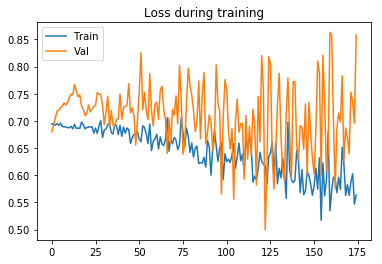

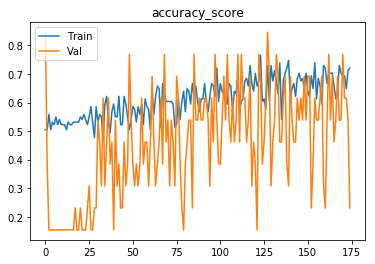

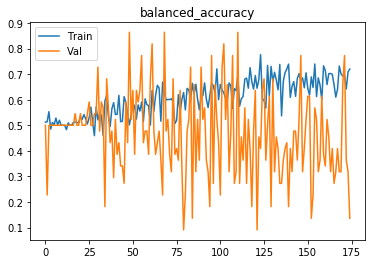

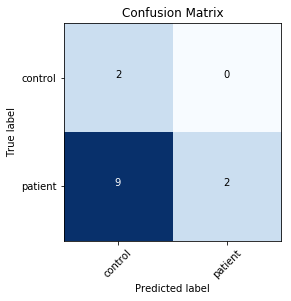

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.69551
[0,     4] loss: 0.69538
[0,     6] loss: 0.69255
Time elapsed: 0h:0m:1s
train accuracy_score: 48.65 %
train balanced_accuracy: 50.54 %
val accuracy_score: 84.62 %
val balanced_accuracy: 50.00 %
Val loss: 0.683624
[1,     2] loss: 0.69514
[1,     4] loss: 0.70041
[1,     6] loss: 0.69087
Time elapsed: 0h:0m:3s
train accuracy_score: 45.05 %
train balanced_accuracy: 45.30 %
val accuracy_score: 15.38 %
val balanced_accuracy: 50.00 %
Val loss: 0.701234
[2,     2] loss: 0.69412
[2,     4] loss: 0.69042
[2,     6] loss: 0.69227
Time elapsed: 0h:0m:5s
train accuracy_score: 50.45 %
train balanced_accuracy: 49.41 %
val accuracy_score: 23.08 %
val balanced_accuracy: 54.55 %
Val loss: 0.702179
[3,     2] loss: 0.69237
[3,     4] loss: 0.68812
[3,     6] loss: 0.69114
Time elapsed: 0h:0m:7s
train accuracy_score: 52.25 %
train balanced_accura

val accuracy_score: 69.23 %
val balanced_accuracy: 81.82 %
Val loss: 0.653545
[34,     2] loss: 0.67758
[34,     4] loss: 0.66675
[34,     6] loss: 0.69333
Time elapsed: 0h:1m:12s
train accuracy_score: 53.15 %
train balanced_accuracy: 52.57 %
val accuracy_score: 15.38 %
val balanced_accuracy: 29.55 %
Val loss: 0.891163
[35,     2] loss: 0.67725
[35,     4] loss: 0.65627
[35,     6] loss: 0.67880
Time elapsed: 0h:1m:14s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.05 %
val accuracy_score: 46.15 %
val balanced_accuracy: 27.27 %
Val loss: 0.701892
[36,     2] loss: 0.70544
[36,     4] loss: 0.66242
[36,     6] loss: 0.67494
Time elapsed: 0h:1m:16s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.74 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.73 %
Val loss: 0.687763
[37,     2] loss: 0.63616
[37,     4] loss: 0.69345
[37,     6] loss: 0.66596
Time elapsed: 0h:1m:18s
train accuracy_score: 61.26 %
train balanced_accuracy: 60.82 %
val accuracy_score: 38.46 %


val accuracy_score: 46.15 %
val balanced_accuracy: 68.18 %
Val loss: 0.688971
[68,     2] loss: 0.62629
[68,     4] loss: 0.61523
[68,     6] loss: 0.68496
Time elapsed: 0h:2m:23s
train accuracy_score: 64.86 %
train balanced_accuracy: 65.08 %
val accuracy_score: 53.85 %
val balanced_accuracy: 31.82 %
Val loss: 0.703487
[69,     2] loss: 0.61669
[69,     4] loss: 0.70372
[69,     6] loss: 0.70971
Time elapsed: 0h:2m:25s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.53 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.27 %
Val loss: 0.640143
[70,     2] loss: 0.68193
[70,     4] loss: 0.63945
[70,     6] loss: 0.71526
Time elapsed: 0h:2m:27s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.97 %
val accuracy_score: 61.54 %
val balanced_accuracy: 77.27 %
Val loss: 0.618711
[71,     2] loss: 0.63523
[71,     4] loss: 0.64040
[71,     6] loss: 0.64272
Time elapsed: 0h:2m:29s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.94 %
val accuracy_score: 61.54 %


val accuracy_score: 38.46 %
val balanced_accuracy: 22.73 %
Val loss: 0.758334
[102,     2] loss: 0.60988
[102,     4] loss: 0.59106
[102,     6] loss: 0.59601
Time elapsed: 0h:3m:33s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.81 %
val accuracy_score: 84.62 %
val balanced_accuracy: 70.45 %
Val loss: 0.520213
[103,     2] loss: 0.60058
[103,     4] loss: 0.61618
[103,     6] loss: 0.62874
Time elapsed: 0h:3m:35s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.72 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.27 %
Val loss: 0.679226
[104,     2] loss: 0.63589
[104,     4] loss: 0.55412
[104,     6] loss: 0.57588
Time elapsed: 0h:3m:37s
train accuracy_score: 72.97 %
train balanced_accuracy: 72.84 %
val accuracy_score: 46.15 %
val balanced_accuracy: 27.27 %
Val loss: 0.715221
[105,     2] loss: 0.58898
[105,     4] loss: 0.54034
[105,     6] loss: 0.62304
Time elapsed: 0h:3m:39s
train accuracy_score: 70.27 %
train balanced_accuracy: 70.33 %
val accuracy_sco

Time elapsed: 0h:4m:41s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.92 %
val accuracy_score: 61.54 %
val balanced_accuracy: 36.36 %
Val loss: 0.641990
[136,     2] loss: 0.57153
[136,     4] loss: 0.60734
[136,     6] loss: 0.64490
Time elapsed: 0h:4m:43s
train accuracy_score: 73.87 %
train balanced_accuracy: 74.11 %
val accuracy_score: 46.15 %
val balanced_accuracy: 27.27 %
Val loss: 0.709884
[137,     2] loss: 0.66343
[137,     4] loss: 0.54891
[137,     6] loss: 0.54417
Time elapsed: 0h:4m:45s
train accuracy_score: 67.57 %
train balanced_accuracy: 67.50 %
val accuracy_score: 61.54 %
val balanced_accuracy: 56.82 %
Val loss: 0.622042
[138,     2] loss: 0.55024
[138,     4] loss: 0.64956
[138,     6] loss: 0.54977
Time elapsed: 0h:4m:47s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.37 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.27 %
Val loss: 0.645566
[139,     2] loss: 0.56503
[139,     4] loss: 0.51580
[139,     6] loss: 0.67153
Time elapsed: 0h

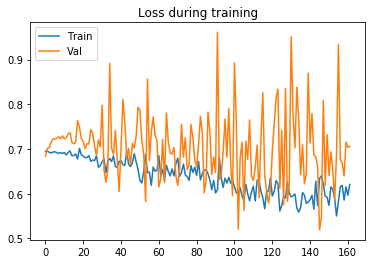

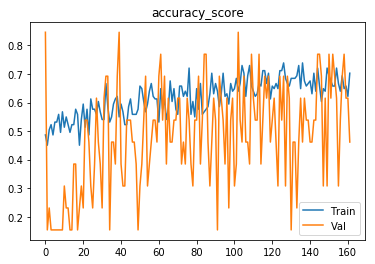

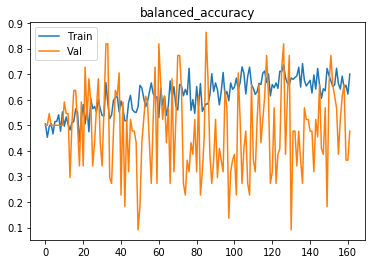

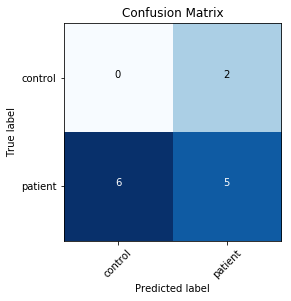

Finished outer fold.
{'final_acc': 0.7727272727272727, 'best_acc': 0.7727272727272727, 'final_iter': 161, 'best_iter': 73, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 5e-05}, 'inner_fold_idx': 1}
###### Starting outer fold 7
111
13
Shuffled the data..
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.69366
[0,     4] loss: 0.69432
[0,     6] loss: 0.68138
Time elapsed: 0h:0m:1s
train accuracy_score: 50.45 %
train balanced_accuracy: 48.36 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.697815
[1,     2] loss: 0.68909
[1,     4] loss: 0.68065
[1,     6] loss: 0.70426
Time elapsed: 0h:0m:3s
train accuracy_score: 54.05 %
train balanced_accuracy: 52.13 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.694808
[2,     2] loss: 0.69006
[2,     4] loss: 0.70375
[2,     6] loss: 0.68943
Time elapsed: 0h:0m:5s
train accu

Time elapsed: 0h:1m:6s
train accuracy_score: 67.57 %
train balanced_accuracy: 66.44 %
val accuracy_score: 53.85 %
val balanced_accuracy: 57.14 %
Val loss: 0.737499
[33,     2] loss: 0.64979
[33,     4] loss: 0.69099
[33,     6] loss: 0.65760
Time elapsed: 0h:1m:8s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.29 %
val accuracy_score: 69.23 %
val balanced_accuracy: 71.43 %
Val loss: 0.650806
[34,     2] loss: 0.64677
[34,     4] loss: 0.69229
[34,     6] loss: 0.67693
Time elapsed: 0h:1m:11s
train accuracy_score: 59.46 %
train balanced_accuracy: 58.93 %
val accuracy_score: 61.54 %
val balanced_accuracy: 64.29 %
Val loss: 0.661111
[35,     2] loss: 0.62135
[35,     4] loss: 0.67782
[35,     6] loss: 0.68756
Time elapsed: 0h:1m:13s
train accuracy_score: 61.26 %
train balanced_accuracy: 61.30 %
val accuracy_score: 46.15 %
val balanced_accuracy: 48.81 %
Val loss: 0.724499
[36,     2] loss: 0.57969
[36,     4] loss: 0.71260
[36,     6] loss: 0.61479
Time elapsed: 0h:1m:15s
train 

Time elapsed: 0h:2m:15s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.00 %
val accuracy_score: 53.85 %
val balanced_accuracy: 54.76 %
Val loss: 0.727583
[67,     2] loss: 0.61392
[67,     4] loss: 0.67534
[67,     6] loss: 0.61761
Time elapsed: 0h:2m:17s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.35 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.551035
[68,     2] loss: 0.64244
[68,     4] loss: 0.62699
[68,     6] loss: 0.65659
Time elapsed: 0h:2m:19s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.59 %
val accuracy_score: 53.85 %
val balanced_accuracy: 54.76 %
Val loss: 0.709821
[69,     2] loss: 0.60842
[69,     4] loss: 0.71216
[69,     6] loss: 0.63983
Time elapsed: 0h:2m:21s
train accuracy_score: 59.46 %
train balanced_accuracy: 58.93 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.682103
[70,     2] loss: 0.59478
[70,     4] loss: 0.69070
[70,     6] loss: 0.58009
Time elapsed: 0h:2m:23s
trai

Time elapsed: 0h:3m:24s
train accuracy_score: 69.37 %
train balanced_accuracy: 69.06 %
val accuracy_score: 61.54 %
val balanced_accuracy: 64.29 %
Val loss: 0.761564
[101,     2] loss: 0.54593
[101,     4] loss: 0.54490
[101,     6] loss: 0.60733
Time elapsed: 0h:3m:26s
train accuracy_score: 72.07 %
train balanced_accuracy: 71.57 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.38 %
Val loss: 0.590901
[102,     2] loss: 0.60576
[102,     4] loss: 0.66852
[102,     6] loss: 0.61141
Time elapsed: 0h:3m:28s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.13 %
val accuracy_score: 69.23 %
val balanced_accuracy: 71.43 %
Val loss: 0.662679
[103,     2] loss: 0.65183
[103,     4] loss: 0.60862
[103,     6] loss: 0.70730
Time elapsed: 0h:3m:30s
train accuracy_score: 61.26 %
train balanced_accuracy: 61.06 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.38 %
Val loss: 0.493143
[104,     2] loss: 0.58603
[104,     4] loss: 0.61916
[104,     6] loss: 0.67765
Time elapsed: 0h

val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.718982
[134,     2] loss: 0.59258
[134,     4] loss: 0.60285
[134,     6] loss: 0.57955
Time elapsed: 0h:4m:32s
train accuracy_score: 71.17 %
train balanced_accuracy: 70.71 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.606735
[135,     2] loss: 0.61961
[135,     4] loss: 0.68481
[135,     6] loss: 0.61125
Time elapsed: 0h:4m:35s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.80 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.561867
[136,     2] loss: 0.61682
[136,     4] loss: 0.52623
[136,     6] loss: 0.50026
Time elapsed: 0h:4m:37s
train accuracy_score: 74.77 %
train balanced_accuracy: 74.40 %
val accuracy_score: 61.54 %
val balanced_accuracy: 64.29 %
Val loss: 0.710132
[137,     2] loss: 0.61276
[137,     4] loss: 0.47633
[137,     6] loss: 0.68292
Time elapsed: 0h:4m:39s
train accuracy_score: 71.17 %
train balanced_accuracy: 70.22 %
val accuracy_sco

Time elapsed: 0h:5m:41s
train accuracy_score: 78.38 %
train balanced_accuracy: 78.09 %
val accuracy_score: 69.23 %
val balanced_accuracy: 71.43 %
Val loss: 0.544117
[168,     2] loss: 0.48746
[168,     4] loss: 0.58098
[168,     6] loss: 0.75234
Time elapsed: 0h:5m:43s
train accuracy_score: 71.17 %
train balanced_accuracy: 71.19 %
val accuracy_score: 46.15 %
val balanced_accuracy: 48.81 %
Val loss: 0.735258
[169,     2] loss: 0.56795
[169,     4] loss: 0.49898
[169,     6] loss: 0.52501
Time elapsed: 0h:5m:45s
train accuracy_score: 74.77 %
train balanced_accuracy: 74.40 %
val accuracy_score: 69.23 %
val balanced_accuracy: 71.43 %
Val loss: 0.588148
[170,     2] loss: 0.52527
[170,     4] loss: 0.58307
[170,     6] loss: 0.53503
Time elapsed: 0h:5m:47s
train accuracy_score: 74.77 %
train balanced_accuracy: 74.15 %
val accuracy_score: 76.92 %
val balanced_accuracy: 78.57 %
Val loss: 0.537699
[171,     2] loss: 0.62253
[171,     4] loss: 0.50002
[171,     6] loss: 0.65396
Time elapsed: 0h

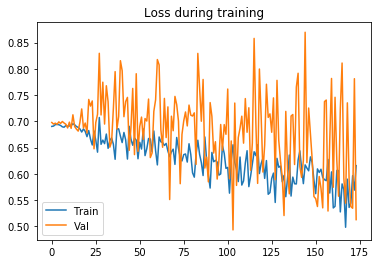

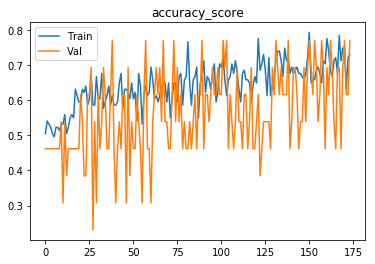

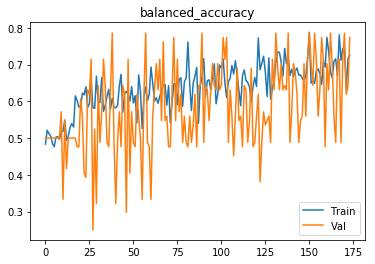

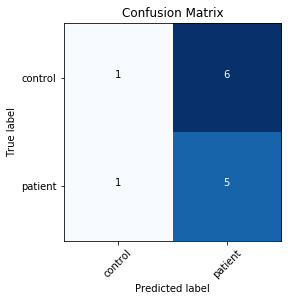

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.68478
[0,     4] loss: 0.68534
[0,     6] loss: 0.70145
[0,     8] loss: 0.70077
Time elapsed: 0h:0m:1s
train accuracy_score: 52.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.698031
[1,     2] loss: 0.69833
[1,     4] loss: 0.71460
[1,     6] loss: 0.68508
[1,     8] loss: 0.67341
Time elapsed: 0h:0m:3s
train accuracy_score: 54.95 %
train balanced_accuracy: 52.91 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.694437
[2,     2] loss: 0.68408
[2,     4] loss: 0.68231
[2,     6] loss: 0.69080
[2,     8] loss: 0.69271
Time elapsed: 0h:0m:5s
train accuracy_score: 54.95 %
train balanced_accuracy: 53.16 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.698901
[3,     2] loss: 0.69973
[3,     4] loss: 0.69302
[3,     6] loss: 0.68431


Time elapsed: 0h:1m:2s
train accuracy_score: 54.95 %
train balanced_accuracy: 53.40 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.62 %
Val loss: 0.679265
[31,     2] loss: 0.66368
[31,     4] loss: 0.68872
[31,     6] loss: 0.67026
[31,     8] loss: 0.70041
Time elapsed: 0h:1m:4s
train accuracy_score: 63.06 %
train balanced_accuracy: 62.54 %
val accuracy_score: 30.77 %
val balanced_accuracy: 30.95 %
Val loss: 0.707339
[32,     2] loss: 0.70149
[32,     4] loss: 0.68374
[32,     6] loss: 0.70626
[32,     8] loss: 0.70097
Time elapsed: 0h:1m:6s
train accuracy_score: 45.95 %
train balanced_accuracy: 45.43 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.701625
[33,     2] loss: 0.66368
[33,     4] loss: 0.66861
[33,     6] loss: 0.70245
[33,     8] loss: 0.67083
Time elapsed: 0h:1m:8s
train accuracy_score: 62.16 %
train balanced_accuracy: 61.27 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.62 %
Val loss: 0.705960
[34,     2] loss: 0.69226
[34,  

[61,     2] loss: 0.70080
[61,     4] loss: 0.69229
[61,     6] loss: 0.65842
[61,     8] loss: 0.66361
Time elapsed: 0h:2m:6s
train accuracy_score: 53.15 %
train balanced_accuracy: 52.98 %
val accuracy_score: 30.77 %
val balanced_accuracy: 32.14 %
Val loss: 0.724450
[62,     2] loss: 0.69947
[62,     4] loss: 0.68527
[62,     6] loss: 0.70477
[62,     8] loss: 0.66536
Time elapsed: 0h:2m:8s
train accuracy_score: 51.35 %
train balanced_accuracy: 51.42 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.715598
[63,     2] loss: 0.68747
[63,     4] loss: 0.65351
[63,     6] loss: 0.66591
[63,     8] loss: 0.67761
Time elapsed: 0h:2m:10s
train accuracy_score: 52.25 %
train balanced_accuracy: 52.20 %
val accuracy_score: 53.85 %
val balanced_accuracy: 54.76 %
Val loss: 0.679955
[64,     2] loss: 0.63559
[64,     4] loss: 0.66930
[64,     6] loss: 0.66397
[64,     8] loss: 0.66958
Time elapsed: 0h:2m:12s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.83 %
val 

val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.637970
[92,     2] loss: 0.66042
[92,     4] loss: 0.65318
[92,     6] loss: 0.61273
[92,     8] loss: 0.70293
Time elapsed: 0h:3m:10s
train accuracy_score: 56.76 %
train balanced_accuracy: 55.86 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.643920
[93,     2] loss: 0.66408
[93,     4] loss: 0.70559
[93,     6] loss: 0.69205
[93,     8] loss: 0.59470
Time elapsed: 0h:3m:12s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.48 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.38 %
Val loss: 0.658838
[94,     2] loss: 0.62773
[94,     4] loss: 0.67767
[94,     6] loss: 0.62833
[94,     8] loss: 0.66557
Time elapsed: 0h:3m:14s
train accuracy_score: 62.16 %
train balanced_accuracy: 62.17 %
val accuracy_score: 61.54 %
val balanced_accuracy: 64.29 %
Val loss: 0.695938
[95,     2] loss: 0.63189
[95,     4] loss: 0.66120
[95,     6] loss: 0.67572
[95,     8] loss: 0.65775
Time elapse

[122,     2] loss: 0.69294
[122,     4] loss: 0.72782
[122,     6] loss: 0.65593
[122,     8] loss: 0.65354
Time elapsed: 0h:4m:10s
train accuracy_score: 56.76 %
train balanced_accuracy: 56.10 %
val accuracy_score: 53.85 %
val balanced_accuracy: 57.14 %
Val loss: 0.674697
[123,     2] loss: 0.61819
[123,     4] loss: 0.66164
[123,     6] loss: 0.60607
[123,     8] loss: 0.65503
Time elapsed: 0h:4m:13s
train accuracy_score: 65.77 %
train balanced_accuracy: 64.72 %
val accuracy_score: 53.85 %
val balanced_accuracy: 57.14 %
Val loss: 0.724133
[124,     2] loss: 0.63450
[124,     4] loss: 0.62850
[124,     6] loss: 0.60355
[124,     8] loss: 0.66476
Time elapsed: 0h:4m:15s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.15 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.639478
[125,     2] loss: 0.62971
[125,     4] loss: 0.70521
[125,     6] loss: 0.63534
[125,     8] loss: 0.67814
Time elapsed: 0h:4m:17s
train accuracy_score: 61.26 %
train balanced_accu

Time elapsed: 0h:5m:14s
train accuracy_score: 63.06 %
train balanced_accuracy: 62.62 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.62 %
Val loss: 0.634928
[153,     2] loss: 0.68551
[153,     4] loss: 0.71553
[153,     6] loss: 0.67763
[153,     8] loss: 0.73702
Time elapsed: 0h:5m:16s
train accuracy_score: 52.25 %
train balanced_accuracy: 51.87 %
val accuracy_score: 46.15 %
val balanced_accuracy: 48.81 %
Val loss: 0.723290
[154,     2] loss: 0.62234
[154,     4] loss: 0.70569
[154,     6] loss: 0.64411
[154,     8] loss: 0.66055
Time elapsed: 0h:5m:18s
train accuracy_score: 59.46 %
train balanced_accuracy: 58.52 %
val accuracy_score: 38.46 %
val balanced_accuracy: 39.29 %
Val loss: 0.776885
[155,     2] loss: 0.62293
[155,     4] loss: 0.55646
[155,     6] loss: 0.67695
[155,     8] loss: 0.64872
Time elapsed: 0h:5m:21s
train accuracy_score: 62.16 %
train balanced_accuracy: 62.17 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.661781
[156,     2] los

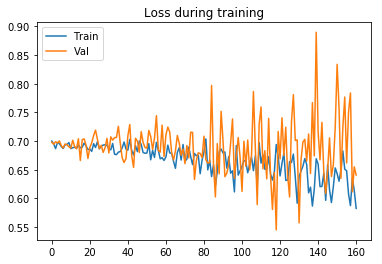

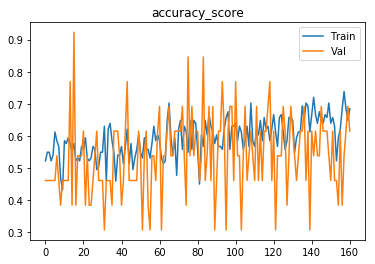

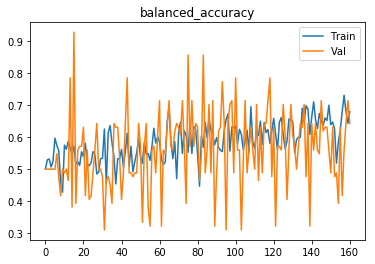

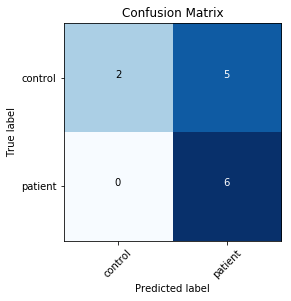

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.70959
[0,     4] loss: 0.69680
[0,     6] loss: 0.68751
Time elapsed: 0h:0m:1s
train accuracy_score: 47.75 %
train balanced_accuracy: 50.00 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.690102
[1,     2] loss: 0.69878
[1,     4] loss: 0.69589
[1,     6] loss: 0.69653
Time elapsed: 0h:0m:3s
train accuracy_score: 47.75 %
train balanced_accuracy: 50.00 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.691014
[2,     2] loss: 0.69860
[2,     4] loss: 0.70186
[2,     6] loss: 0.70013
Time elapsed: 0h:0m:5s
train accuracy_score: 47.75 %
train balanced_accuracy: 50.00 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.690743
[3,     2] loss: 0.70093
[3,     4] loss: 0.68717
[3,     6] loss: 0.69622
Time elapsed: 0h:0m:7s
train accuracy_score: 48.65 %
train balanced_accurac

val accuracy_score: 53.85 %
val balanced_accuracy: 54.76 %
Val loss: 0.691848
[34,     2] loss: 0.67850
[34,     4] loss: 0.69304
[34,     6] loss: 0.68878
Time elapsed: 0h:1m:9s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.50 %
val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.684917
[35,     2] loss: 0.68384
[35,     4] loss: 0.68582
[35,     6] loss: 0.66773
Time elapsed: 0h:1m:11s
train accuracy_score: 63.06 %
train balanced_accuracy: 62.87 %
val accuracy_score: 30.77 %
val balanced_accuracy: 32.14 %
Val loss: 0.724764
[36,     2] loss: 0.68370
[36,     4] loss: 0.67379
[36,     6] loss: 0.68506
Time elapsed: 0h:1m:13s
train accuracy_score: 60.36 %
train balanced_accuracy: 59.79 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.681347
[37,     2] loss: 0.68439
[37,     4] loss: 0.66880
[37,     6] loss: 0.68634
Time elapsed: 0h:1m:15s
train accuracy_score: 59.46 %
train balanced_accuracy: 58.85 %
val accuracy_score: 46.15 %
v

val accuracy_score: 38.46 %
val balanced_accuracy: 41.67 %
Val loss: 0.716510
[68,     2] loss: 0.66176
[68,     4] loss: 0.66740
[68,     6] loss: 0.68287
Time elapsed: 0h:2m:18s
train accuracy_score: 59.46 %
train balanced_accuracy: 58.60 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.683621
[69,     2] loss: 0.65379
[69,     4] loss: 0.68383
[69,     6] loss: 0.68612
Time elapsed: 0h:2m:20s
train accuracy_score: 60.36 %
train balanced_accuracy: 59.95 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.683675
[70,     2] loss: 0.65753
[70,     4] loss: 0.65789
[70,     6] loss: 0.69323
Time elapsed: 0h:2m:22s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.37 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.669858
[71,     2] loss: 0.67856
[71,     4] loss: 0.69367
[71,     6] loss: 0.65700
Time elapsed: 0h:2m:24s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.77 %
val accuracy_score: 69.23 %


val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.704269
[102,     2] loss: 0.69357
[102,     4] loss: 0.68779
[102,     6] loss: 0.69664
Time elapsed: 0h:3m:26s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.70 %
val accuracy_score: 53.85 %
val balanced_accuracy: 57.14 %
Val loss: 0.665491
[103,     2] loss: 0.65808
[103,     4] loss: 0.64834
[103,     6] loss: 0.70618
Time elapsed: 0h:3m:28s
train accuracy_score: 61.26 %
train balanced_accuracy: 60.57 %
val accuracy_score: 61.54 %
val balanced_accuracy: 64.29 %
Val loss: 0.666061
[104,     2] loss: 0.63980
[104,     4] loss: 0.64200
[104,     6] loss: 0.66563
Time elapsed: 0h:3m:30s
train accuracy_score: 63.06 %
train balanced_accuracy: 62.46 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.62 %
Val loss: 0.725651
[105,     2] loss: 0.69273
[105,     4] loss: 0.70041
[105,     6] loss: 0.71677
Time elapsed: 0h:3m:32s
train accuracy_score: 47.75 %
train balanced_accuracy: 47.72 %
val accuracy_sco

Time elapsed: 0h:4m:34s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.04 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.606393
[136,     2] loss: 0.58697
[136,     4] loss: 0.57471
[136,     6] loss: 0.69895
Time elapsed: 0h:4m:36s
train accuracy_score: 67.57 %
train balanced_accuracy: 67.18 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.585924
[137,     2] loss: 0.73864
[137,     4] loss: 0.67547
[137,     6] loss: 0.67848
Time elapsed: 0h:4m:38s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.56 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.682242
[138,     2] loss: 0.64302
[138,     4] loss: 0.69276
[138,     6] loss: 0.72875
Time elapsed: 0h:4m:40s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.37 %
val accuracy_score: 61.54 %
val balanced_accuracy: 64.29 %
Val loss: 0.673090
[139,     2] loss: 0.65596
[139,     4] loss: 0.63891
[139,     6] loss: 0.65183
Time elapsed: 0h

val accuracy_score: 76.92 %
val balanced_accuracy: 77.38 %
Val loss: 0.592235
[169,     2] loss: 0.68004
[169,     4] loss: 0.72542
[169,     6] loss: 0.56751
Time elapsed: 0h:5m:42s
train accuracy_score: 63.06 %
train balanced_accuracy: 63.03 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.677623
[170,     2] loss: 0.61637
[170,     4] loss: 0.65856
[170,     6] loss: 0.71006
Time elapsed: 0h:5m:44s
train accuracy_score: 58.56 %
train balanced_accuracy: 57.91 %
val accuracy_score: 38.46 %
val balanced_accuracy: 41.67 %
Val loss: 0.765463
[171,     2] loss: 0.63951
[171,     4] loss: 0.65360
[171,     6] loss: 0.61087
Time elapsed: 0h:5m:46s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.02 %
val accuracy_score: 69.23 %
val balanced_accuracy: 71.43 %
Val loss: 0.664867
[172,     2] loss: 0.64416
[172,     4] loss: 0.60997
[172,     6] loss: 0.59646
Time elapsed: 0h:5m:48s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.29 %
val accuracy_sco

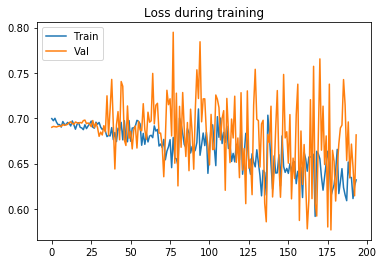

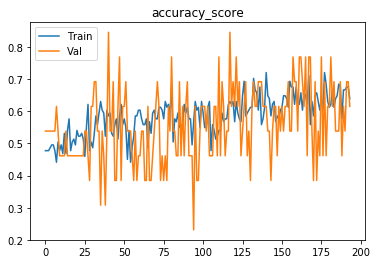

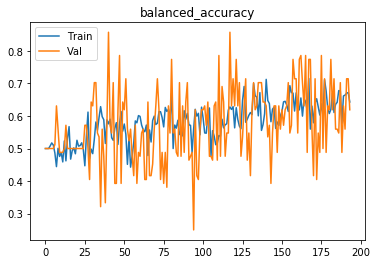

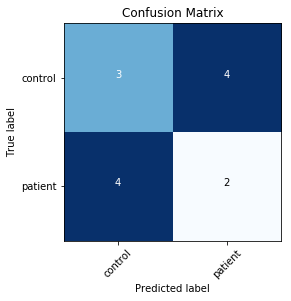

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.69404
Time elapsed: 0h:0m:1s
train accuracy_score: 52.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.697729
[1,     2] loss: 0.69257
Time elapsed: 0h:0m:3s
train accuracy_score: 50.45 %
train balanced_accuracy: 48.28 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.696724
[2,     2] loss: 0.69062
Time elapsed: 0h:0m:5s
train accuracy_score: 51.35 %
train balanced_accuracy: 49.14 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.698872
[3,     2] loss: 0.68978
Time elapsed: 0h:0m:7s
train accuracy_score: 52.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.696487
[4,     2] loss: 0.68993
Time elapsed: 0h:0m:9s
train accuracy_score: 53.15 %
train balanced_accuracy: 50.94 %


val accuracy_score: 38.46 %
val balanced_accuracy: 40.48 %
Val loss: 0.702203
[43,     2] loss: 0.68108
Time elapsed: 0h:1m:29s
train accuracy_score: 57.66 %
train balanced_accuracy: 56.88 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.38 %
Val loss: 0.667084
[44,     2] loss: 0.68849
Time elapsed: 0h:1m:31s
train accuracy_score: 58.56 %
train balanced_accuracy: 57.99 %
val accuracy_score: 61.54 %
val balanced_accuracy: 64.29 %
Val loss: 0.672880
[45,     2] loss: 0.68563
Time elapsed: 0h:1m:34s
train accuracy_score: 53.15 %
train balanced_accuracy: 52.73 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.703578
[46,     2] loss: 0.68190
Time elapsed: 0h:1m:35s
train accuracy_score: 56.76 %
train balanced_accuracy: 56.34 %
val accuracy_score: 38.46 %
val balanced_accuracy: 39.29 %
Val loss: 0.724331
[47,     2] loss: 0.68283
Time elapsed: 0h:1m:38s
train accuracy_score: 59.46 %
train balanced_accuracy: 58.85 %
val accuracy_score: 38.46 %
val balanced_accu

val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.690102
[86,     2] loss: 0.68623
Time elapsed: 0h:2m:58s
train accuracy_score: 52.25 %
train balanced_accuracy: 51.95 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.679537
[87,     2] loss: 0.65978
Time elapsed: 0h:3m:0s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.20 %
val accuracy_score: 53.85 %
val balanced_accuracy: 54.76 %
Val loss: 0.656534
[88,     2] loss: 0.63727
Time elapsed: 0h:3m:2s
train accuracy_score: 62.16 %
train balanced_accuracy: 61.43 %
val accuracy_score: 38.46 %
val balanced_accuracy: 39.29 %
Val loss: 0.700548
[89,     2] loss: 0.63991
Time elapsed: 0h:3m:4s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.13 %
val accuracy_score: 46.15 %
val balanced_accuracy: 48.81 %
Val loss: 0.722626
[90,     2] loss: 0.64974
Time elapsed: 0h:3m:6s
train accuracy_score: 59.46 %
train balanced_accuracy: 58.52 %
val accuracy_score: 53.85 %
val balanced_accuracy

val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.672636
[129,     2] loss: 0.59791
Time elapsed: 0h:4m:26s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.70 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.666395
[130,     2] loss: 0.64332
Time elapsed: 0h:4m:28s
train accuracy_score: 63.96 %
train balanced_accuracy: 64.30 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.758122
[131,     2] loss: 0.65005
Time elapsed: 0h:4m:30s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.01 %
val accuracy_score: 76.92 %
val balanced_accuracy: 78.57 %
Val loss: 0.599769
[132,     2] loss: 0.61382
Time elapsed: 0h:4m:32s
train accuracy_score: 67.57 %
train balanced_accuracy: 67.34 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.658954
[133,     2] loss: 0.62143
Time elapsed: 0h:4m:34s
train accuracy_score: 67.57 %
train balanced_accuracy: 67.34 %
val accuracy_score: 46.15 %
val balanced

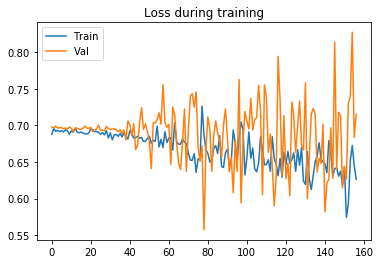

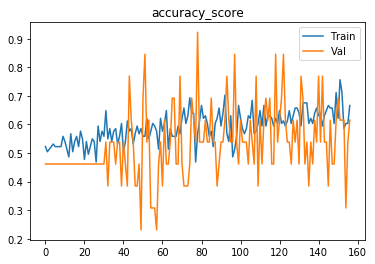

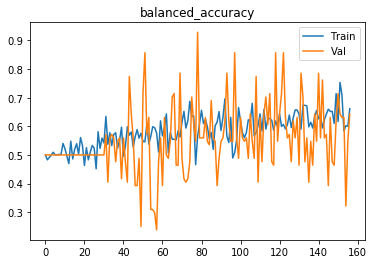

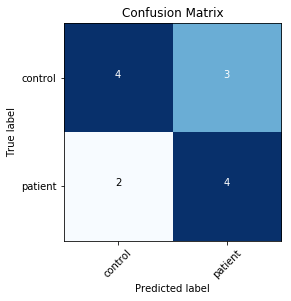

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.69682
[0,     4] loss: 0.69399
[0,     6] loss: 0.69676
Time elapsed: 0h:0m:1s
train accuracy_score: 46.85 %
train balanced_accuracy: 47.19 %
val accuracy_score: 30.77 %
val balanced_accuracy: 33.33 %
Val loss: 0.693835
[1,     2] loss: 0.69024
[1,     4] loss: 0.68688
[1,     6] loss: 0.69423
Time elapsed: 0h:0m:3s
train accuracy_score: 53.15 %
train balanced_accuracy: 52.16 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.695899
[2,     2] loss: 0.69464
[2,     4] loss: 0.69313
[2,     6] loss: 0.69671
Time elapsed: 0h:0m:6s
train accuracy_score: 46.85 %
train balanced_accuracy: 45.88 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.695251
[3,     2] loss: 0.69368
[3,     4] loss: 0.68927
[3,     6] loss: 0.69507
Time elapsed: 0h:0m:8s
train accuracy_score: 50.45 %
train balanced_accurac

val accuracy_score: 46.15 %
val balanced_accuracy: 48.81 %
Val loss: 0.700456
[34,     2] loss: 0.70506
[34,     4] loss: 0.67003
[34,     6] loss: 0.68738
Time elapsed: 0h:1m:11s
train accuracy_score: 51.35 %
train balanced_accuracy: 50.44 %
val accuracy_score: 38.46 %
val balanced_accuracy: 39.29 %
Val loss: 0.677632
[35,     2] loss: 0.67629
[35,     4] loss: 0.68929
[35,     6] loss: 0.69103
Time elapsed: 0h:1m:13s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.40 %
val accuracy_score: 38.46 %
val balanced_accuracy: 40.48 %
Val loss: 0.688202
[36,     2] loss: 0.68154
[36,     4] loss: 0.67394
[36,     6] loss: 0.67252
Time elapsed: 0h:1m:15s
train accuracy_score: 56.76 %
train balanced_accuracy: 56.42 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.683698
[37,     2] loss: 0.65702
[37,     4] loss: 0.70790
[37,     6] loss: 0.67424
Time elapsed: 0h:1m:17s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.78 %
val accuracy_score: 46.15 %


val accuracy_score: 53.85 %
val balanced_accuracy: 54.76 %
Val loss: 0.699945
[68,     2] loss: 0.68351
[68,     4] loss: 0.69407
[68,     6] loss: 0.66206
Time elapsed: 0h:2m:20s
train accuracy_score: 49.55 %
train balanced_accuracy: 49.37 %
val accuracy_score: 30.77 %
val balanced_accuracy: 32.14 %
Val loss: 0.760829
[69,     2] loss: 0.68117
[69,     4] loss: 0.66810
[69,     6] loss: 0.67571
Time elapsed: 0h:2m:22s
train accuracy_score: 54.95 %
train balanced_accuracy: 53.97 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.705183
[70,     2] loss: 0.65854
[70,     4] loss: 0.70164
[70,     6] loss: 0.68684
Time elapsed: 0h:2m:24s
train accuracy_score: 56.76 %
train balanced_accuracy: 55.69 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.656401
[71,     2] loss: 0.62329
[71,     4] loss: 0.63222
[71,     6] loss: 0.64166
Time elapsed: 0h:2m:26s
train accuracy_score: 68.47 %
train balanced_accuracy: 67.71 %
val accuracy_score: 61.54 %


val accuracy_score: 30.77 %
val balanced_accuracy: 33.33 %
Val loss: 0.772535
[102,     2] loss: 0.64777
[102,     4] loss: 0.69043
[102,     6] loss: 0.65799
Time elapsed: 0h:3m:28s
train accuracy_score: 61.26 %
train balanced_accuracy: 60.57 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.663635
[103,     2] loss: 0.71022
[103,     4] loss: 0.63055
[103,     6] loss: 0.64606
Time elapsed: 0h:3m:30s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.64 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.707527
[104,     2] loss: 0.64649
[104,     4] loss: 0.63980
[104,     6] loss: 0.65866
Time elapsed: 0h:3m:33s
train accuracy_score: 63.96 %
train balanced_accuracy: 64.13 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.694616
[105,     2] loss: 0.61788
[105,     4] loss: 0.72440
[105,     6] loss: 0.63277
Time elapsed: 0h:3m:35s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.37 %
val accuracy_sco

Time elapsed: 0h:4m:35s
train accuracy_score: 62.16 %
train balanced_accuracy: 61.60 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.611453
[136,     2] loss: 0.58401
[136,     4] loss: 0.63096
[136,     6] loss: 0.66793
Time elapsed: 0h:4m:37s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.24 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.679425
[137,     2] loss: 0.65669
[137,     4] loss: 0.68637
[137,     6] loss: 0.60466
Time elapsed: 0h:4m:39s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.09 %
val accuracy_score: 53.85 %
val balanced_accuracy: 54.76 %
Val loss: 0.676763
[138,     2] loss: 0.64672
[138,     4] loss: 0.62361
[138,     6] loss: 0.59565
Time elapsed: 0h:4m:41s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.39 %
val accuracy_score: 38.46 %
val balanced_accuracy: 41.67 %
Val loss: 0.760230
[139,     2] loss: 0.61017
[139,     4] loss: 0.71891
[139,     6] loss: 0.64535
Time elapsed: 0h

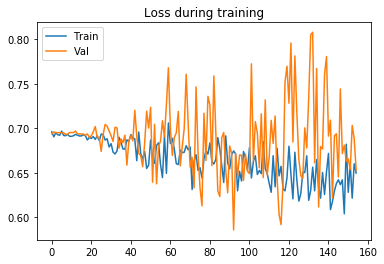

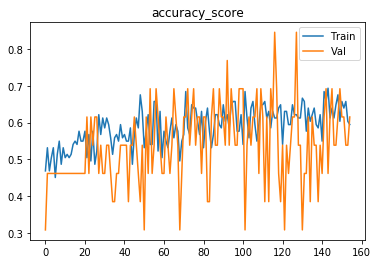

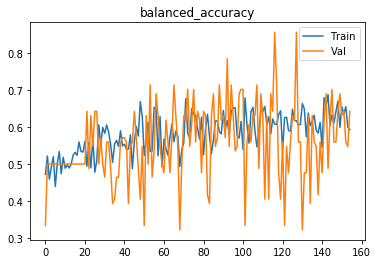

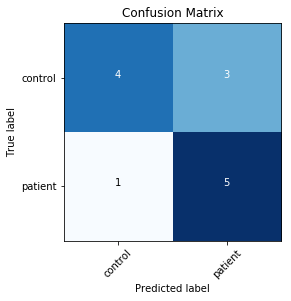

Finished outer fold.
{'final_acc': 0.7738095238095238, 'best_acc': 0.7857142857142857, 'final_iter': 174, 'best_iter': 171, 'params': {'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}, 'inner_fold_idx': 0}
###### Starting outer fold 8
111
13
Shuffled the data..
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.69299
Time elapsed: 0h:0m:1s
train accuracy_score: 49.55 %
train balanced_accuracy: 50.00 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.690995
[1,     2] loss: 0.69408
Time elapsed: 0h:0m:3s
train accuracy_score: 51.35 %
train balanced_accuracy: 51.74 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.693354
[2,     2] loss: 0.69088
Time elapsed: 0h:0m:5s
train accuracy_score: 51.35 %
train balanced_accuracy: 51.67 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.690952
[3,     2] loss: 

[41,     2] loss: 0.68356
Time elapsed: 0h:1m:26s
train accuracy_score: 51.35 %
train balanced_accuracy: 51.38 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.671568
[42,     2] loss: 0.69768
Time elapsed: 0h:1m:28s
train accuracy_score: 48.65 %
train balanced_accuracy: 48.78 %
val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.695105
[43,     2] loss: 0.66948
Time elapsed: 0h:1m:30s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.48 %
val accuracy_score: 53.85 %
val balanced_accuracy: 51.19 %
Val loss: 0.681355
[44,     2] loss: 0.68867
Time elapsed: 0h:1m:32s
train accuracy_score: 54.95 %
train balanced_accuracy: 55.11 %
val accuracy_score: 30.77 %
val balanced_accuracy: 29.76 %
Val loss: 0.731271
[45,     2] loss: 0.67881
Time elapsed: 0h:1m:34s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.75 %
val accuracy_score: 38.46 %
val balanced_accuracy: 38.10 %
Val loss: 0.714927
[46,     2] loss: 0.68960
Time elapsed: 0h:1m

[84,     2] loss: 0.65792
Time elapsed: 0h:2m:58s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.59 %
val accuracy_score: 30.77 %
val balanced_accuracy: 30.95 %
Val loss: 0.734412
[85,     2] loss: 0.67462
Time elapsed: 0h:3m:0s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.31 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.715590
[86,     2] loss: 0.66963
Time elapsed: 0h:3m:2s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.89 %
val accuracy_score: 38.46 %
val balanced_accuracy: 38.10 %
Val loss: 0.700068
[87,     2] loss: 0.67798
Time elapsed: 0h:3m:4s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.86 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.641571
[88,     2] loss: 0.66897
Time elapsed: 0h:3m:7s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.51 %
val accuracy_score: 53.85 %
val balanced_accuracy: 54.76 %
Val loss: 0.677668
[89,     2] loss: 0.63718
Time elapsed: 0h:3m:9s


[127,     2] loss: 0.65514
Time elapsed: 0h:4m:27s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.58 %
val accuracy_score: 38.46 %
val balanced_accuracy: 36.90 %
Val loss: 0.700376
[128,     2] loss: 0.65955
Time elapsed: 0h:4m:30s
train accuracy_score: 61.26 %
train balanced_accuracy: 61.36 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.662475
[129,     2] loss: 0.66988
Time elapsed: 0h:4m:32s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.71 %
val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.664186
[130,     2] loss: 0.65340
Time elapsed: 0h:4m:34s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.99 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.753736
[131,     2] loss: 0.66736
Time elapsed: 0h:4m:36s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.81 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.671263
[132,     2] loss: 0.67554
Time elapsed:

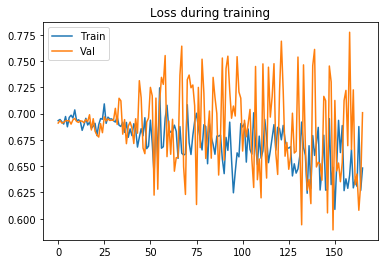

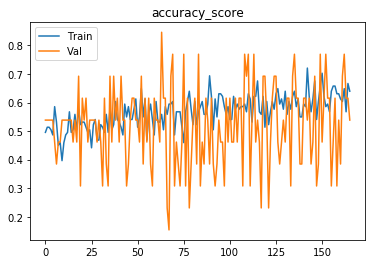

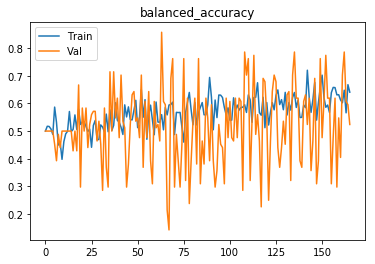

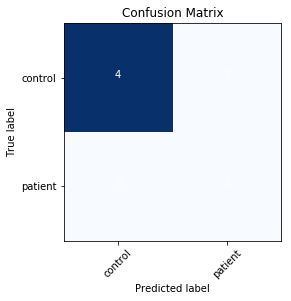

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.69362
[0,     4] loss: 0.69292
[0,     6] loss: 0.69584
[0,     8] loss: 0.69662
Time elapsed: 0h:0m:1s
train accuracy_score: 51.35 %
train balanced_accuracy: 50.91 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.698030
[1,     2] loss: 0.68269
[1,     4] loss: 0.69268
[1,     6] loss: 0.69612
[1,     8] loss: 0.70436
Time elapsed: 0h:0m:3s
train accuracy_score: 50.45 %
train balanced_accuracy: 50.02 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.696450
[2,     2] loss: 0.69330
[2,     4] loss: 0.69119
[2,     6] loss: 0.69751
[2,     8] loss: 0.68906
Time elapsed: 0h:0m:5s
train accuracy_score: 50.45 %
train balanced_accuracy: 50.03 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.696514
[3,     2] loss: 0.69078
[3,     4] loss: 0.69588
[3,     6] loss: 0.69284


Time elapsed: 0h:1m:4s
train accuracy_score: 54.05 %
train balanced_accuracy: 54.06 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.690652
[31,     2] loss: 0.67531
[31,     4] loss: 0.69379
[31,     6] loss: 0.67818
[31,     8] loss: 0.66116
Time elapsed: 0h:1m:6s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.79 %
val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.662253
[32,     2] loss: 0.68259
[32,     4] loss: 0.70313
[32,     6] loss: 0.66713
[32,     8] loss: 0.69498
Time elapsed: 0h:1m:8s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.91 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.718248
[33,     2] loss: 0.66929
[33,     4] loss: 0.68104
[33,     6] loss: 0.68756
[33,     8] loss: 0.70310
Time elapsed: 0h:1m:11s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.84 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.703255
[34,     2] loss: 0.68365
[34, 

[61,     2] loss: 0.66060
[61,     4] loss: 0.67470
[61,     6] loss: 0.72253
[61,     8] loss: 0.68170
Time elapsed: 0h:2m:10s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.74 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.650214
[62,     2] loss: 0.66626
[62,     4] loss: 0.69583
[62,     6] loss: 0.70553
[62,     8] loss: 0.67165
Time elapsed: 0h:2m:12s
train accuracy_score: 56.76 %
train balanced_accuracy: 56.66 %
val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.711398
[63,     2] loss: 0.65805
[63,     4] loss: 0.66392
[63,     6] loss: 0.65979
[63,     8] loss: 0.65693
Time elapsed: 0h:2m:14s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.81 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.666204
[64,     2] loss: 0.65054
[64,     4] loss: 0.71091
[64,     6] loss: 0.64382
[64,     8] loss: 0.65783
Time elapsed: 0h:2m:16s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.41 %
va

val accuracy_score: 53.85 %
val balanced_accuracy: 51.19 %
Val loss: 0.695918
[92,     2] loss: 0.61611
[92,     4] loss: 0.66695
[92,     6] loss: 0.72045
[92,     8] loss: 0.73510
Time elapsed: 0h:3m:15s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.51 %
val accuracy_score: 53.85 %
val balanced_accuracy: 54.76 %
Val loss: 0.647833
[93,     2] loss: 0.69360
[93,     4] loss: 0.63653
[93,     6] loss: 0.76157
[93,     8] loss: 0.70740
Time elapsed: 0h:3m:17s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.83 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.685077
[94,     2] loss: 0.67922
[94,     4] loss: 0.65788
[94,     6] loss: 0.69394
[94,     8] loss: 0.68226
Time elapsed: 0h:3m:19s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.84 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.62 %
Val loss: 0.665855
[95,     2] loss: 0.71558
[95,     4] loss: 0.62069
[95,     6] loss: 0.67051
[95,     8] loss: 0.61922
Time elapse

[122,     2] loss: 0.65150
[122,     4] loss: 0.69339
[122,     6] loss: 0.64654
[122,     8] loss: 0.63596
Time elapsed: 0h:4m:20s
train accuracy_score: 61.26 %
train balanced_accuracy: 61.23 %
val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.699356
[123,     2] loss: 0.67139
[123,     4] loss: 0.66680
[123,     6] loss: 0.63557
[123,     8] loss: 0.64666
Time elapsed: 0h:4m:22s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.51 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.671595
[124,     2] loss: 0.69476
[124,     4] loss: 0.65406
[124,     6] loss: 0.62543
[124,     8] loss: 0.64262
Time elapsed: 0h:4m:24s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.48 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.626624
[125,     2] loss: 0.70619
[125,     4] loss: 0.59749
[125,     6] loss: 0.69152
[125,     8] loss: 0.71783
Time elapsed: 0h:4m:26s
train accuracy_score: 54.95 %
train balanced_accu

Time elapsed: 0h:5m:23s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.84 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.672354
[153,     2] loss: 0.64955
[153,     4] loss: 0.67782
[153,     6] loss: 0.66138
[153,     8] loss: 0.60949
Time elapsed: 0h:5m:25s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.24 %
val accuracy_score: 46.15 %
val balanced_accuracy: 48.81 %
Val loss: 0.665467
[154,     2] loss: 0.62853
[154,     4] loss: 0.60271
[154,     6] loss: 0.56937
[154,     8] loss: 0.59988
Time elapsed: 0h:5m:27s
train accuracy_score: 69.37 %
train balanced_accuracy: 69.33 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.62 %
Val loss: 0.686207
[155,     2] loss: 0.69324
[155,     4] loss: 0.56593
[155,     6] loss: 0.72207
[155,     8] loss: 0.66625
Time elapsed: 0h:5m:29s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.55 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.656449
[156,     2] los

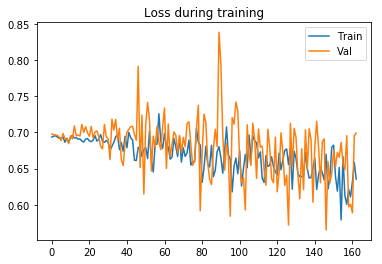

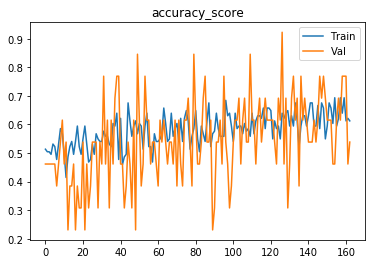

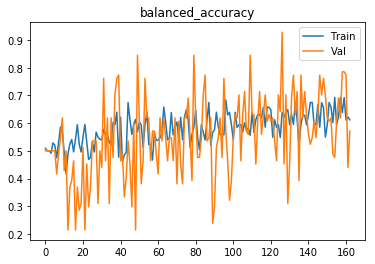

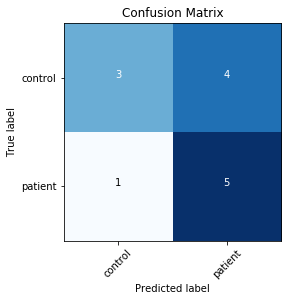

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.70364
[0,     4] loss: 0.68112
[0,     6] loss: 0.68950
[0,     8] loss: 0.69424
Time elapsed: 0h:0m:1s
train accuracy_score: 50.45 %
train balanced_accuracy: 50.00 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.698247
[1,     2] loss: 0.70005
[1,     4] loss: 0.67890
[1,     6] loss: 0.69489
[1,     8] loss: 0.70235
Time elapsed: 0h:0m:3s
train accuracy_score: 52.25 %
train balanced_accuracy: 51.83 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.696409
[2,     2] loss: 0.68417
[2,     4] loss: 0.69576
[2,     6] loss: 0.68025
[2,     8] loss: 0.69995
Time elapsed: 0h:0m:5s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.59 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.696822
[3,     2] loss: 0.68600
[3,     4] loss: 0.70854
[3,     6] loss: 0.68907


Time elapsed: 0h:1m:6s
train accuracy_score: 45.05 %
train balanced_accuracy: 44.97 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.62 %
Val loss: 0.699522
[31,     2] loss: 0.68773
[31,     4] loss: 0.68580
[31,     6] loss: 0.68081
[31,     8] loss: 0.68487
Time elapsed: 0h:1m:8s
train accuracy_score: 61.26 %
train balanced_accuracy: 61.25 %
val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.689506
[32,     2] loss: 0.68955
[32,     4] loss: 0.69787
[32,     6] loss: 0.71377
[32,     8] loss: 0.68521
Time elapsed: 0h:1m:10s
train accuracy_score: 47.75 %
train balanced_accuracy: 47.82 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.692483
[33,     2] loss: 0.69647
[33,     4] loss: 0.69991
[33,     6] loss: 0.68377
[33,     8] loss: 0.67493
Time elapsed: 0h:1m:13s
train accuracy_score: 52.25 %
train balanced_accuracy: 52.32 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.674067
[34,     2] loss: 0.71104
[34,

[61,     2] loss: 0.64080
[61,     4] loss: 0.70678
[61,     6] loss: 0.65411
[61,     8] loss: 0.63732
Time elapsed: 0h:2m:11s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.62 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.675205
[62,     2] loss: 0.70696
[62,     4] loss: 0.68750
[62,     6] loss: 0.73196
[62,     8] loss: 0.63857
Time elapsed: 0h:2m:14s
train accuracy_score: 47.75 %
train balanced_accuracy: 47.74 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.687428
[63,     2] loss: 0.67206
[63,     4] loss: 0.68519
[63,     6] loss: 0.65673
[63,     8] loss: 0.59654
Time elapsed: 0h:2m:16s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.76 %
val accuracy_score: 38.46 %
val balanced_accuracy: 36.90 %
Val loss: 0.719924
[64,     2] loss: 0.68281
[64,     4] loss: 0.69955
[64,     6] loss: 0.65139
[64,     8] loss: 0.62266
Time elapsed: 0h:2m:18s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.39 %
va

val accuracy_score: 53.85 %
val balanced_accuracy: 54.76 %
Val loss: 0.742112
[92,     2] loss: 0.63234
[92,     4] loss: 0.65827
[92,     6] loss: 0.62015
[92,     8] loss: 0.70522
Time elapsed: 0h:3m:18s
train accuracy_score: 63.06 %
train balanced_accuracy: 62.86 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.62 %
Val loss: 0.704952
[93,     2] loss: 0.64707
[93,     4] loss: 0.62802
[93,     6] loss: 0.54299
[93,     8] loss: 0.63735
Time elapsed: 0h:3m:20s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.74 %
val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.691218
[94,     2] loss: 0.65610
[94,     4] loss: 0.66524
[94,     6] loss: 0.57323
[94,     8] loss: 0.71391
Time elapsed: 0h:3m:23s
train accuracy_score: 62.16 %
train balanced_accuracy: 62.08 %
val accuracy_score: 38.46 %
val balanced_accuracy: 39.29 %
Val loss: 0.738903
[95,     2] loss: 0.63930
[95,     4] loss: 0.66391
[95,     6] loss: 0.68947
[95,     8] loss: 0.58309
Time elapse

[122,     2] loss: 0.64637
[122,     4] loss: 0.60493
[122,     6] loss: 0.61341
[122,     8] loss: 0.65632
Time elapsed: 0h:4m:22s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.86 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.679244
[123,     2] loss: 0.62283
[123,     4] loss: 0.64548
[123,     6] loss: 0.67401
[123,     8] loss: 0.62238
Time elapsed: 0h:4m:24s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.83 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.653846
[124,     2] loss: 0.69046
[124,     4] loss: 0.64021
[124,     6] loss: 0.57463
[124,     8] loss: 0.73371
Time elapsed: 0h:4m:26s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.71 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.681115
[125,     2] loss: 0.69533
[125,     4] loss: 0.71510
[125,     6] loss: 0.62951
[125,     8] loss: 0.65125
Time elapsed: 0h:4m:28s
train accuracy_score: 59.46 %
train balanced_accu

Time elapsed: 0h:5m:27s
train accuracy_score: 54.95 %
train balanced_accuracy: 55.00 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.695713
[153,     2] loss: 0.69491
[153,     4] loss: 0.63457
[153,     6] loss: 0.66713
[153,     8] loss: 0.65160
Time elapsed: 0h:5m:29s
train accuracy_score: 62.16 %
train balanced_accuracy: 62.26 %
val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.652975
[154,     2] loss: 0.68571
[154,     4] loss: 0.60203
[154,     6] loss: 0.68274
[154,     8] loss: 0.64700
Time elapsed: 0h:5m:32s
train accuracy_score: 62.16 %
train balanced_accuracy: 62.13 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.696096
[155,     2] loss: 0.65683
[155,     4] loss: 0.64925
[155,     6] loss: 0.60528
[155,     8] loss: 0.62182
Time elapsed: 0h:5m:35s
train accuracy_score: 61.26 %
train balanced_accuracy: 61.07 %
val accuracy_score: 38.46 %
val balanced_accuracy: 40.48 %
Val loss: 0.726790
[156,     2] los

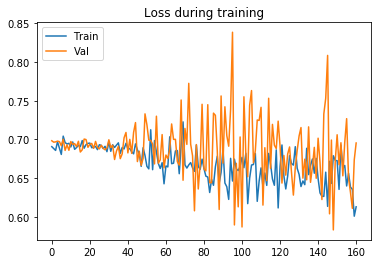

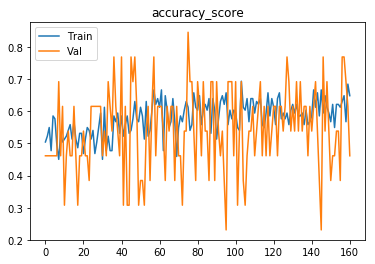

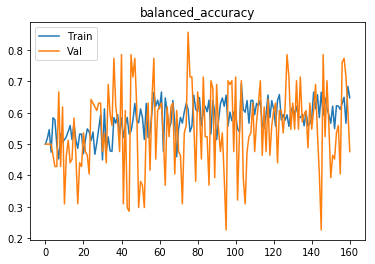

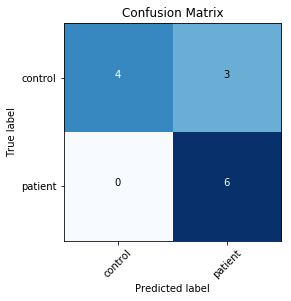

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.69183
Time elapsed: 0h:0m:1s
train accuracy_score: 49.55 %
train balanced_accuracy: 49.14 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.693108
[1,     2] loss: 0.69467
Time elapsed: 0h:0m:3s
train accuracy_score: 47.75 %
train balanced_accuracy: 47.45 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.695383
[2,     2] loss: 0.69480
Time elapsed: 0h:0m:5s
train accuracy_score: 45.05 %
train balanced_accuracy: 44.79 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.693902
[3,     2] loss: 0.68957
Time elapsed: 0h:0m:7s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.25 %
val accuracy_score: 53.85 %
val balanced_accuracy: 57.14 %
Val loss: 0.691953
[4,     2] loss: 0.69648
Time elapsed: 0h:0m:10s
train accuracy_score: 52.25 %
train balanced_accuracy: 52.14 %

val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.692690
[43,     2] loss: 0.67934
Time elapsed: 0h:1m:32s
train accuracy_score: 54.05 %
train balanced_accuracy: 54.17 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.694725
[44,     2] loss: 0.68151
Time elapsed: 0h:1m:34s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.71 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.686354
[45,     2] loss: 0.69325
Time elapsed: 0h:1m:36s
train accuracy_score: 47.75 %
train balanced_accuracy: 47.94 %
val accuracy_score: 61.54 %
val balanced_accuracy: 58.33 %
Val loss: 0.676292
[46,     2] loss: 0.69433
Time elapsed: 0h:1m:38s
train accuracy_score: 49.55 %
train balanced_accuracy: 49.84 %
val accuracy_score: 46.15 %
val balanced_accuracy: 42.86 %
Val loss: 0.701370
[47,     2] loss: 0.68207
Time elapsed: 0h:1m:40s
train accuracy_score: 54.95 %
train balanced_accuracy: 55.18 %
val accuracy_score: 30.77 %
val balanced_accu

val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.703068
[86,     2] loss: 0.69225
Time elapsed: 0h:3m:4s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.95 %
val accuracy_score: 38.46 %
val balanced_accuracy: 36.90 %
Val loss: 0.704775
[87,     2] loss: 0.68781
Time elapsed: 0h:3m:6s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.94 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.685157
[88,     2] loss: 0.66616
Time elapsed: 0h:3m:8s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.78 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.681791
[89,     2] loss: 0.68176
Time elapsed: 0h:3m:10s
train accuracy_score: 54.05 %
train balanced_accuracy: 54.19 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.688739
[90,     2] loss: 0.67607
Time elapsed: 0h:3m:12s
train accuracy_score: 53.15 %
train balanced_accuracy: 53.18 %
val accuracy_score: 38.46 %
val balanced_accurac

val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.646945
[129,     2] loss: 0.67613
Time elapsed: 0h:4m:35s
train accuracy_score: 53.15 %
train balanced_accuracy: 53.07 %
val accuracy_score: 84.62 %
val balanced_accuracy: 84.52 %
Val loss: 0.603955
[130,     2] loss: 0.65060
Time elapsed: 0h:4m:38s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.57 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.753198
[131,     2] loss: 0.65584
Time elapsed: 0h:4m:40s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.26 %
val accuracy_score: 38.46 %
val balanced_accuracy: 38.10 %
Val loss: 0.748830
[132,     2] loss: 0.67473
Time elapsed: 0h:4m:42s
train accuracy_score: 56.76 %
train balanced_accuracy: 56.75 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.667733
[133,     2] loss: 0.67495
Time elapsed: 0h:4m:44s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.63 %
val accuracy_score: 61.54 %
val balanced

val accuracy_score: 46.15 %
val balanced_accuracy: 48.81 %
Val loss: 0.739268
[172,     2] loss: 0.67826
Time elapsed: 0h:6m:6s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.32 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.683655
[173,     2] loss: 0.66870
Time elapsed: 0h:6m:8s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.90 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.653547
[174,     2] loss: 0.68524
Time elapsed: 0h:6m:10s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.60 %
val accuracy_score: 46.15 %
val balanced_accuracy: 44.05 %
Val loss: 0.696339
[175,     2] loss: 0.63159
Time elapsed: 0h:6m:12s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.72 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.738556
[176,     2] loss: 0.62700
Time elapsed: 0h:6m:14s
train accuracy_score: 63.06 %
train balanced_accuracy: 63.00 %
val accuracy_score: 61.54 %
val balanced_a

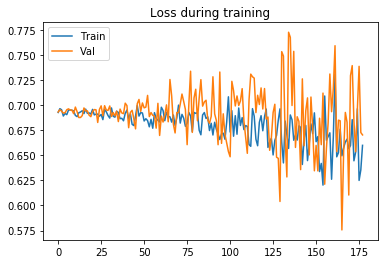

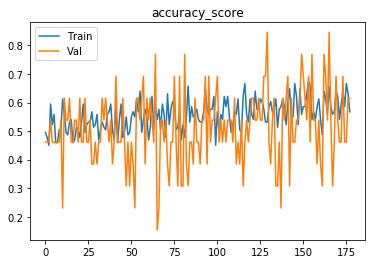

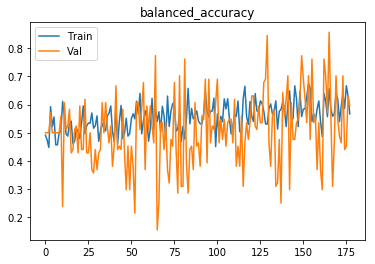

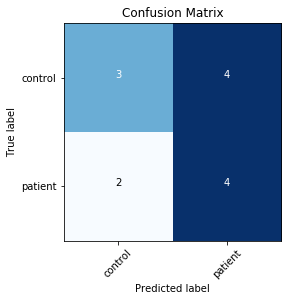

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.69886
Time elapsed: 0h:0m:1s
train accuracy_score: 49.55 %
train balanced_accuracy: 49.95 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.692220
[1,     2] loss: 0.69008
Time elapsed: 0h:0m:3s
train accuracy_score: 48.65 %
train balanced_accuracy: 49.06 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.691604
[2,     2] loss: 0.69559
Time elapsed: 0h:0m:5s
train accuracy_score: 49.55 %
train balanced_accuracy: 49.97 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.690717
[3,     2] loss: 0.69547
Time elapsed: 0h:0m:7s
train accuracy_score: 45.95 %
train balanced_accuracy: 46.35 %
val accuracy_score: 53.85 %
val balanced_accuracy: 50.00 %
Val loss: 0.692150
[4,     2] loss: 0.69711
Time elapsed: 0h:0m:9s
train accuracy_score: 47.75 %
train balanced_accuracy: 48.13 %


val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.694259
[43,     2] loss: 0.68937
Time elapsed: 0h:1m:32s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.71 %
val accuracy_score: 53.85 %
val balanced_accuracy: 54.76 %
Val loss: 0.688120
[44,     2] loss: 0.69498
Time elapsed: 0h:1m:34s
train accuracy_score: 50.45 %
train balanced_accuracy: 50.57 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.696410
[45,     2] loss: 0.68463
Time elapsed: 0h:1m:36s
train accuracy_score: 54.95 %
train balanced_accuracy: 55.13 %
val accuracy_score: 69.23 %
val balanced_accuracy: 67.86 %
Val loss: 0.682575
[46,     2] loss: 0.69380
Time elapsed: 0h:1m:39s
train accuracy_score: 53.15 %
train balanced_accuracy: 53.34 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.685042
[47,     2] loss: 0.69488
Time elapsed: 0h:1m:41s
train accuracy_score: 52.25 %
train balanced_accuracy: 52.42 %
val accuracy_score: 46.15 %
val balanced_accu

val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.657475
[86,     2] loss: 0.68923
Time elapsed: 0h:3m:3s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.78 %
val accuracy_score: 30.77 %
val balanced_accuracy: 33.33 %
Val loss: 0.705291
[87,     2] loss: 0.68316
Time elapsed: 0h:3m:5s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.86 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.701315
[88,     2] loss: 0.68593
Time elapsed: 0h:3m:7s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.71 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.667096
[89,     2] loss: 0.68503
Time elapsed: 0h:3m:9s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.80 %
val accuracy_score: 38.46 %
val balanced_accuracy: 40.48 %
Val loss: 0.725499
[90,     2] loss: 0.68146
Time elapsed: 0h:3m:11s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.85 %
val accuracy_score: 61.54 %
val balanced_accuracy

val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.656028
[129,     2] loss: 0.69270
Time elapsed: 0h:4m:35s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.61 %
val accuracy_score: 30.77 %
val balanced_accuracy: 33.33 %
Val loss: 0.804271
[130,     2] loss: 0.65198
Time elapsed: 0h:4m:37s
train accuracy_score: 63.06 %
train balanced_accuracy: 63.04 %
val accuracy_score: 76.92 %
val balanced_accuracy: 78.57 %
Val loss: 0.662439
[131,     2] loss: 0.67328
Time elapsed: 0h:4m:39s
train accuracy_score: 55.86 %
train balanced_accuracy: 55.67 %
val accuracy_score: 61.54 %
val balanced_accuracy: 64.29 %
Val loss: 0.650217
[132,     2] loss: 0.65025
Time elapsed: 0h:4m:41s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.40 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.704944
[133,     2] loss: 0.62616
Time elapsed: 0h:4m:43s
train accuracy_score: 68.47 %
train balanced_accuracy: 68.33 %
val accuracy_score: 46.15 %
val balanced

val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.706736
[172,     2] loss: 0.68177
Time elapsed: 0h:6m:7s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.53 %
val accuracy_score: 46.15 %
val balanced_accuracy: 48.81 %
Val loss: 0.726685
[173,     2] loss: 0.71844
Time elapsed: 0h:6m:9s
train accuracy_score: 51.35 %
train balanced_accuracy: 51.22 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.704003
[174,     2] loss: 0.68463
Time elapsed: 0h:6m:11s
train accuracy_score: 54.05 %
train balanced_accuracy: 53.94 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.698872
[175,     2] loss: 0.67858
Time elapsed: 0h:6m:13s
train accuracy_score: 53.15 %
train balanced_accuracy: 53.05 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.631223
[176,     2] loss: 0.65403
Time elapsed: 0h:6m:15s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.37 %
val accuracy_score: 76.92 %
val balanced_a

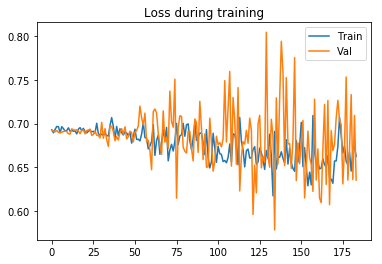

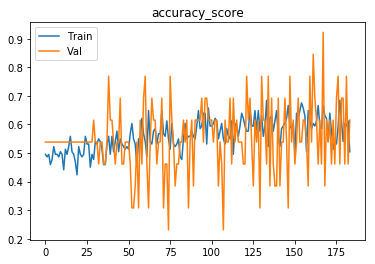

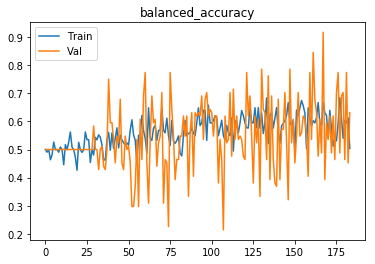

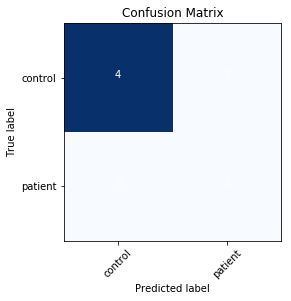

Finished outer fold.
{'final_acc': 0.6309523809523809, 'best_acc': 0.9166666666666667, 'final_iter': 184, 'best_iter': 168, 'params': {'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 5e-05}, 'inner_fold_idx': 4}
###### Starting outer fold 9
111
13
Shuffled the data..
###### Starting inner fold 0
{'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.69334
[0,     4] loss: 0.68100
[0,     6] loss: 0.69711
[0,     8] loss: 0.69810
Time elapsed: 0h:0m:1s
train accuracy_score: 52.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.700377
[1,     2] loss: 0.66557
[1,     4] loss: 0.70120
[1,     6] loss: 0.72029
[1,     8] loss: 0.70506
Time elapsed: 0h:0m:3s
train accuracy_score: 52.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.702232
[2,     2] loss: 0.69610
[2,     4] loss: 0.68580
[2,     

Time elapsed: 0h:1m:1s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.47 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.62 %
Val loss: 0.683969
[30,     2] loss: 0.68560
[30,     4] loss: 0.68929
[30,     6] loss: 0.68199
[30,     8] loss: 0.70790
Time elapsed: 0h:1m:3s
train accuracy_score: 53.15 %
train balanced_accuracy: 53.14 %
val accuracy_score: 23.08 %
val balanced_accuracy: 22.62 %
Val loss: 0.722241
[31,     2] loss: 0.70383
[31,     4] loss: 0.68456
[31,     6] loss: 0.68222
[31,     8] loss: 0.68002
Time elapsed: 0h:1m:5s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.94 %
val accuracy_score: 38.46 %
val balanced_accuracy: 38.10 %
Val loss: 0.707503
[32,     2] loss: 0.66966
[32,     4] loss: 0.68674
[32,     6] loss: 0.70969
[32,     8] loss: 0.66932
Time elapsed: 0h:1m:7s
train accuracy_score: 61.26 %
train balanced_accuracy: 60.90 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.651289
[33,     2] loss: 0.70899
[33,  

[60,     2] loss: 0.68380
[60,     4] loss: 0.69540
[60,     6] loss: 0.75113
[60,     8] loss: 0.68476
Time elapsed: 0h:2m:5s
train accuracy_score: 54.05 %
train balanced_accuracy: 53.03 %
val accuracy_score: 38.46 %
val balanced_accuracy: 40.48 %
Val loss: 0.730943
[61,     2] loss: 0.68794
[61,     4] loss: 0.64265
[61,     6] loss: 0.65667
[61,     8] loss: 0.70309
Time elapsed: 0h:2m:7s
train accuracy_score: 63.06 %
train balanced_accuracy: 62.22 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.644493
[62,     2] loss: 0.69270
[62,     4] loss: 0.68094
[62,     6] loss: 0.62430
[62,     8] loss: 0.64206
Time elapsed: 0h:2m:9s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.28 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.705597
[63,     2] loss: 0.65884
[63,     4] loss: 0.64149
[63,     6] loss: 0.72096
[63,     8] loss: 0.62085
Time elapsed: 0h:2m:11s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.91 %
val a

val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.731021
[91,     2] loss: 0.68473
[91,     4] loss: 0.69790
[91,     6] loss: 0.62052
[91,     8] loss: 0.64789
Time elapsed: 0h:3m:9s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.01 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.659409
[92,     2] loss: 0.71426
[92,     4] loss: 0.72763
[92,     6] loss: 0.65067
[92,     8] loss: 0.68386
Time elapsed: 0h:3m:11s
train accuracy_score: 53.15 %
train balanced_accuracy: 52.49 %
val accuracy_score: 46.15 %
val balanced_accuracy: 45.24 %
Val loss: 0.711566
[93,     2] loss: 0.63304
[93,     4] loss: 0.72648
[93,     6] loss: 0.72588
[93,     8] loss: 0.63423
Time elapsed: 0h:3m:13s
train accuracy_score: 58.56 %
train balanced_accuracy: 57.99 %
val accuracy_score: 69.23 %
val balanced_accuracy: 71.43 %
Val loss: 0.651953
[94,     2] loss: 0.72570
[94,     4] loss: 0.68943
[94,     6] loss: 0.59682
[94,     8] loss: 0.67255
Time elapsed

[121,     2] loss: 0.68739
[121,     4] loss: 0.66428
[121,     6] loss: 0.71415
[121,     8] loss: 0.67275
Time elapsed: 0h:4m:10s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.62 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.646753
[122,     2] loss: 0.63949
[122,     4] loss: 0.70587
[122,     6] loss: 0.59999
[122,     8] loss: 0.64759
Time elapsed: 0h:4m:12s
train accuracy_score: 60.36 %
train balanced_accuracy: 59.79 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.694924
[123,     2] loss: 0.66224
[123,     4] loss: 0.63842
[123,     6] loss: 0.67729
[123,     8] loss: 0.68129
Time elapsed: 0h:4m:14s
train accuracy_score: 60.36 %
train balanced_accuracy: 59.87 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.676900
[124,     2] loss: 0.64007
[124,     4] loss: 0.67131
[124,     6] loss: 0.61535
[124,     8] loss: 0.68597
Time elapsed: 0h:4m:17s
train accuracy_score: 63.96 %
train balanced_accu

Time elapsed: 0h:5m:13s
train accuracy_score: 69.37 %
train balanced_accuracy: 69.23 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.648760
[152,     2] loss: 0.74454
[152,     4] loss: 0.72523
[152,     6] loss: 0.72980
[152,     8] loss: 0.56232
Time elapsed: 0h:5m:15s
train accuracy_score: 53.15 %
train balanced_accuracy: 52.73 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.670365
[153,     2] loss: 0.66087
[153,     4] loss: 0.70393
[153,     6] loss: 0.64334
[153,     8] loss: 0.68519
Time elapsed: 0h:5m:17s
train accuracy_score: 54.05 %
train balanced_accuracy: 53.35 %
val accuracy_score: 69.23 %
val balanced_accuracy: 71.43 %
Val loss: 0.615261
[154,     2] loss: 0.62351
[154,     4] loss: 0.65333
[154,     6] loss: 0.56812
[154,     8] loss: 0.62967
Time elapsed: 0h:5m:19s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.08 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.630640
[155,     2] los

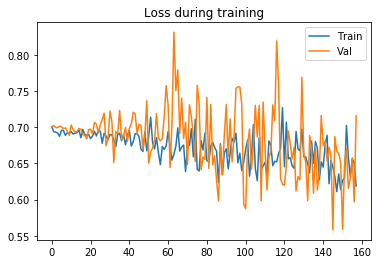

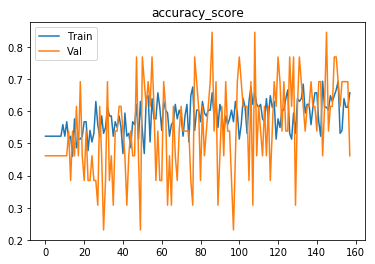

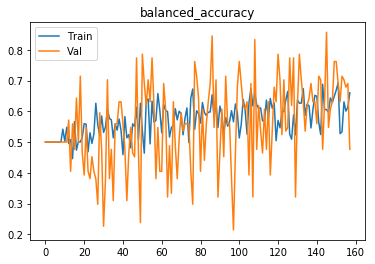

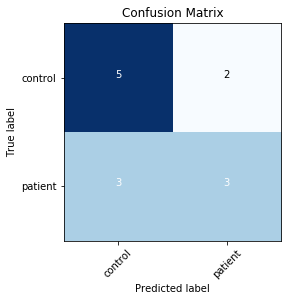

###### Starting inner fold 1
{'model': 'ModelLiu', 'batch_size': 16, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.69787
[0,     4] loss: 0.68161
[0,     6] loss: 0.69229
Time elapsed: 0h:0m:1s
train accuracy_score: 52.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.697117
[1,     2] loss: 0.69671
[1,     4] loss: 0.68257
[1,     6] loss: 0.70614
Time elapsed: 0h:0m:3s
train accuracy_score: 52.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.697772
[2,     2] loss: 0.68399
[2,     4] loss: 0.69493
[2,     6] loss: 0.69797
Time elapsed: 0h:0m:5s
train accuracy_score: 52.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.698097
[3,     2] loss: 0.68853
[3,     4] loss: 0.69469
[3,     6] loss: 0.69018
Time elapsed: 0h:0m:7s
train accuracy_score: 52.25 %
train balanced_accurac

val accuracy_score: 76.92 %
val balanced_accuracy: 77.38 %
Val loss: 0.671358
[34,     2] loss: 0.69007
[34,     4] loss: 0.68029
[34,     6] loss: 0.68521
Time elapsed: 0h:1m:9s
train accuracy_score: 55.86 %
train balanced_accuracy: 54.67 %
val accuracy_score: 38.46 %
val balanced_accuracy: 36.90 %
Val loss: 0.706277
[35,     2] loss: 0.68237
[35,     4] loss: 0.67971
[35,     6] loss: 0.68392
Time elapsed: 0h:1m:11s
train accuracy_score: 61.26 %
train balanced_accuracy: 60.65 %
val accuracy_score: 30.77 %
val balanced_accuracy: 29.76 %
Val loss: 0.715239
[36,     2] loss: 0.70255
[36,     4] loss: 0.68569
[36,     6] loss: 0.70346
Time elapsed: 0h:1m:13s
train accuracy_score: 48.65 %
train balanced_accuracy: 47.77 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.684379
[37,     2] loss: 0.67866
[37,     4] loss: 0.69224
[37,     6] loss: 0.67806
Time elapsed: 0h:1m:15s
train accuracy_score: 62.16 %
train balanced_accuracy: 61.43 %
val accuracy_score: 69.23 %
v

val accuracy_score: 38.46 %
val balanced_accuracy: 40.48 %
Val loss: 0.711787
[68,     2] loss: 0.63879
[68,     4] loss: 0.63163
[68,     6] loss: 0.65629
Time elapsed: 0h:2m:20s
train accuracy_score: 69.37 %
train balanced_accuracy: 68.66 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.675571
[69,     2] loss: 0.67450
[69,     4] loss: 0.67229
[69,     6] loss: 0.68722
Time elapsed: 0h:2m:22s
train accuracy_score: 59.46 %
train balanced_accuracy: 58.93 %
val accuracy_score: 38.46 %
val balanced_accuracy: 39.29 %
Val loss: 0.721684
[70,     2] loss: 0.69491
[70,     4] loss: 0.67432
[70,     6] loss: 0.67631
Time elapsed: 0h:2m:24s
train accuracy_score: 53.15 %
train balanced_accuracy: 53.06 %
val accuracy_score: 38.46 %
val balanced_accuracy: 36.90 %
Val loss: 0.719481
[71,     2] loss: 0.69257
[71,     4] loss: 0.71912
[71,     6] loss: 0.69176
Time elapsed: 0h:2m:26s
train accuracy_score: 53.15 %
train balanced_accuracy: 52.49 %
val accuracy_score: 69.23 %


val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.668914
[102,     2] loss: 0.65109
[102,     4] loss: 0.66998
[102,     6] loss: 0.65703
Time elapsed: 0h:3m:29s
train accuracy_score: 62.16 %
train balanced_accuracy: 61.76 %
val accuracy_score: 38.46 %
val balanced_accuracy: 39.29 %
Val loss: 0.726603
[103,     2] loss: 0.65574
[103,     4] loss: 0.67713
[103,     6] loss: 0.63227
Time elapsed: 0h:3m:31s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.51 %
val accuracy_score: 38.46 %
val balanced_accuracy: 39.29 %
Val loss: 0.744056
[104,     2] loss: 0.62232
[104,     4] loss: 0.65796
[104,     6] loss: 0.64664
Time elapsed: 0h:3m:33s
train accuracy_score: 65.77 %
train balanced_accuracy: 64.96 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.607590
[105,     2] loss: 0.63681
[105,     4] loss: 0.64055
[105,     6] loss: 0.64444
Time elapsed: 0h:3m:35s
train accuracy_score: 71.17 %
train balanced_accuracy: 70.95 %
val accuracy_sco

Time elapsed: 0h:4m:37s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.02 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.640554
[136,     2] loss: 0.63864
[136,     4] loss: 0.69909
[136,     6] loss: 0.59352
Time elapsed: 0h:4m:39s
train accuracy_score: 64.86 %
train balanced_accuracy: 63.94 %
val accuracy_score: 61.54 %
val balanced_accuracy: 64.29 %
Val loss: 0.659167
[137,     2] loss: 0.69179
[137,     4] loss: 0.64279
[137,     6] loss: 0.69030
Time elapsed: 0h:4m:41s
train accuracy_score: 59.46 %
train balanced_accuracy: 58.85 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.62 %
Val loss: 0.741899
[138,     2] loss: 0.63528
[138,     4] loss: 0.63350
[138,     6] loss: 0.67700
Time elapsed: 0h:4m:43s
train accuracy_score: 63.06 %
train balanced_accuracy: 62.22 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.674906
[139,     2] loss: 0.63042
[139,     4] loss: 0.67461
[139,     6] loss: 0.63420
Time elapsed: 0h

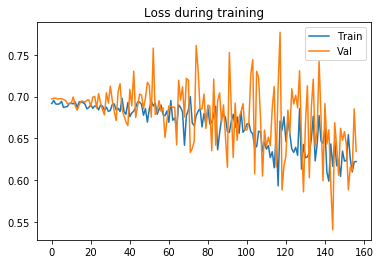

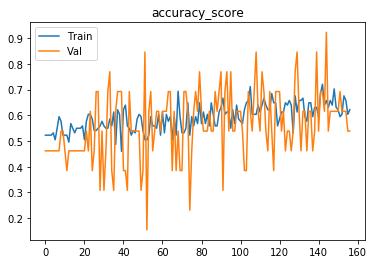

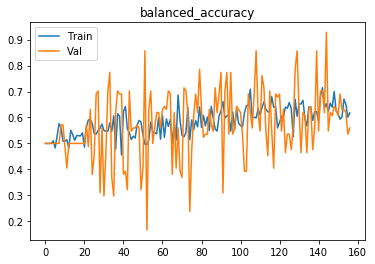

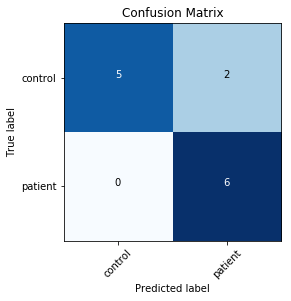

###### Starting inner fold 2
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 12, 'lr': 5e-05}
Trainable model parameters: 116001
[0,     2] loss: 0.69258
Time elapsed: 0h:0m:1s
train accuracy_score: 52.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.698746
[1,     2] loss: 0.69245
Time elapsed: 0h:0m:3s
train accuracy_score: 52.25 %
train balanced_accuracy: 50.00 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.693924
[2,     2] loss: 0.69206
Time elapsed: 0h:0m:5s
train accuracy_score: 54.05 %
train balanced_accuracy: 51.97 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.695994
[3,     2] loss: 0.69175
Time elapsed: 0h:0m:7s
train accuracy_score: 52.25 %
train balanced_accuracy: 50.24 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.695982
[4,     2] loss: 0.69313
Time elapsed: 0h:0m:9s
train accuracy_score: 54.05 %
train balanced_accuracy: 52.21 %


val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.690660
[43,     2] loss: 0.68100
Time elapsed: 0h:1m:31s
train accuracy_score: 62.16 %
train balanced_accuracy: 60.87 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.685713
[44,     2] loss: 0.68980
Time elapsed: 0h:1m:34s
train accuracy_score: 59.46 %
train balanced_accuracy: 58.44 %
val accuracy_score: 30.77 %
val balanced_accuracy: 33.33 %
Val loss: 0.719134
[45,     2] loss: 0.69178
Time elapsed: 0h:1m:36s
train accuracy_score: 50.45 %
train balanced_accuracy: 49.50 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.699763
[46,     2] loss: 0.69128
Time elapsed: 0h:1m:38s
train accuracy_score: 54.95 %
train balanced_accuracy: 53.72 %
val accuracy_score: 76.92 %
val balanced_accuracy: 78.57 %
Val loss: 0.675787
[47,     2] loss: 0.68261
Time elapsed: 0h:1m:40s
train accuracy_score: 55.86 %
train balanced_accuracy: 54.59 %
val accuracy_score: 46.15 %
val balanced_accu

val accuracy_score: 46.15 %
val balanced_accuracy: 48.81 %
Val loss: 0.731020
[86,     2] loss: 0.68977
Time elapsed: 0h:3m:0s
train accuracy_score: 55.86 %
train balanced_accuracy: 54.99 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.62 %
Val loss: 0.747742
[87,     2] loss: 0.65556
Time elapsed: 0h:3m:3s
train accuracy_score: 62.16 %
train balanced_accuracy: 61.35 %
val accuracy_score: 46.15 %
val balanced_accuracy: 47.62 %
Val loss: 0.719013
[88,     2] loss: 0.67198
Time elapsed: 0h:3m:5s
train accuracy_score: 62.16 %
train balanced_accuracy: 61.19 %
val accuracy_score: 53.85 %
val balanced_accuracy: 57.14 %
Val loss: 0.723808
[89,     2] loss: 0.64277
Time elapsed: 0h:3m:7s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.13 %
val accuracy_score: 61.54 %
val balanced_accuracy: 64.29 %
Val loss: 0.688224
[90,     2] loss: 0.67776
Time elapsed: 0h:3m:9s
train accuracy_score: 58.56 %
train balanced_accuracy: 58.31 %
val accuracy_score: 61.54 %
val balanced_accuracy:

val accuracy_score: 76.92 %
val balanced_accuracy: 76.19 %
Val loss: 0.631868
[129,     2] loss: 0.66908
Time elapsed: 0h:4m:31s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.36 %
val accuracy_score: 61.54 %
val balanced_accuracy: 60.71 %
Val loss: 0.685000
[130,     2] loss: 0.69178
Time elapsed: 0h:4m:33s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.62 %
val accuracy_score: 53.85 %
val balanced_accuracy: 54.76 %
Val loss: 0.735017
[131,     2] loss: 0.63632
Time elapsed: 0h:4m:35s
train accuracy_score: 67.57 %
train balanced_accuracy: 67.09 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.38 %
Val loss: 0.606132
[132,     2] loss: 0.65549
Time elapsed: 0h:4m:37s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.07 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.683842
[133,     2] loss: 0.64685
Time elapsed: 0h:4m:39s
train accuracy_score: 66.67 %
train balanced_accuracy: 66.23 %
val accuracy_score: 53.85 %
val balanced

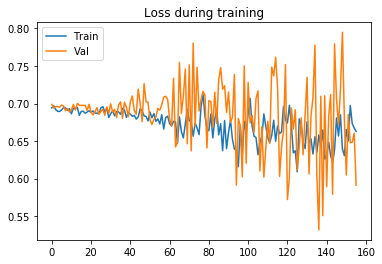

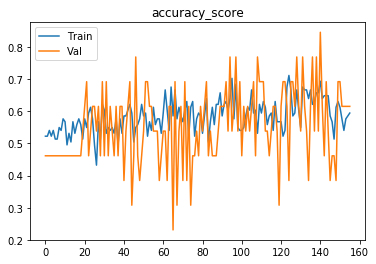

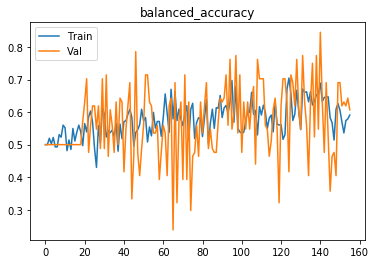

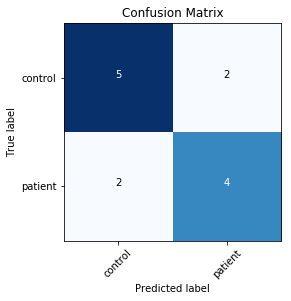

###### Starting inner fold 3
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 12, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.69262
Time elapsed: 0h:0m:1s
train accuracy_score: 54.05 %
train balanced_accuracy: 52.05 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.693976
[1,     2] loss: 0.69122
Time elapsed: 0h:0m:3s
train accuracy_score: 50.45 %
train balanced_accuracy: 48.76 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.694794
[2,     2] loss: 0.69320
Time elapsed: 0h:0m:5s
train accuracy_score: 48.65 %
train balanced_accuracy: 47.45 %
val accuracy_score: 61.54 %
val balanced_accuracy: 64.29 %
Val loss: 0.694086
[3,     2] loss: 0.69156
Time elapsed: 0h:0m:7s
train accuracy_score: 48.65 %
train balanced_accuracy: 48.10 %
val accuracy_score: 30.77 %
val balanced_accuracy: 29.76 %
Val loss: 0.699441
[4,     2] loss: 0.68796
Time elapsed: 0h:0m:9s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.37 %

val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.721582
[43,     2] loss: 0.69225
Time elapsed: 0h:1m:31s
train accuracy_score: 53.15 %
train balanced_accuracy: 52.65 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.625515
[44,     2] loss: 0.68599
Time elapsed: 0h:1m:33s
train accuracy_score: 51.35 %
train balanced_accuracy: 50.44 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.644698
[45,     2] loss: 0.66174
Time elapsed: 0h:1m:35s
train accuracy_score: 62.16 %
train balanced_accuracy: 61.35 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.703528
[46,     2] loss: 0.66330
Time elapsed: 0h:1m:37s
train accuracy_score: 57.66 %
train balanced_accuracy: 57.04 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.652281
[47,     2] loss: 0.66018
Time elapsed: 0h:1m:39s
train accuracy_score: 63.96 %
train balanced_accuracy: 63.24 %
val accuracy_score: 30.77 %
val balanced_accu

val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.697551
[86,     2] loss: 0.67668
Time elapsed: 0h:3m:0s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.09 %
val accuracy_score: 84.62 %
val balanced_accuracy: 85.71 %
Val loss: 0.626879
[87,     2] loss: 0.65447
Time elapsed: 0h:3m:2s
train accuracy_score: 62.16 %
train balanced_accuracy: 61.43 %
val accuracy_score: 38.46 %
val balanced_accuracy: 40.48 %
Val loss: 0.774573
[88,     2] loss: 0.68635
Time elapsed: 0h:3m:5s
train accuracy_score: 56.76 %
train balanced_accuracy: 55.69 %
val accuracy_score: 61.54 %
val balanced_accuracy: 64.29 %
Val loss: 0.656756
[89,     2] loss: 0.65947
Time elapsed: 0h:3m:7s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.10 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.692870
[90,     2] loss: 0.67966
Time elapsed: 0h:3m:9s
train accuracy_score: 54.05 %
train balanced_accuracy: 53.03 %
val accuracy_score: 69.23 %
val balanced_accuracy:

val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.673064
[129,     2] loss: 0.65909
Time elapsed: 0h:4m:30s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.28 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.730767
[130,     2] loss: 0.63182
Time elapsed: 0h:4m:33s
train accuracy_score: 64.86 %
train balanced_accuracy: 64.35 %
val accuracy_score: 53.85 %
val balanced_accuracy: 54.76 %
Val loss: 0.733238
[131,     2] loss: 0.59029
Time elapsed: 0h:4m:35s
train accuracy_score: 69.37 %
train balanced_accuracy: 68.41 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.707381
[132,     2] loss: 0.66936
Time elapsed: 0h:4m:36s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.82 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.630119
[133,     2] loss: 0.69640
Time elapsed: 0h:4m:38s
train accuracy_score: 60.36 %
train balanced_accuracy: 60.28 %
val accuracy_score: 61.54 %
val balanced

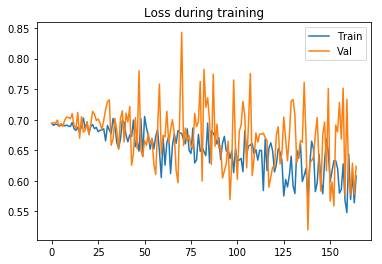

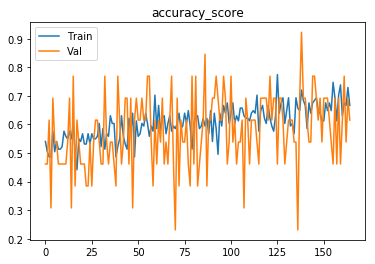

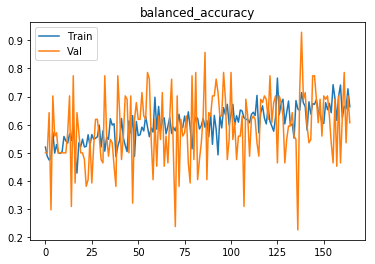

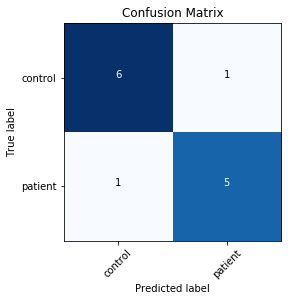

###### Starting inner fold 4
{'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 0.0001}
Trainable model parameters: 116001
[0,     2] loss: 0.69454
Time elapsed: 0h:0m:1s
train accuracy_score: 51.35 %
train balanced_accuracy: 49.95 %
val accuracy_score: 53.85 %
val balanced_accuracy: 57.14 %
Val loss: 0.694155
[1,     2] loss: 0.69234
Time elapsed: 0h:0m:3s
train accuracy_score: 54.05 %
train balanced_accuracy: 52.94 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.693236
[2,     2] loss: 0.69227
Time elapsed: 0h:0m:5s
train accuracy_score: 47.75 %
train balanced_accuracy: 46.01 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.692544
[3,     2] loss: 0.69120
Time elapsed: 0h:0m:7s
train accuracy_score: 51.35 %
train balanced_accuracy: 49.63 %
val accuracy_score: 46.15 %
val balanced_accuracy: 50.00 %
Val loss: 0.696175
[4,     2] loss: 0.69579
Time elapsed: 0h:0m:9s
train accuracy_score: 46.85 %
train balanced_accuracy: 45.07 %

val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.651553
[43,     2] loss: 0.68707
Time elapsed: 0h:1m:29s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.13 %
val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.734143
[44,     2] loss: 0.66670
Time elapsed: 0h:1m:32s
train accuracy_score: 63.06 %
train balanced_accuracy: 62.54 %
val accuracy_score: 69.23 %
val balanced_accuracy: 71.43 %
Val loss: 0.657305
[45,     2] loss: 0.68513
Time elapsed: 0h:1m:34s
train accuracy_score: 54.95 %
train balanced_accuracy: 54.70 %
val accuracy_score: 53.85 %
val balanced_accuracy: 52.38 %
Val loss: 0.657313
[46,     2] loss: 0.64417
Time elapsed: 0h:1m:36s
train accuracy_score: 62.16 %
train balanced_accuracy: 62.17 %
val accuracy_score: 46.15 %
val balanced_accuracy: 46.43 %
Val loss: 0.721391
[47,     2] loss: 0.65058
Time elapsed: 0h:1m:38s
train accuracy_score: 59.46 %
train balanced_accuracy: 59.17 %
val accuracy_score: 53.85 %
val balanced_accu

val accuracy_score: 46.15 %
val balanced_accuracy: 47.62 %
Val loss: 0.713057
[86,     2] loss: 0.62269
Time elapsed: 0h:2m:58s
train accuracy_score: 72.07 %
train balanced_accuracy: 72.06 %
val accuracy_score: 61.54 %
val balanced_accuracy: 59.52 %
Val loss: 0.672603
[87,     2] loss: 0.69395
Time elapsed: 0h:3m:0s
train accuracy_score: 54.95 %
train balanced_accuracy: 55.51 %
val accuracy_score: 53.85 %
val balanced_accuracy: 51.19 %
Val loss: 0.660148
[88,     2] loss: 0.64415
Time elapsed: 0h:3m:2s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.53 %
val accuracy_score: 38.46 %
val balanced_accuracy: 38.10 %
Val loss: 0.702780
[89,     2] loss: 0.67007
Time elapsed: 0h:3m:4s
train accuracy_score: 60.36 %
train balanced_accuracy: 59.47 %
val accuracy_score: 69.23 %
val balanced_accuracy: 70.24 %
Val loss: 0.604800
[90,     2] loss: 0.64055
Time elapsed: 0h:3m:6s
train accuracy_score: 61.26 %
train balanced_accuracy: 60.49 %
val accuracy_score: 69.23 %
val balanced_accuracy

val accuracy_score: 53.85 %
val balanced_accuracy: 55.95 %
Val loss: 0.726713
[129,     2] loss: 0.64246
Time elapsed: 0h:4m:27s
train accuracy_score: 67.57 %
train balanced_accuracy: 67.26 %
val accuracy_score: 69.23 %
val balanced_accuracy: 69.05 %
Val loss: 0.626301
[130,     2] loss: 0.61856
Time elapsed: 0h:4m:29s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.78 %
val accuracy_score: 76.92 %
val balanced_accuracy: 77.38 %
Val loss: 0.590608
[131,     2] loss: 0.58513
Time elapsed: 0h:4m:31s
train accuracy_score: 71.17 %
train balanced_accuracy: 70.62 %
val accuracy_score: 61.54 %
val balanced_accuracy: 61.90 %
Val loss: 0.662048
[132,     2] loss: 0.58794
Time elapsed: 0h:4m:33s
train accuracy_score: 70.27 %
train balanced_accuracy: 70.09 %
val accuracy_score: 84.62 %
val balanced_accuracy: 85.71 %
Val loss: 0.567830
[133,     2] loss: 0.58790
Time elapsed: 0h:4m:35s
train accuracy_score: 67.57 %
train balanced_accuracy: 67.26 %
val accuracy_score: 84.62 %
val balanced

val accuracy_score: 53.85 %
val balanced_accuracy: 53.57 %
Val loss: 0.726561
[172,     2] loss: 0.61531
Time elapsed: 0h:5m:56s
train accuracy_score: 69.37 %
train balanced_accuracy: 68.58 %
val accuracy_score: 69.23 %
val balanced_accuracy: 71.43 %
Val loss: 0.657690
[173,     2] loss: 0.59165
Time elapsed: 0h:5m:58s
train accuracy_score: 65.77 %
train balanced_accuracy: 65.70 %
val accuracy_score: 61.54 %
val balanced_accuracy: 63.10 %
Val loss: 0.590581
Early stopping in epoch 174
Total time elapsed: 0h:5m:58s
Writing model to disk...
Best result during training: 0.79. Saving model..
Finished inner fold.


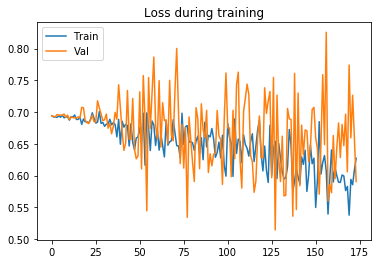

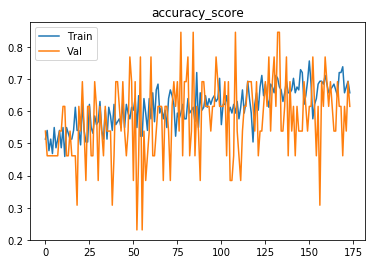

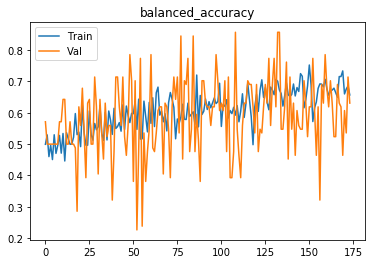

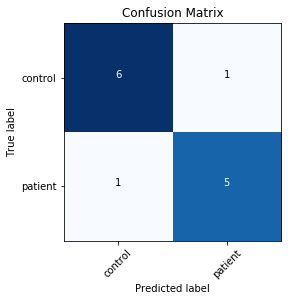

Finished outer fold.
{'final_acc': 0.6071428571428572, 'best_acc': 0.8452380952380951, 'final_iter': 156, 'best_iter': 141, 'params': {'model': 'ModelLiu', 'batch_size': 32, 'patience': 12, 'lr': 5e-05}, 'inner_fold_idx': 2}
################################
################################
All accuracies: [0.5119047619047619, 0.761904761904762, 0.7142857142857143, 0.5476190476190476, 0.5357142857142857, 0.7375, 0.875, 0.7375, 0.5125, 0.6375, 0.7142857142857143, 0.6190476190476191, 0.9166666666666667, 0.8452380952380951, 0.7738095238095238, 0.8333333333333333, 0.8333333333333333, 0.6190476190476191, 0.8333333333333333, 0.6071428571428572, 0.5952380952380952, 0.5238095238095238, 0.5952380952380952, 0.45238095238095233, 0.8452380952380951, 0.5952380952380952, 0.75, 0.761904761904762, 0.6904761904761905, 0.380952380952381, 0.38636363636363635, 0.7727272727272727, 0.5227272727272727, 0.13636363636363635, 0.4772727272727273, 0.7738095238095238, 0.6428571428571428, 0.6190476190476191, 0.64285

In [22]:
fold_metric, models = run(net=None, data=[X, y],
                  k_folds=-1,
                  callbacks=None,
                  augmentations=augmentations,
                  shape=-1,
                  masked=False,
                  metrics=metrics,
                  num_epochs=num_epochs,
                  retain_metric=retain_metric,
                  b=None
                 )

print(np.mean(fold_metric))
print(np.std(fold_metric))

In [23]:
5/0

ZeroDivisionError: division by zero

In [19]:
training_res = [{'final_acc': 0.761904761904762, 'best_acc': 0.9166666666666667, 'final_iter': 178, 'best_iter': 166, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 5e-05}, 'inner_fold_idx': 1},
                {'final_acc': 0.875, 'best_acc': 1.0, 'final_iter': 176, 'best_iter': 160, 'params': {'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}, 'inner_fold_idx': 1},
                {'final_acc': 0.9166666666666667, 'best_acc': 1.0, 'final_iter': 163, 'best_iter': 151, 'params': {'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}, 'inner_fold_idx': 2},
                {'final_acc': 0.8333333333333333, 'best_acc': 0.8571428571428572, 'final_iter': 177, 'best_iter': 132, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 5e-05}, 'inner_fold_idx': 0},
                {'final_acc': 0.8452380952380951, 'best_acc': 0.8452380952380951, 'final_iter': 179, 'best_iter': 179, 'params': {'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}, 'inner_fold_idx': 4},
                {'final_acc': 0.6904761904761905, 'best_acc': 0.75, 'final_iter': 159, 'best_iter': 126, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 16, 'lr': 0.0001}, 'inner_fold_idx': 3},
                {'final_acc': 0.7727272727272727, 'best_acc': 0.7727272727272727, 'final_iter': 161, 'best_iter': 73, 'params': {'model': 'ModelLiu', 'batch_size': 12, 'patience': 12, 'lr': 5e-05}, 'inner_fold_idx': 1},
                {'final_acc': 0.7738095238095238, 'best_acc': 0.7857142857142857, 'final_iter': 174, 'best_iter': 171, 'params': {'model': 'ModelLiu', 'batch_size': 16, 'patience': 16, 'lr': 0.0001}, 'inner_fold_idx': 0},
                {'final_acc': 0.6309523809523809, 'best_acc': 0.9166666666666667, 'final_iter': 184, 'best_iter': 168, 'params': {'model': 'ModelLiu', 'batch_size': 32, 'patience': 16, 'lr': 5e-05}, 'inner_fold_idx': 4},
                {'final_acc': 0.6071428571428572, 'best_acc': 0.8452380952380951, 'final_iter': 156, 'best_iter': 141, 'params': {'model': 'ModelLiu', 'batch_size': 32, 'patience': 12, 'lr': 5e-05}, 'inner_fold_idx': 2}
]

In [20]:
len(training_res)

10

In [21]:
res_df = pd.DataFrame(training_res)

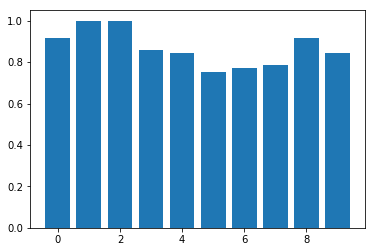

0.8689393939393939
0.7707251082251083


In [22]:
plt.bar(np.arange(len(res_df["best_acc"])), res_df["best_acc"])
plt.show()
print(np.mean(res_df["best_acc"]))
print(np.mean(res_df["final_acc"]))

In [23]:
print(np.mean(res_df["final_iter"]))

170.7


In [24]:
print(res_df["final_iter"])

0    178
1    176
2    163
3    177
4    179
5    159
6    161
7    174
8    184
9    156
Name: final_iter, dtype: int64


# Start inference

### Using best model checkpoint for inference

In [25]:
def majority_vote_patches(img, net, gpu):
    # forward each patch per subject
    patch_preds = []
    avg_score = 0
    for i in range(img.shape[2]):
        patch = img[:,:,i].to(torch.device("cuda:" + str(gpu)))

        patch_output = net.forward(patch)
        patch_score = torch.sigmoid(patch_output)
        patch_pred = patch_score >= 0.5
        patch_preds.append(patch_pred.cpu().numpy().item())
        avg_score += patch_score.cpu().numpy().item()
    # take vote of predictions
    print(patch_preds)
    pred = Counter(patch_preds).most_common(1)[0][0]
    avg_score /= img.shape[2]
    return pred, avg_score

In [26]:
metrics = []
random_states = np.arange(20, 30) # important to use the same values as during training
maj_vote = True

for outer_fold, r in enumerate(random_states):
    print("Outer fold {}".format(outer_fold))

    all_scores = []
    all_preds = []
    all_labels = []
    
    train_res = training_res[outer_fold]
    model_dir = os.path.join(output_dir,"outer_{}_inner_{}_cv_fold_{}_BEST_ITERATION.h5".format(outer_fold, train_res["inner_fold_idx"], outer_fold * 5 + train_res["inner_fold_idx"]))
    model_name = train_res["params"]["model"]
    net = pick_model(model_name)
    state_dict = torch.load(model_dir, map_location='cpu')
    new_state_dict = OrderedDict()
    for param in state_dict.items():
        new_state_dict.update([(param[0].replace("module.", ""), param[1])])
        
    net.load_state_dict(new_state_dict)
    net = net.cuda(gpu)
    net.eval()
    
    
    # load data
    # separate new test set each run
    _, X_test, _, y_test = train_test_split(X, y, test_size=0.15, random_state=r)
    if zero_one_normalize:
        intensity = IntensityRescale()
        ms_data_test = MSDataset(X_test, y_test, transform=transforms.Compose([intensity]), mask=mask, dtype=dtype, patched=True, all_locs=True)
    else:
        ms_data_test = MSDataset(X_test, y_test, transform=None, mask=mask, dtype=dtype, patched=True, all_locs=True)
        
    print(len(ms_data_test))
    test_loader = DataLoader(
            ms_data_test, batch_size=1, num_workers=1, shuffle=False
)
    with torch.no_grad():
        for sample in test_loader:
            img = sample["image"]
            label = sample["label"]
            img = img.to(torch.device("cuda:" + str(gpu)))
            print(f"Label {label}")
            if maj_vote:
                # run for all patches
                pred, score = majority_vote_patches(img, net, gpu)
            else:
                img = img.to(torch.device("cuda:" + str(gpu)))
                output = net.forward(img)
                score = torch.sigmoid(output)
                pred = score >= 0.5
                score = score.numpy().item()
                pred = pred.numpy().item()
            # append for scoring
            all_scores.append(score)
            all_preds.append(pred)
            all_labels.append(label.numpy().item())
    
    balanced_acc = balanced_accuracy(all_labels, all_preds)
    roc_score = roc_auc_score(all_labels, all_scores)
    sens = sensitivity(all_labels, all_preds)
    spec = specificity(all_labels, all_preds)
    print("Bal. accuracy {:.3f} %".format(balanced_acc*100))
    print("ROC AUC Score {:.3f} %".format(roc_score*100))
    print("Sensitivity {:.3f} %".format(sens*100))
    print("Specificity {:.3f} %".format(spec*100))
    metrics.append([balanced_acc, roc_score, sens, spec])
# reset network to training mode6
net.train()
print("######## Final results ########")
metrics_df = pd.DataFrame(metrics, columns=["Bal Acc", "ROC AUC", "Sensitivity", "Specificity"])
print(metrics_df)
print("Balanced accuracy mean {:.3f} % ({:.2f})".format(np.mean(metrics_df["Bal Acc"])*100, np.std(metrics_df["Bal Acc"])*100))
print("ROC AUC mean {:.3f} % ({:.2f})".format(np.mean(metrics_df["ROC AUC"])*100, np.std(metrics_df["ROC AUC"])*100))
print("Sensitivity mean {:.3f} % ({:.2f})".format(np.mean(metrics_df["Sensitivity"])*100, np.std(metrics_df["Sensitivity"])*100))
print("Specificity mean {:.3f} % ({:.2f})".format(np.mean(metrics_df["Specificity"])*100, np.std(metrics_df["Specificity"])*100))

Outer fold 0
23
Label tensor([[0.]])
[1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0]
Label tensor([[0.]])
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[1.]])
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[1.]])
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[1.]])


/home/fabiane/anaconda2/envs/mort1/lib/python3.6/site-packages/torch/nn/functional.py:1320: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[0.]])
[1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 1]
Label tensor([[0.]])
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[0.]])
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[1.]])
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[1.]])
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[0.]])
[1, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1]
Label tensor([[1.]])
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[1.]])
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[1.]])
[1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 

[0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[0.]])
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[1.]])
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[1.]])
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[0.]])
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0]
Label tensor([[0.]])
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[0.]])
[0, 1, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 1, 1, 0, 1]
Label tensor([[1.]])
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[1.]])
[1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[1.]])
[1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

Bal. accuracy 63.636 %
ROC AUC Score 87.879 %
Sensitivity 100.000 %
Specificity 27.273 %
Outer fold 7
23
Label tensor([[1.]])
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[0.]])
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[0.]])
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[0.]])
[1, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Label tensor([[0.]])
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[0.]])
[1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1]
Label tensor([[0.]])
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[1.]])
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]
Label tensor([[1.]])
[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1

Note: Very bad at predicing negative class, only some patches predict it but most do not.